## Capston Project Heart Disease Predition - Group 2

#### Problem Statement
1. World Health Organization has estimated 12 million deaths occur worldwide; every year due to Heart diseases. Half the deaths in the United States and other developed countries are due to cardiovascular diseases. The early prognosis of cardiovascular diseases can aid in making decisions on lifestyle changes in high-risk patients and in turn reduce the complications. This research intends to pinpoint the most relevant/risk factors of heart disease as well as predict the overall risk 

2. We have to predict whether the patient has 10-year risk of future coronary heart disease (CHD)


#### Details

Data:
4238 rows, 16 columns

Data Structure:
    
Demographic
Sex: male or female(Nominal)
Age: Age of the patient;(Continuous - Although the recorded ages have been truncated to whole numbers, the concept of age is continuous)

Behavioral
Current Smoker: whether or not the patient is a current smoker (Nominal)
Cigs Per Day: the number of cigarettes that the person smoked on average in one day.(can be considered continuous as one can have any number of cigarettes, even half a cigarette.)

Medical( history)
BP Meds: whether or not the patient was on blood pressure medication (Nominal)
Prevalent Stroke: whether or not the patient had previously had a stroke (Nominal)
Prevalent Hyp: whether or not the patient was hypertensive (Nominal)
Diabetes: whether or not the patient had diabetes (Nominal)

Medical(current)
Tot Chol: total cholesterol level (Continuous)
Sys BP: systolic blood pressure (Continuous)
Dia BP: diastolic blood pressure (Continuous)
BMI: Body Mass Index (Continuous)
Heart Rate: heart rate (Continuous - In medical research, variables such as heart rate though in fact discrete, yet are considered continuous because of large number of possible values.)
Glucose: glucose level (Continuous)

Predict variable (desired target)
10 year risk of coronary heart disease CHD (binary: “1”, means “Yes”, “0” means “No”)


### Importing necessary librarires

In [131]:
#Basic libraries for dataframes and numeric computations
import numpy as np
import pandas as pd

#Preprocessing libraries
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
#!pip install impyute
from impyute.imputation.cs import mice
#!pip install dython --> #corelation for categorical attributes
from dython.nominal import associations

#Scale data
from sklearn.preprocessing import MinMaxScaler
#For outlier detection
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

#PCA
from sklearn.decomposition import PCA

#Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(rc={'figure.figsize':(10,5)})
import warnings
warnings.filterwarnings('ignore')
#!pip install plotnine
#from plotnine.data import mpg
#from plotnine import ggplot, aes, facet_grid, labs, geom_point

#Class imbalance
##!pip install imblearn
#Using SMOTE for class imbalance
from imblearn.over_sampling import SMOTE
from collections import Counter

#Modelling
#Import Library of Logistic Regression
from sklearn.linear_model import LogisticRegression

#pip install mlflow
import mlflow

### Loading the heart diseaase data

In [132]:
df = pd.read_csv('Heart Disease.csv')

# DATA OVERVIEW

In [133]:
#Sample the data
df.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [134]:
#Get shape of the data
df.shape

#Rows = 4238
#Columns = 16

(4238, 16)

In [135]:
#Describe the data and observe distribution of data
df.describe(include = "all")

#1.Observe null counts in each field
#2.Observe Outliers 
#3.Observe min and max values
#4.Observe mean and std

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4238.000000,4238.000000,4133.000000,4238.000000,4209.000000,4185.000000,4238.000000,4238.000000,4238.000000,4188.000000,4238.000000,4238.000000,4219.000000,4237.000000,3850.000000,4238.000000
mean,0.429212,49.584946,1.978950,0.494101,9.003089,0.029630,0.005899,0.310524,0.025720,236.721585,132.352407,82.893464,25.802008,75.878924,81.966753,0.151958
std,0.495022,8.572160,1.019791,0.500024,11.920094,0.169584,0.076587,0.462763,0.158316,44.590334,22.038097,11.910850,4.080111,12.026596,23.959998,0.359023
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,89.875000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [136]:
df.info

<bound method DataFrame.info of       male  age  education  currentSmoker  cigsPerDay  BPMeds  \
0        1   39        4.0              0         0.0     0.0   
1        0   46        2.0              0         0.0     0.0   
2        1   48        1.0              1        20.0     0.0   
3        0   61        3.0              1        30.0     0.0   
4        0   46        3.0              1        23.0     0.0   
...    ...  ...        ...            ...         ...     ...   
4233     1   50        1.0              1         1.0     0.0   
4234     1   51        3.0              1        43.0     0.0   
4235     0   48        2.0              1        20.0     NaN   
4236     0   44        1.0              1        15.0     0.0   
4237     0   52        2.0              0         0.0     0.0   

      prevalentStroke  prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  \
0                   0             0         0    195.0  106.0   70.0  26.97   
1                   0        

In [137]:
#Duplicates check:
len(df[df.duplicated()])

# We observe that the dataset doesn't have any duplicate rows

0

In [138]:
#Listing unique value counts in each feature
def getUniqueValues(data):
    colNames = data.columns
    listUnique = []
    for col in colNames:
        listUnique.append([col, data[col].nunique()])

    d1 = pd.DataFrame(listUnique)
    d1.columns = ['Feature Name', 'Unique Value']
    d1 = d1.sort_values(by='Unique Value', ascending=False)
    return d1

getUniqueValues(df)

#We observe that the following features should be treated as categorical in the future:
#'education','male','currentSmoker','BPMeds','prevalentStroke','prevalentHyp','diabetes','TenYearCHD'

,Feature Name,Unique Value
12,BMI,1363
9,totChol,248
10,sysBP,234
11,diaBP,146
14,glucose,143
13,heartRate,73
1,age,39
4,cigsPerDay,33
2,education,4
0,male,2


In [139]:
#We would like to manually identify education as a categorical field and assign appropriate categories
df.education.value_counts(dropna=False)

1.0    1720
2.0    1253
3.0     687
4.0     473
NaN     105
Name: education, dtype: int64

In [140]:
#We can create a new attribtute call comorbidities, but we later identified that this field is >90% correlated to prevalanetHyp, hence removing it here
#df['comorbidities'] = df['prevalentStroke']+df['prevalentHyp']+df['diabetes']


In [141]:
#checking for class imbalance problem:
df.TenYearCHD.value_counts(normalize=True)

0    0.848042
1    0.151958
Name: TenYearCHD, dtype: float64

###### Our data has a class imbalance problem. Need to address this later

In [142]:
#Checking data types of the data
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['male', 'age', 'currentSmoker', 'prevalentStroke', 'prevalentHyp', 'diabetes', 'TenYearCHD'], float64: ['education', 'cigsPerDay', 'BPMeds', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose']}

# DATA PREPARATION AND FEATURE ENGINEERING

#### Technical Steps

1. Drop columns which are not required
2. Find missing value
3. Visualize missing value
4. Impute missing value 
5. Find Outlier
6. Single variate
7. Multi variate
8. Perform feature engineering
9. Split dataset between training and test in the ration of 70:30

#### 1.Drop columns which are not required

In [143]:
#View all columns
df.columns
#We observe that by viewing the data and attributes, there are no attributes that need to be manually removed
#All attributes will need to go through pre-processing

Index(['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')

In [144]:
df.reset_index(drop=True, inplace=True)
df.shape

(4238, 16)

In [145]:
#checking for any single value columns
def removeSingleValueColumns(data):
    d1 = data.copy()
    for col in d1.columns:
        if d1[col].nunique() == 1:
            d1 = d1.drop([col], axis=1)
    return d1

df=removeSingleValueColumns(df)

#No single value colums are present hence no attributes were dropped

#### 2. Find missing value

In [146]:
#Check for missing value raw counts
df.isnull().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [147]:
def getMissingCount(data):
    missingCount = data.isnull().sum() * 100/ len(data)
    return missingCount
getMissingCount(df)

def getMissingCountpercent(df):
        mis_val_table_ren_columns = pd.DataFrame({
            'dtype': df.dtypes,
            'num_missing': df.isnull().sum(),
            '% missing': round(100 * df.isnull().sum() / len(df), 2)
            }).sort_values('num_missing', ascending=False)
        #missingCount = data.isnull().sum() * 100/ len(data)
                
        return mis_val_table_ren_columns

data_missing = getMissingCount(df)
print(data_missing)

getMissingCountpercent(df)
#We observe that Glucose has the highest % of nulls = 9%, followed by education at 2.4%

male               0.000000
age                0.000000
education          2.477584
currentSmoker      0.000000
cigsPerDay         0.684285
BPMeds             1.250590
prevalentStroke    0.000000
prevalentHyp       0.000000
diabetes           0.000000
totChol            1.179802
sysBP              0.000000
diaBP              0.000000
BMI                0.448325
heartRate          0.023596
glucose            9.155262
TenYearCHD         0.000000
dtype: float64


,dtype,num_missing,% missing
glucose,float64,388,9.16
education,float64,105,2.48
BPMeds,float64,53,1.25
totChol,float64,50,1.18
cigsPerDay,float64,29,0.68
BMI,float64,19,0.45
heartRate,float64,1,0.02
male,int64,0,0.00
age,int64,0,0.00
currentSmoker,int64,0,0.00


###### Since missing values are lower than 10%, we don't need to discard any attribute. We can impute accordingly.

#### 3. Visualize missing value

male               0.000000
age                0.000000
education          2.477584
currentSmoker      0.000000
cigsPerDay         0.684285
BPMeds             1.250590
prevalentStroke    0.000000
prevalentHyp       0.000000
diabetes           0.000000
totChol            1.179802
sysBP              0.000000
diaBP              0.000000
BMI                0.448325
heartRate          0.023596
glucose            9.155262
TenYearCHD         0.000000
dtype: float64


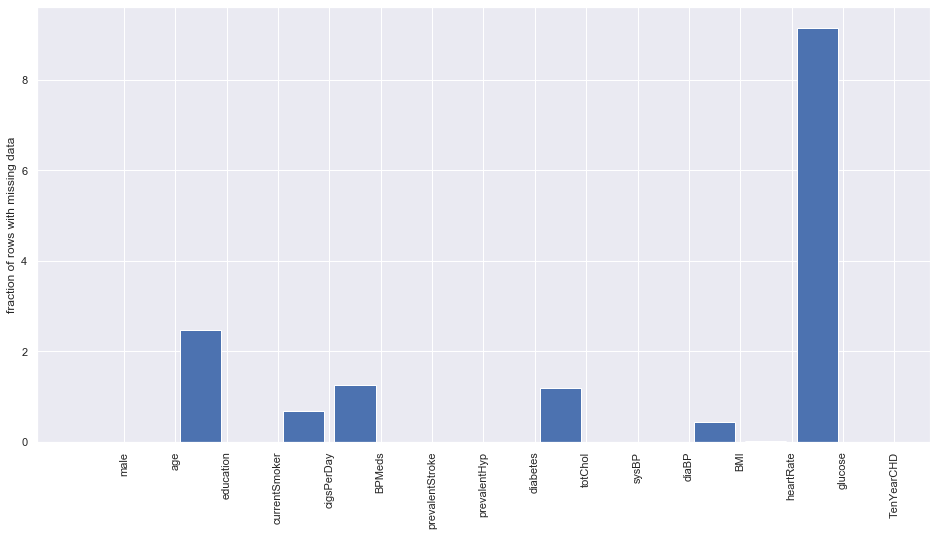

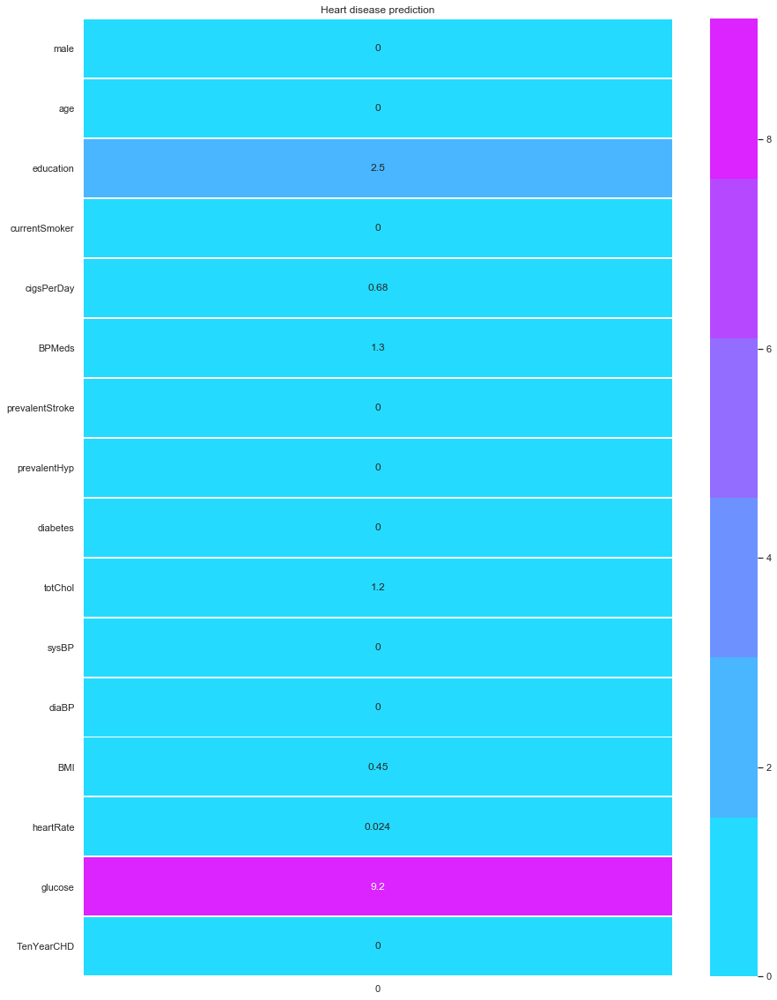

In [148]:
#Visualizing the missing values

def visualizeMissingValue(data):
    missingCount = getMissingCount(data)
    #missingCount = data.isnull().sum()/ len(data)
    print(missingCount)
    plt.figure(figsize=(16, 8))
    plt.xticks(np.arange(len(missingCount)) + 0.5, missingCount.index, rotation='vertical')
    plt.ylabel('fraction of rows with missing data')
    plt.bar(np.arange(len(missingCount)), missingCount)
    plt.show()

    plt.figure(figsize=(15, 20))
    sns.heatmap(pd.DataFrame(data.isnull().sum() / data.shape[0] * 100), annot=True,
    cmap=sns.color_palette("cool"), linewidth=1, linecolor="white")
    plt.title("Heart disease prediction")
    plt.show()
    
visualizeMissingValue(df)

In [149]:
#Identifying columns with high percentage of nulls to drop

def identifyColsToDrop(data, threshold=30.0):
    missingCols = getMissingCount(data)
    colsToDrop = missingCols[missingCols > threshold].index.values
    #colsToDrop = [col for (col, perc) in missingCols[missingCols > threshold].items()]
    return colsToDrop

def dropColumn(data, threshold):
    colsToDrop = self.identifyColsToDrop(data, threshold)
    data1 = data.drop(colsToDrop,axis=1)
    return data1

identifyColsToDrop(df)

# We see that there aren't any nulls > 30% in any attribute

array([], dtype=object)

In [150]:
#Alternate method to check for nulls > threshold
hf = df.isna().sum()
rows = df.count()[0]
Null_cols = hf[((hf*100/rows)>30.00)==True]*100/rows
Null_cols.count()

0

#### 4. Impute missing value

In [151]:
#Segregate data into numerical and categorical

#def getData(self):
#    return self.data

def getCategoricalData(data):
    categoricalCols = getCategoricalCols(data)
    return data[categoricalCols]

def getNumericData(data):
    numericCols =geNumericCols(data)
    return data[numericCols]

def getCategoricalCols( data):
    return data.select_dtypes(include=["category"]).columns

def getObjectCols(data):
    return data.select_dtypes(include=["object"]).columns

def geNumericCols(data):
    return data.select_dtypes(include=["number"]).columns

numericCols =geNumericCols(df) # This will be used Mice and for binning later
categoricalCols =getCategoricalCols(df)
objectCols = getObjectCols(df)

In [152]:
numericCols

Index(['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')

In [153]:
categoricalCols
objectCols

Index([], dtype='object')

In [154]:
#We observe that the function categorizes all features as numeric columns but from earlier unique value observation, 
# we see that we need to manually assign some of these features as categorical
numericCols=['totChol','glucose','sysBP','diaBP','heartRate','age','cigsPerDay','BMI']
categoricalCols=['education','male','currentSmoker','BPMeds','prevalentStroke','prevalentHyp','diabetes','TenYearCHD']
df_numeric=df[numericCols]
df_categorical=df[categoricalCols]

In [155]:
#Using mice to impute null values for the numerical columns
def imputeByMice(data, numericCols):
    dataNumeric = data[numericCols]
    nonNumericCols = [col for col in data.columns if col not in numericCols]
    d2 = data[nonNumericCols]
# start the MICE training
    imputedDataMice = mice(dataNumeric.values)
    d1 = pd.DataFrame(imputedDataMice)
    d1.columns = dataNumeric.columns
    imputedData = pd.concat([d1, d2], axis=1)
## imputedData.columns = data.columns
    return imputedData

df=imputeByMice(df, numericCols)
df
#add other to education

,totChol,glucose,sysBP,diaBP,heartRate,age,cigsPerDay,BMI,male,education,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD
0,195.0,77.000000,106.0,70.0,80.0,39.0,0.0,26.97,1,4.0,0,0.0,0,0,0,0
1,250.0,76.000000,121.0,81.0,95.0,46.0,0.0,28.73,0,2.0,0,0.0,0,0,0,0
2,245.0,70.000000,127.5,80.0,75.0,48.0,20.0,25.34,1,1.0,1,0.0,0,0,0,0
3,225.0,103.000000,150.0,95.0,65.0,61.0,30.0,28.58,0,3.0,1,0.0,0,1,0,1
4,285.0,85.000000,130.0,84.0,85.0,46.0,23.0,23.10,0,3.0,1,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,313.0,86.000000,179.0,92.0,66.0,50.0,1.0,25.97,1,1.0,1,0.0,0,1,0,1
4234,207.0,68.000000,126.5,80.0,65.0,51.0,43.0,19.71,1,3.0,1,0.0,0,0,0,0
4235,248.0,86.000000,131.0,72.0,84.0,48.0,20.0,22.00,0,2.0,1,NaN,0,0,0,0
4236,210.0,77.626327,126.5,87.0,86.0,44.0,15.0,19.16,0,1.0,1,0.0,0,0,0,0


In [156]:
df.isnull().sum()
# We observe that all data has the null values imputed

totChol              0
glucose              0
sysBP                0
diaBP                0
heartRate            0
age                  0
cigsPerDay           0
BMI                  0
male                 0
education          105
currentSmoker        0
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
TenYearCHD           0
dtype: int64

In [157]:
#BPMeds is a categorical field that we can mode impute based on frequency
df.BPMeds.value_counts(normalize=True,dropna=False)

#We observe that 96% of the patients are not taking BP meds 

0.0    0.958235
1.0    0.029259
NaN    0.012506
Name: BPMeds, dtype: float64

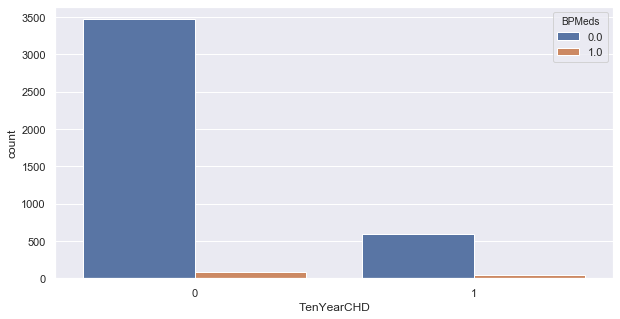

In [158]:
#Viewing the same graphically to determine if mode imputation is required
ax = sns.countplot(x="TenYearCHD", hue="BPMeds", data=df)

In [159]:
#performing mode imputation for BPMeds
df["BPMeds"].replace(np.nan, 0, inplace = True)

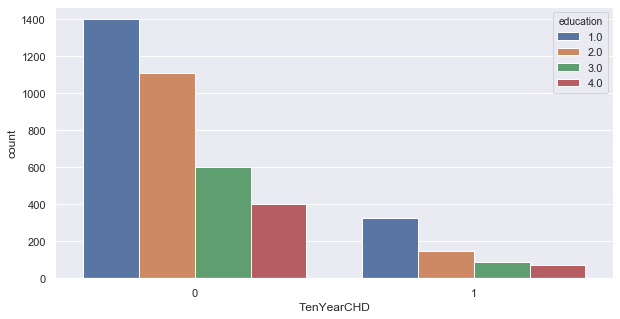

In [160]:
#Education is a categorical field that we can mode impute based on frequency
#Viewing the same graphically to determine if mode imputation is required
ax = sns.countplot(x="TenYearCHD", hue="education", data=df)

In [162]:
#identifying rows to drop
df.education.value_counts(dropna=False)

#Option 1: We can drop the rows with unknown education as we cannot guess this and it's a small percentage
#df = df[df['education'].notna()]
#df.education.value_counts(dropna=False)

#Option 2: mode impute educations. In this case Some high school has the highest frequency 
#Option 3: Create a new category called other/5
df["education"].replace(np.nan, 5.0, inplace = True)

In [163]:
df.isnull().sum()
#Data has no more nulls

totChol            0
glucose            0
sysBP              0
diaBP              0
heartRate          0
age                0
cigsPerDay         0
BMI                0
male               0
education          0
currentSmoker      0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
TenYearCHD         0
dtype: int64

In [164]:
#Replacing Education with known categories
df["education"].replace(1, "Some High School", inplace = True)
df["education"].replace(2, "High School", inplace = True)
df["education"].replace(3, "Some College", inplace = True)
df["education"].replace(4, "College", inplace = True)
df["education"].replace(5, "Other", inplace = True)

#### No more nulls present. Missing value imputation completed

#### 5. Find Outlier

In [165]:
#checking for outliers manually
df.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,totChol,glucose,sysBP,diaBP,heartRate,age,cigsPerDay,BMI,male,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD
count,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000
mean,236.765942,81.966661,132.352407,82.893464,75.879197,49.584946,9.004416,25.801460,0.429212,0.494101,0.029259,0.005899,0.310524,0.025720,0.151958
std,44.353645,22.881546,22.038097,11.910850,12.025190,8.572160,11.880388,4.073152,0.495022,0.500024,0.168552,0.076587,0.462763,0.158316,0.359023
min,107.000000,40.000000,83.500000,48.000000,44.000000,32.000000,0.000000,15.540000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,206.000000,72.000000,117.000000,75.000000,68.000000,42.000000,0.000000,23.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,234.000000,78.536213,128.000000,82.000000,75.000000,49.000000,0.000000,25.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,263.000000,86.000000,144.000000,89.875000,83.000000,56.000000,20.000000,28.040000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
90%,292.000000,97.000000,162.000000,98.000000,92.000000,62.000000,25.000000,30.770000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
95%,312.000000,107.000000,175.000000,104.575000,98.000000,64.000000,30.000000,32.771500,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
99%,353.630000,170.000000,200.000000,118.000000,110.000000,67.000000,43.000000,38.952600,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000


In [166]:
#In order to further use the data in outlier detection convert object fields to numerical
def labelEncoder(data, columns):
    d1 = data.copy()
    for i in columns:
        le = LabelEncoder()
        d1[i] = le.fit_transform(d1[i])
    return d1
df=labelEncoder(df,columns=['education'])

array([[  0.        ,   3.62154663,   5.88055036,   7.43706236,
          7.45859461],
       [  0.        ,   3.62154663,   6.29715015,   7.6749202 ,
          7.90669277],
       [  0.        ,   4.36320983,   6.38270194,   7.76548753,
          8.1121081 ],
       ...,
       [  0.        ,  97.11780939, 114.85981064, 130.73141359,
        147.25902222],
       [  0.        , 113.12788737, 152.25187815, 155.98745751,
        172.92042245],
       [  0.        , 113.12788737, 235.60002462, 245.62125824,
        257.92650193]])

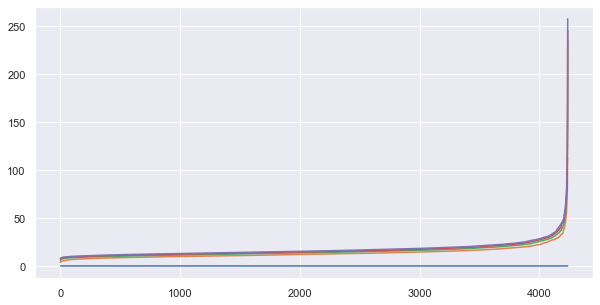

In [167]:
#Outlier detection using DBSCAN

def findDBScanEPS(data, n_neighbors):
    nn = NearestNeighbors(n_neighbors=n_neighbors)
    nbrs = nn.fit(data)
    distances, indices = nbrs.kneighbors(data)

    distances = np.sort(distances, axis=0)
    #distances = distances[:, 1]
    plt.plot(distances)
    return distances
findDBScanEPS(df, 5)

#LL: What does the y axis represent here? is it the number of clusters that will cover 4000 rows? 
#Y axis = distance of every row .. ePS .. choose max curvature point for best eps.. use 16 features cal euc dist between 2 rows
#the nearest distance is eps --- 5 lines is for each neighbor.. last line is nn=5... print distance to see matrix

Estimated number of clusters: 30
Estimated number of noise points: 134


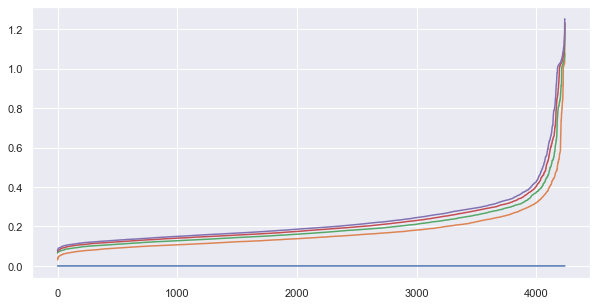

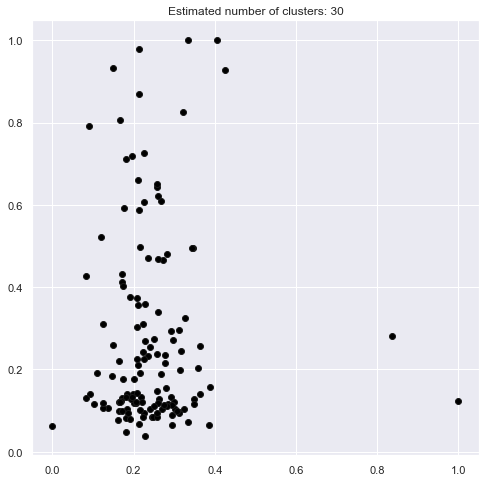

In [168]:
def DBScanOutlier(data): # DBSCAN (Density-Based Spatial Clustering of Applications with Noise)
#try:
# dataNumeric = data.drop(nonNumeric, axis=1)
    d1 = data.copy()
#d1 = pd.get_dummies(d1[numericCols])

    scaler = MinMaxScaler()
    d2 = scaler.fit_transform(d1)
    d2 = pd.DataFrame(d2, columns=d1.columns)

    findDBScanEPS(d2, 5)
# epsfloat, default=0.5
# The maximum distance between two samples for one to be considered as in the neighborhood of the other.
# This is not a maximum bound on the distances of points within a cluster. This is the most important DBSCAN
# parameter to choose appropriately for your data set and distance function.
# min_samplesint, default=5
# The number of samples (or total weight) in a neighborhood for a point to be considered as a core point.
# This includes the point itself.

    db = DBSCAN(eps=0.5, min_samples=5).fit(d2)

    from sklearn import metrics
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
# detectedCluster = DBSCAN(eps=3.0, metric='euclidean', min_samples=10, n_jobs=-1)
# clusters = detectedCluster.fit_predict(d2)
# Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    print('Estimated number of clusters: %d' % n_clusters_)
    print('Estimated number of noise points: %d' % n_noise_)
#print("Homogeneity: %0.3f" % metrics.homogeneity_score(len(d2), labels))
#print("Completeness: %0.3f" % metrics.completeness_score(len(d2), labels))
#print("V-measure: %0.3f" % metrics.v_measure_score(len(d2), labels))
#print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(len(d2), labels))
#print("Adjusted Mutual Information: %0.3f" % metrics.adjusted_mutual_info_score(len(d2), labels))
#print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(d2, labels))

# Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
    for each in np.linspace(0, 1, len(unique_labels))]
    plt.figure(figsize=(8, 8))
    for k, col in zip(unique_labels, colors):
        if k == -1:
# Black used for noise.
            col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = d2[class_member_mask & core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14)

    xy = d2[class_member_mask & ~core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

    plt.title('Estimated number of clusters: %d' % n_clusters_)
    plt.show()

#cmap = cm.get_cmap('Set1')
#d2.plot.scatter(x='avgDeathsPerYear', y='avgAnnCount', c=clusters, cmap=cmap, colorbar=False)
#plt.close()
    outlierRow = []
    for i in range(len(labels)):
        if (labels[i] == -1):
#print(list((i, labels[i])))
            outlierRow.append(i)

    return outlierRow

#except Exception as exp:
#err = self.errObj.handleErr(str(exp))
#print(str(err))


outlierRow=DBScanOutlier(df)

#LL: check: Graph 1 : elbow is the best eps distance i.e. 0.5. what does lower and higher indicate from this graph
#what is the second scatter graph-- noise points.. 
#try local outlier factor as another method for outlier detection. 

In [169]:
#df_o=df.drop(df.index[outlierRow], inplace=True)
#df_o.reset_index(drop=True, inplace=True)
#df_o.shape

#### During modeling we will run the model with and without outliers

In [170]:
#Moving the target variable to the end
cols_at_end = ['TenYearCHD']
df = df[[c for c in df if c not in cols_at_end] 
        + [c for c in cols_at_end if c in df]]

In [171]:
#Scaling the data for outlier visualization
def minMaxScaler(data):
    scaler = MinMaxScaler()
    scaledData = scaler.fit_transform(data)
    scaledData = pd.DataFrame(scaledData, columns=data.columns)
    return scaledData

scaledData=minMaxScaler(df)

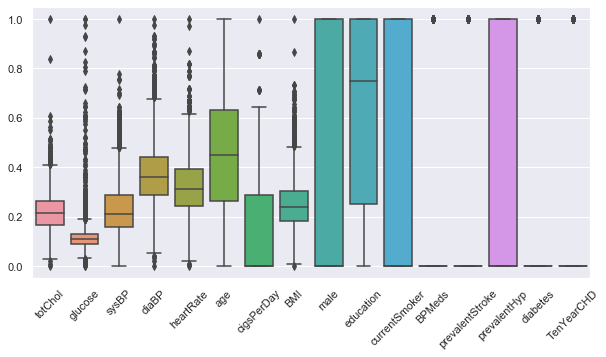

In [172]:
#Visualizing the outliers
def visualizeOutlier(scaledData):
# dataNumeric = data.drop(nonNumeric, axis=1)
    sns.boxplot(data=scaledData.iloc[:,0:16])
    plt.xticks(rotation=45)
visualizeOutlier(scaledData)

#### 5. Single Variate

In [173]:
df.male.value_counts(dropna=False)

0    2419
1    1819
Name: male, dtype: int64

In [174]:
df.currentSmoker.value_counts(dropna=False)

0    2144
1    2094
Name: currentSmoker, dtype: int64

In [175]:
df.prevalentStroke.value_counts(dropna=False)

0    4213
1      25
Name: prevalentStroke, dtype: int64

In [176]:
df.prevalentHyp.value_counts(dropna=False)

0    2922
1    1316
Name: prevalentHyp, dtype: int64

In [177]:
df.diabetes.value_counts(dropna=False)

0    4129
1     109
Name: diabetes, dtype: int64

#### 6. Multi Variate

In [178]:
#Correlation and Will do this with logistic regression later

#### 7. Perform feature engineering

In [179]:
#Performing correlation analysis for numerical fields
def correlation(dataset,threshold):
    corr_col = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j] >=threshold) and (corr_matrix.columns[j] not in corr_col):
                colname = corr_matrix.columns[i]
                corr_col.add(colname)
                if colname in dataset.columns:
                    del dataset[colname]
                    
    print(corr_col)
    return corr_col
    
#corr_col = correlation(df,0.9)
corr_col = correlation(df_numeric,0.9)

#We observe that there are no fields with correlarion > 90% hence not dropping any fields
#the function corr works on a concept of regression
#If we had a set of fieldsfrom above, then we need to delete these columns from df

set()


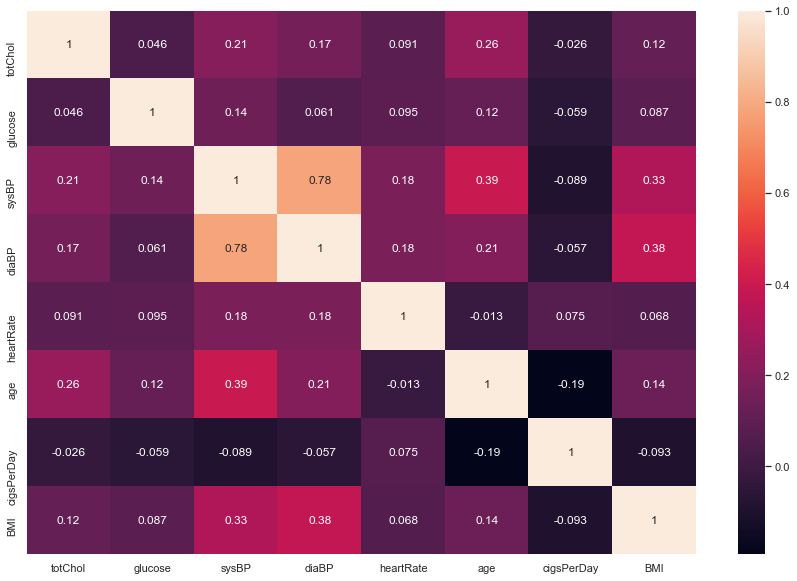

In [180]:
plt.figure(figsize=(15, 10))
corr = df_numeric.corr()
sns.heatmap(corr, annot=True)
plt.show()

In [181]:
#Identifying catergorical fields (correlation uses chi-square)
df_categorical

,education,male,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD
0,4.0,1,0,0.0,0,0,0,0
1,2.0,0,0,0.0,0,0,0,0
2,1.0,1,1,0.0,0,0,0,0
3,3.0,0,1,0.0,0,1,0,1
4,3.0,0,1,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...
4233,1.0,1,1,0.0,0,1,0,1
4234,3.0,1,1,0.0,0,0,0,0
4235,2.0,0,1,NaN,0,0,0,0
4236,1.0,0,1,0.0,0,0,0,0


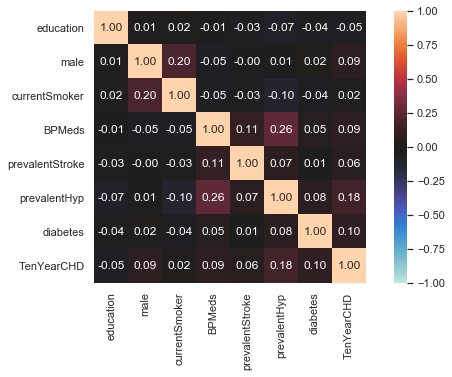

{'corr':                  education      male  currentSmoker    BPMeds  \
 education         1.000000  0.009271       0.020058 -0.009721   
 male              0.009271  1.000000       0.197596 -0.051545   
 currentSmoker     0.020058  0.197596       1.000000 -0.048358   
 BPMeds           -0.009721 -0.051545      -0.048358  1.000000   
 prevalentStroke  -0.029991 -0.004546      -0.032988  0.114609   
 prevalentHyp     -0.074963  0.005313      -0.103260  0.258697   
 diabetes         -0.037320  0.015708      -0.044295  0.051394   
 TenYearCHD       -0.051109  0.088428       0.019456  0.086417   
 
                  prevalentStroke  prevalentHyp  diabetes  TenYearCHD  
 education              -0.029991     -0.074963 -0.037320   -0.051109  
 male                   -0.004546      0.005313  0.015708    0.088428  
 currentSmoker          -0.032988     -0.103260 -0.044295    0.019456  
 BPMeds                  0.114609      0.258697  0.051394    0.086417  
 prevalentStroke         1.000000   

In [182]:
#Performing correlation on catergorical fields
associations(df_categorical)
#We observe that none of the fields are correlated > 90% hence not dropping any fields
#Alternative visual : associations(df_categorical, theil_u=True, figsize=(15, 15))
#On adding comorbidities correlation was 0.94 with prevalentHyp. So removed this field.

###### Neither of the attributes are highly correlated hence no requirement to drop any attributes

In [183]:
#Binning the data for all numeric columns
def createBin(data, numericCols, binNumber=4):
    d1 = data.copy()
    for i in numericCols[1:len(numericCols)]:
        bins = np.linspace(d1[i].min(), d1[i].max(), binNumber)
        d1[i + "Bin"] = pd.cut(d1[i], bins, precision=1, include_lowest=True, right=True)
#d1['PctWhiteBin'] = d1.PctWhiteBin.astype('category')

# d1['PctWhiteBin'] = pd.cut(d1.PctWhite / 100, bins, include_lowest=True, right=True)
    return d1

df_bin=createBin(df, numericCols, binNumber=4)
#look at distribution of data in the bins from the pct results and accordingly change the bin size. Here we can use bin size 10 and iterate model
#do binning for all numeric columns not categorical (covert to pct). 
df_bin

,totChol,glucose,sysBP,diaBP,heartRate,age,cigsPerDay,BMI,male,education,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,glucoseBin,sysBPBin,diaBPBin,heartRateBin,ageBin,cigsPerDayBin,BMIBin
0,195.0,77.000000,106.0,70.0,80.0,39.0,0.0,26.97,1,0,0,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(47.9, 79.5]","(77.0, 110.0]","(31.9, 44.7]","(-0.1, 23.3]","(15.4, 29.3]"
1,250.0,76.000000,121.0,81.0,95.0,46.0,0.0,28.73,0,1,0,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]"
2,245.0,70.000000,127.5,80.0,75.0,48.0,20.0,25.34,1,4,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]"
3,225.0,103.000000,150.0,95.0,65.0,61.0,30.0,28.58,0,3,1,0.0,0,1,0,1,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(57.3, 70.0]","(23.3, 46.7]","(15.4, 29.3]"
4,285.0,85.000000,130.0,84.0,85.0,46.0,23.0,23.10,0,3,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,313.0,86.000000,179.0,92.0,66.0,50.0,1.0,25.97,1,4,1,0.0,0,1,0,1,"(39.9, 158.0]","(154.0, 224.5]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]"
4234,207.0,68.000000,126.5,80.0,65.0,51.0,43.0,19.71,1,3,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(23.3, 46.7]","(15.4, 29.3]"
4235,248.0,86.000000,131.0,72.0,84.0,48.0,20.0,22.00,0,1,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(47.9, 79.5]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]"
4236,210.0,77.626327,126.5,87.0,86.0,44.0,15.0,19.16,0,4,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(31.9, 44.7]","(-0.1, 23.3]","(15.4, 29.3]"


In [184]:
#Getting percentage distribution of all categorical fields
def createCategoryPct(data, categoricalCols):
    d1 = data.copy()
    length = len(d1)
    for i in categoricalCols[1:len(categoricalCols)]:
        d1[i + 'Pct'] = (d1[i].groupby(d1[i]).transform('count'))*100/length
#d1[i + 'Pct'] = round(d1[i + 'Pct'],2)
#bins = np.linspace(d1[i].min(), d1[i].max(), binNumber)
#d1[i + "Bin"] = pd.cut(d1[i], bins, include_lowest=True, right=True)
    return d1
df_pct=createCategoryPct(df, categoricalCols)

#df_pct.drop(['education','male','currentSmoker','BPMeds','prevalentStroke','prevalentHyp','diabetes','TenYearCHD'],inplace=True,axis = 1)
cols = df_pct.columns.difference(df_bin.columns)
df_bin_pct=pd.concat([df_bin, df_pct[cols]], axis=1)
#df=pd.concat([df_bin, df_pct], axis=1)
#use max col width to get bin columns

In [185]:
#Displaying combined attributes including binning and percentage. Drop the target variale converted to percentage
pd.set_option("display.max_columns", 100)
df_bin_pct.drop(['TenYearCHDPct'],inplace=True,axis = 1)
df_bin_pct
#Use one hot encoding to identify influencial bins. Use 10 bins here for modelling

,totChol,glucose,sysBP,diaBP,heartRate,age,cigsPerDay,BMI,male,education,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,glucoseBin,sysBPBin,diaBPBin,heartRateBin,ageBin,cigsPerDayBin,BMIBin,BPMedsPct,currentSmokerPct,diabetesPct,malePct,prevalentHypPct,prevalentStrokePct
0,195.0,77.000000,106.0,70.0,80.0,39.0,0.0,26.97,1,0,0,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(47.9, 79.5]","(77.0, 110.0]","(31.9, 44.7]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,50.589901,97.428032,42.921189,68.947617,99.410099
1,250.0,76.000000,121.0,81.0,95.0,46.0,0.0,28.73,0,1,0,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,50.589901,97.428032,57.078811,68.947617,99.410099
2,245.0,70.000000,127.5,80.0,75.0,48.0,20.0,25.34,1,4,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,49.410099,97.428032,42.921189,68.947617,99.410099
3,225.0,103.000000,150.0,95.0,65.0,61.0,30.0,28.58,0,3,1,0.0,0,1,0,1,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(57.3, 70.0]","(23.3, 46.7]","(15.4, 29.3]",97.074092,49.410099,97.428032,57.078811,31.052383,99.410099
4,285.0,85.000000,130.0,84.0,85.0,46.0,23.0,23.10,0,3,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,49.410099,97.428032,57.078811,68.947617,99.410099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,313.0,86.000000,179.0,92.0,66.0,50.0,1.0,25.97,1,4,1,0.0,0,1,0,1,"(39.9, 158.0]","(154.0, 224.5]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,49.410099,97.428032,42.921189,31.052383,99.410099
4234,207.0,68.000000,126.5,80.0,65.0,51.0,43.0,19.71,1,3,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(43.9, 77.0]","(44.7, 57.3]","(23.3, 46.7]","(15.4, 29.3]",97.074092,49.410099,97.428032,42.921189,68.947617,99.410099
4235,248.0,86.000000,131.0,72.0,84.0,48.0,20.0,22.00,0,1,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(47.9, 79.5]","(77.0, 110.0]","(44.7, 57.3]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,49.410099,97.428032,57.078811,68.947617,99.410099
4236,210.0,77.626327,126.5,87.0,86.0,44.0,15.0,19.16,0,4,1,0.0,0,0,0,0,"(39.9, 158.0]","(83.4, 154.0]","(79.5, 111.0]","(77.0, 110.0]","(31.9, 44.7]","(-0.1, 23.3]","(15.4, 29.3]",97.074092,49.410099,97.428032,57.078811,68.947617,99.410099


#### PCA

       PCA0      PCA1      PCA2      PCA3      PCA4      PCA5      PCA6  \
0  0.114168 -0.074234 -0.869225  0.589500 -0.190055  0.025330 -0.001098   
1 -0.500280 -0.512606 -0.195231  0.350853 -0.042068  0.003155  0.020966   
2  0.776880  0.062308 -0.150413 -0.473546 -0.005739 -0.003867 -0.034057   
3 -0.038881  0.388524  0.932414 -0.070342  0.194055 -0.131924  0.043016   
4  0.259968 -0.499110  0.487824 -0.200993 -0.008939  0.004977  0.005297   
5 -0.782568  0.346697  0.255842  0.544262 -0.272845 -0.043838  0.073420   
6 -0.625636 -0.356478 -0.173136 -0.434545  0.290799 -0.067118 -0.034843   
7  0.318382 -0.606577  0.435758  0.285172  0.039460 -0.013862  0.005248   
8 -0.307696  0.942436 -0.361419 -0.241688 -0.166408 -0.094453  0.024344   
9  0.538850  0.898070  0.331211 -0.276600 -0.311080 -0.037719  0.054170   

       PCA7      PCA8      PCA9     PCA10     PCA11     PCA12     PCA13  \
0  0.007780 -0.104859 -0.053063  0.082506  0.005913 -0.036276  0.000281   
1  0.204504 -0.064781 -0

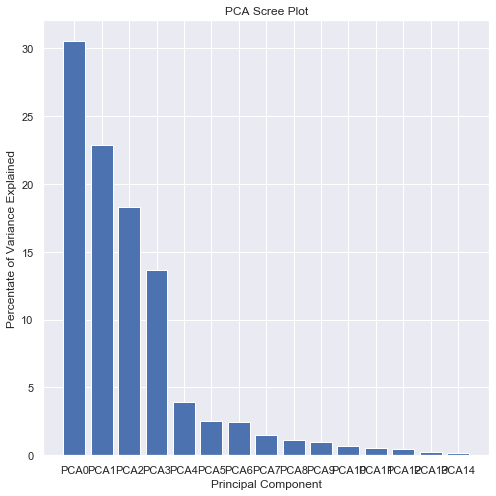

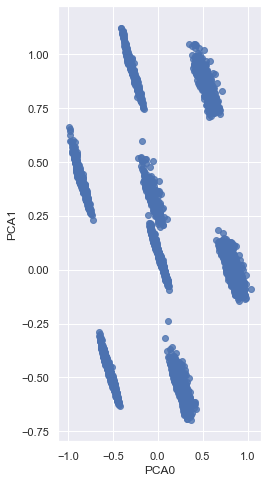

[0.30541659 0.2284886  0.18324099 0.1366866  0.0395948  0.02543873
 0.02427942 0.01471464 0.01099657 0.00959868 0.00689333 0.0054618
 0.00474767 0.00241063 0.00203094]
[0.30541659 0.53390519 0.71714618 0.85383278 0.89342758 0.91886631
 0.94314572 0.95786037 0.96885694 0.97845562 0.98534895 0.99081075
 0.99555843 0.99796906 1.        ]


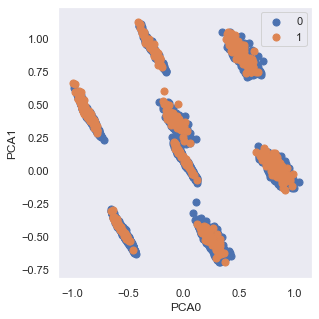

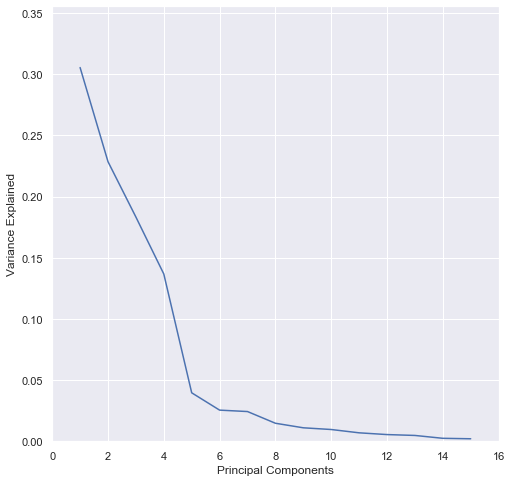

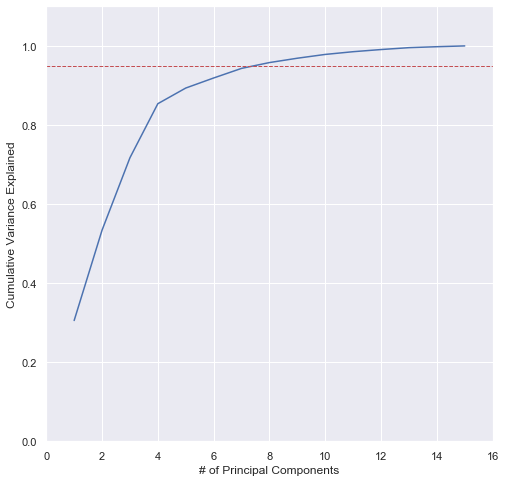

,PCA0,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,PCA13,PCA14,TenYearCHD
0,0.114168,-0.074234,-0.869225,0.589500,-0.190055,0.025330,-0.001098,0.007780,-0.104859,-0.053063,0.082506,0.005913,-0.036276,0.000281,-0.014719,0
1,-0.500280,-0.512606,-0.195231,0.350853,-0.042068,0.003155,0.020966,0.204504,-0.064781,-0.015978,0.084062,0.002942,0.008768,-0.023789,0.005286,0
2,0.776880,0.062308,-0.150413,-0.473546,-0.005739,-0.003867,-0.034057,0.028711,0.017740,-0.008523,-0.010803,-0.007050,0.025876,-0.013032,-0.024745,0
3,-0.038881,0.388524,0.932414,-0.070342,0.194055,-0.131924,0.043016,-0.086121,0.082949,0.222419,0.023201,0.001957,-0.068879,0.034842,0.076059,1
4,0.259968,-0.499110,0.487824,-0.200993,-0.008939,0.004977,0.005297,0.125415,-0.001781,0.070966,-0.055054,-0.007552,0.077042,0.009549,0.017685,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,0.426117,0.907551,0.264692,-0.294923,-0.097591,-0.080641,0.019907,-0.123580,0.131550,-0.236594,-0.046073,-0.037285,0.141827,0.076628,-0.095419,1
4234,0.871762,0.038325,-0.128196,-0.242806,0.101539,-0.032331,-0.045558,-0.027026,-0.029782,0.313093,-0.151965,0.005836,-0.042710,-0.017838,-0.006142,0
4235,0.300929,-0.573933,0.448725,0.278188,0.112777,-0.014737,0.012357,0.050628,-0.075119,0.034471,-0.025604,0.000758,0.015301,0.046069,-0.041160,0
4236,0.220603,-0.486049,0.485222,-0.434689,-0.106595,0.009125,-0.002381,0.084944,-0.014809,-0.053274,-0.154975,0.005039,-0.026555,-0.024453,0.033621,0


In [186]:
response='TenYearCHD'

def scaleData(data):
            scaler = MinMaxScaler(feature_range=(0, 1))
            d2 = scaler.fit_transform(data)
            scaledData = pd.DataFrame(d2, columns=data.columns)
            return scaledData
        
def performPCA(data):
            pca = PCA()  # n_components=10
            # pca = SparsePCA()
            pcaModel = pca.fit(data)
            pcaTransformed = pd.DataFrame(pcaModel.transform(data), columns=range(data.shape[1]))
            for i in range(len(pcaTransformed.columns)):
                pcaTransformed.rename(columns={i: 'PCA' + str(i)}, inplace=True)
            print(pcaTransformed.head(10))
            comp = pd.DataFrame(pcaModel.components_, columns=data.columns)
            print(comp)
            return pca, pcaModel, pcaTransformed
        
        
def drawGraph(data, response, uniqueTarget):
            fig = plt.figure(figsize=(8, 8))
            plt.subplot(121)
            plt.scatter(data.iloc[:, 0], data.iloc[:, 1], alpha=0.8)
            plt.xlabel('PCA0')
            plt.ylabel('PCA1')
            plt.show()

            plt.subplot(122)
            plt.xlabel('PCA0')
            plt.ylabel('PCA1')

            colors = np.random.rand(len(uniqueTarget))

            # for target, color in zip(uniqueTarget, colors):
            for target in (uniqueTarget):
                indicesToKeep = data[response] == target
                plt.scatter(data.loc[indicesToKeep, 'PCA0']
                            , data.loc[indicesToKeep, 'PCA1']
                            # , c=color
                            , s=50)
            plt.legend(uniqueTarget)
            plt.grid()

def drawScreePlot(pca, columns):
            percent_variance = np.round(pca.explained_variance_ratio_ * 100, decimals=2)
            # columns = ['PC1', 'PC2', 'PC3', 'PC4']
            plt.figure(figsize=(8, 8))
            plt.bar(x=range(1, len(columns) + 1), height=percent_variance, tick_label=columns)
            plt.ylabel('Percentate of Variance Explained')
            plt.xlabel('Principal Component')
            plt.title('PCA Scree Plot')
            plt.show()


def showVariance(pcaModel, pca):
            print(pcaModel.explained_variance_ratio_)
            print(np.cumsum(pcaModel.explained_variance_ratio_))
            plt.figure(figsize=(8, 8))
            plt.plot(list(range(1, len(pca.explained_variance_ratio_) + 1)), pca.explained_variance_ratio_)
            plt.axis([0, len(pca.explained_variance_ratio_) + 1, 0, max(pca.explained_variance_ratio_) + 0.05])
            # plt.xticks(list(range(1, len(pca.explained_variance_ratio_))))
            plt.xlabel('Principal Components')
            plt.ylabel('Variance Explained')
            plt.show()

            plt.figure(figsize=(8, 8))
            plt.plot(list(range(1, len(pca.explained_variance_ratio_) + 1)), np.cumsum(pca.explained_variance_ratio_))
            plt.axis([0, len(pca.explained_variance_ratio_) + 1, 0, 1.1])
            plt.axhline(y=0.95, color='r', linestyle='--', linewidth=1)
            # plt.xticks(list(range(1, 61)))
            plt.xlabel('# of Principal Components')
            plt.ylabel('Cumulative Variance Explained')
            plt.show()
            
def createPCA(data, response):
            targetDF = data[[response]]
            uniqueTarget = targetDF[response].unique()
            # d1 = data.drop(categoricalCols, axis=1)
            d1 = data.drop(response, axis=1)
            #d1 = pd.get_dummies(d1)
            # d1=data.copy()
            scaledData = scaleData(d1)

            pca, pcaModel, pcaTransformed = performPCA(scaledData)
            drawScreePlot(pca, pcaTransformed.columns)
            pcaTransformedResponse = pd.concat([pcaTransformed, targetDF], axis=1)
            pcaTransformedResponse

            drawGraph(pcaTransformedResponse, response, uniqueTarget)
            showVariance(pcaModel, pca)
            return pcaTransformedResponse

createPCA(df, response)

#We see from the graph below , after 5 components, the variance drops quickly. 
#from pcaTransformedResponse take only the first 7 PCA components for modeling iterations
#every feature is contributing to every component with varying degree
#we have set a threshold of 95% and here 8 components capture 95% of the variance in the data .. 

#LL : Why do we have only 9 rows in the first table? shouldn't it be 16? --its for all 4000 rows 
#LL: should we then run the final model on pcaTransformedResponse for first 7  PCA components? YEs pick top 8 


# DATA VISUALIZATION

1. Missing value (completed above)
2. Outlier (completed above)
3. PCA
4. Correlation (completed above)

Yet to do 
5. Regression Diagnostics
6. AUC


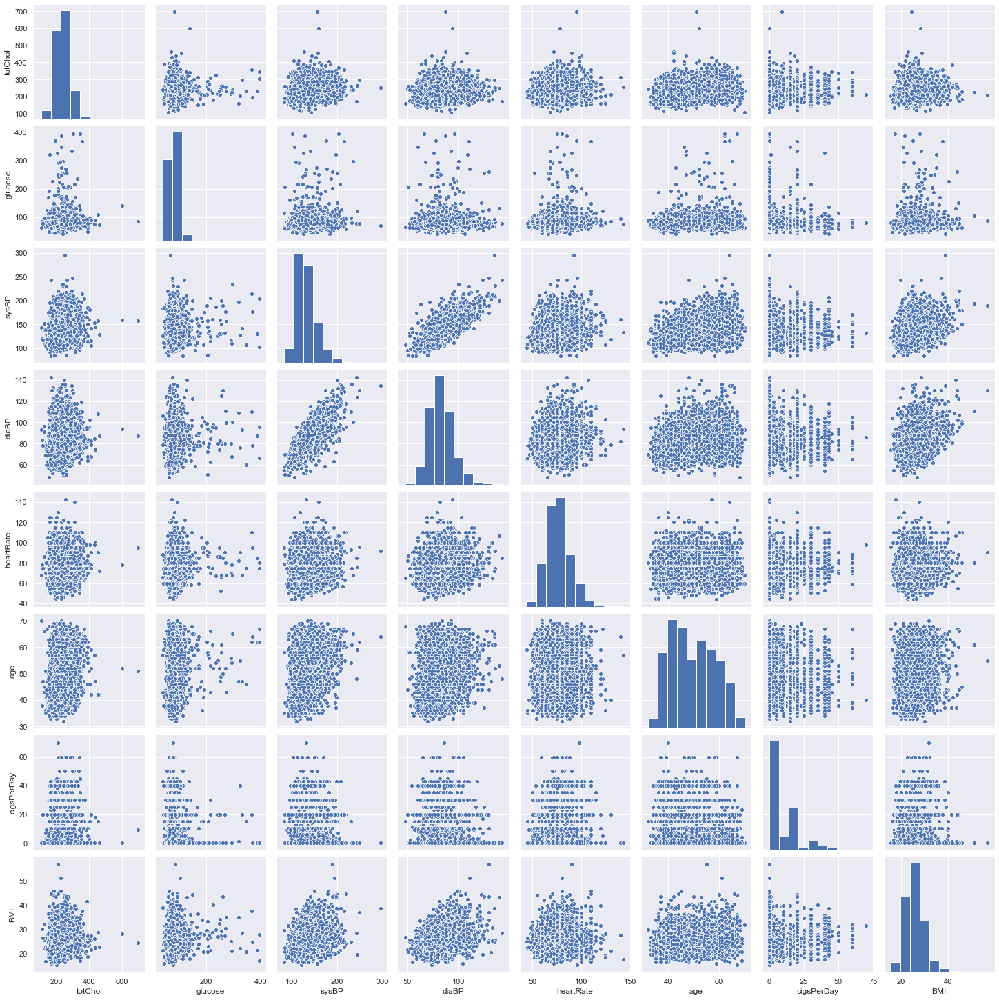

In [74]:
#sns.set_theme(style="ticks")
sns.pairplot(df_numeric)

#From below we see the highest correlation between diaBP and sysBP
#kernel density

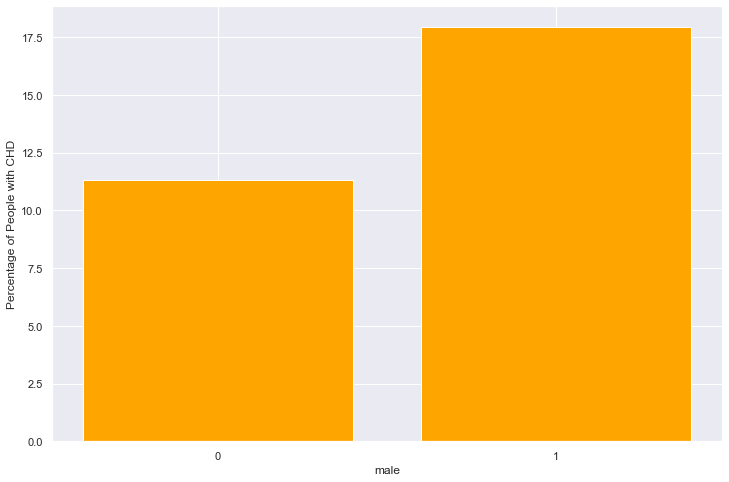

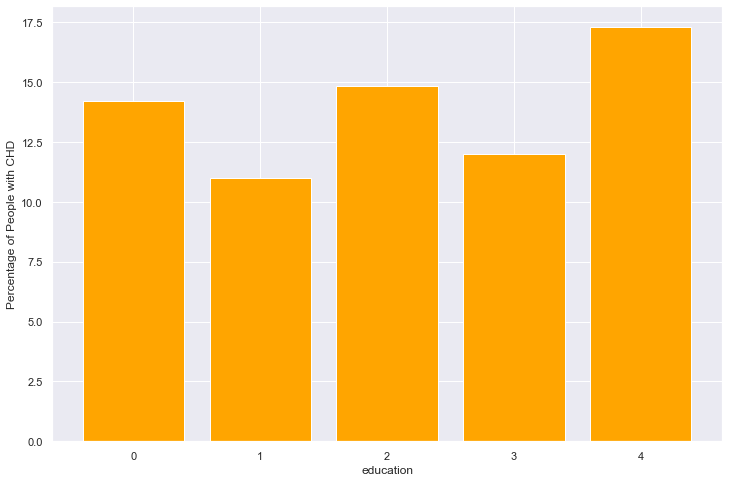

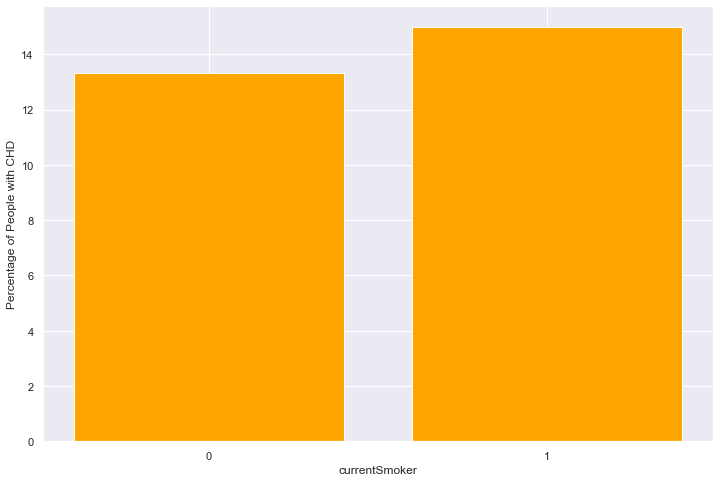

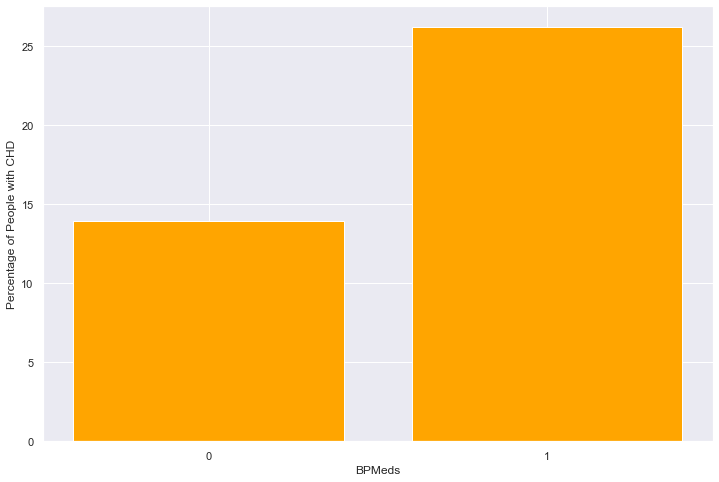

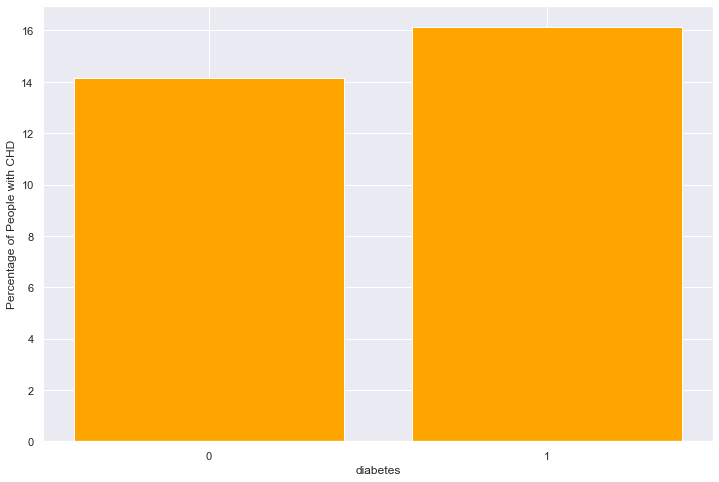

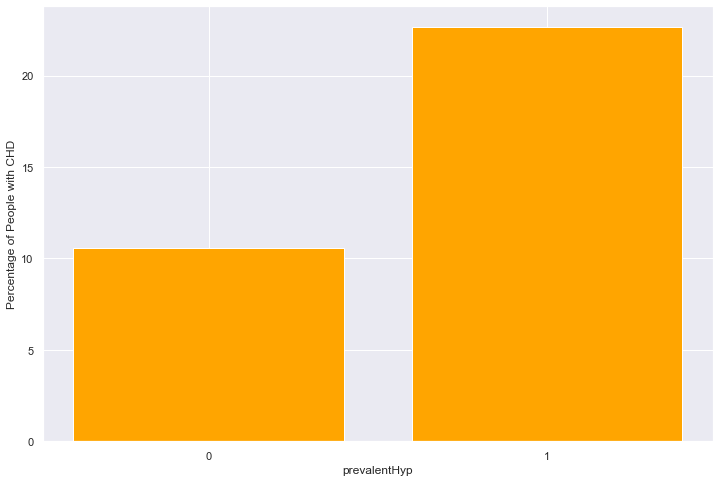

In [75]:
def percentageDistribution(data, percentCol, target):
            # cat col vs target
            fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(12,8),facecolor='white')
            distribution = data[percentCol].value_counts()
            percentColValue = [int(x) for x in sorted(distribution.index)] 
            targetCount = dict(map(lambda x: [x,0],percentColValue))
            
            for t,c in zip(data[target],data[percentCol]):
                targetCount[c] += t
                rates = [(targetCount[c] / float(distribution.loc[c]))*100 for c in percentColValue]
            
            x = np.arange(len(percentColValue))
            
            
            ax.bar(x,rates,color = 'Orange')
            ax.set_xticks(x)
            ax.set_xticklabels(percentColValue)
            ax.set_xlabel(percentCol)
            ax.set_ylabel('Percentage of People with CHD')
            
            plt.show()

# Create the dictionary 
event_dictionary ={'Some High School' : 1, 'High School' : 2, 'Some College' : 3, 'College' :4, 'Other' :5} 
# Add a new column named 'Price' 
df['education_num'] = df['education'].map(event_dictionary) 

percentageDistribution(df, percentCol='male', target='TenYearCHD')
percentageDistribution(df, percentCol='education', target='TenYearCHD')
percentageDistribution(df, percentCol='currentSmoker', target='TenYearCHD')
percentageDistribution(df, percentCol='BPMeds', target='TenYearCHD')
percentageDistribution(df, percentCol='diabetes', target='TenYearCHD')
percentageDistribution(df, percentCol='prevalentHyp', target='TenYearCHD')
#percentageDistribution(df, percentCol='comorbidities', target='TenYearCHD')
#'currentSmoker','BPMeds','prevalentStroke','prevalentHyp','diabetes'

In [187]:
def plotSeries(data, seriesCols, response, xCol, dpi=100):
            #plt.figure(figsize=(16,8), dpi=dpi)
            fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(12,8),facecolor='white')
            #fig, axes = plt.subplots(nrows=round(len(seriesCols)/2)+1, ncols=2, figsize=(15, 20), dpi=80, facecolor="w", edgecolor="k")
            #x = data[xCol]
            #colors = ["blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan"]
            
            for i in range(len(seriesCols)):  
                #m = seriesCols[i]
                #y=data[m]
                #y.index = data[xCol]
                #c = colors[i % (len(colors))]
                
                sns.catplot( x=xCol, y=seriesCols[i], data=data, kind='bar', palette="Set2")
                plt.xticks(rotation=90)
                plt.title("Average value of " + seriesCols[i])
                plt.show()
                percentageDistribution(data, seriesCols[i], response)
                sns.countplot(x=seriesCols[i], data=data,
                                          palette="Set2")
                plt.title("Distribution of " + seriesCols[i])
                plt.show()
                #ax = y.plot(ax = axes[i // 2, i % 2],rot=25, color=c, title = 'Series plot of ' + m)
                #ax.set_ylabel(m)             
                #plt.show()
df.iloc[:,0:8] = df.iloc[:,0:8].astype(int) # float to int for processing numericalCols in graph
#plotSeries(df, numericCols, 'TenYearCHD', 'age', dpi=100)

#black bars are error bars which can be supressed

In [188]:
#df[['education','BPMeds']].astype(int)

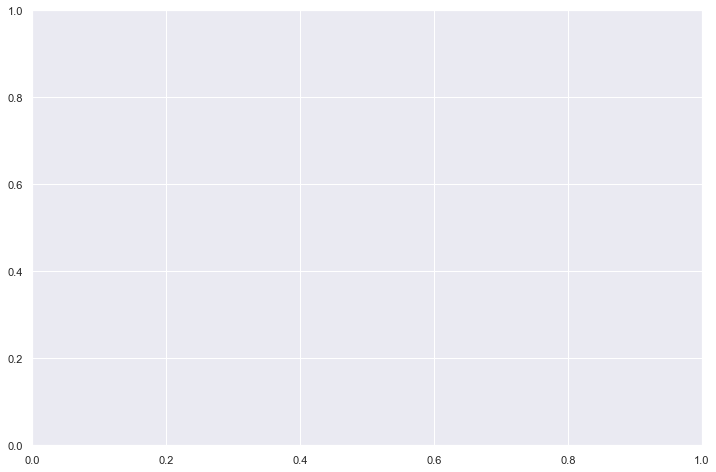

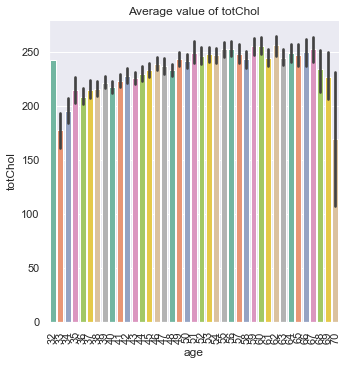

KeyboardInterrupt: 

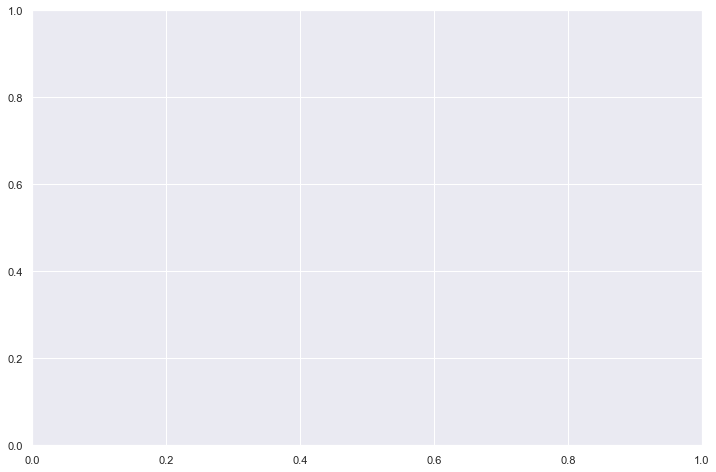

In [189]:
def snsPlot(data, numericCols, categoricalCols, response='TenYearCHD'):
       # try:

            #sns.pairplot(data[numericCols], hue=response, height=2.5, palette="Set2")
            plotSeries(data, numericCols, response, 'age', dpi=100)
            for i in numericCols:
                for j in [response]:
                    percentageDistribution(data, i, response)
            
            for i in numericCols:
                for j in categoricalCols:
                    #sns.jointplot(x=response, y=i, data=data)
                    sns.catplot(x=j, y=i, hue=response,   data=data, kind='bar')
                    #sns.kdeplot(data=data, x=i, hue=response, fill=True, 
                                #common_norm=False, palette="crest", alpha=.5, linewidth=0,)
                    #sns.swarmplot(x=j, y=i, hue=response, data=data)
            
            for i in range(len(numericCols)):
                for j in range(len(numericCols)-1):
                    #sns.jointplot(x=response, y=i, data=data)
                    sns.scatterplot(data=data, x=numericCols[i], y=numericCols[j+1], palette="deep", legend="full",
                                    hue=data[response].tolist())
                    #ax.legend(title=response)  # add a title to the legend
                    plt.show()
                    #sns.swarmplot(x=j, y=i, hue=response, data=data)

                # for i in numericCols[1:len(numericCols)]:
            #   sns.paidata[[indx1]]rplot(data[[response, numericCols[i]]])

            ################################
            
            for i in numericCols:
                for j in [response]:
                    plt.figure(figsize=(15, 7))
                    plt.subplot(121)
                    graph = sns.countplot(y=data[i],
                                          palette="Set2",
                                          order=data[i].value_counts().index[:500])
                    plt.title("Distribution of " + i)
                    
                    
            sns.countplot(y=data['age'], palette="Set2", hue=data[response],
                                          order=data['age'].value_counts().index[:200])
            
            for i in categoricalCols:
                for j in [response]:
                    plt.figure(figsize=(15, 7))
                    plt.subplot(121)
                    graph = sns.countplot(y=data[i],
                                          palette="Set2",
                                          order=data[i].value_counts().index[:100])
                    plt.title("Distribution of " + i)

                    plt.subplot(122)
                    sns.countplot(y=data[i],
                                  hue=data[j], palette="Set2",
                                  order=data[i].value_counts().index[:100])
                    plt.ylabel("")
                    plt.title("Distribution of " + i + " by " + j)

                    plt.subplots_adjust(wspace=.4)
                    
                    percentageDistribution(data, i, response)


snsPlot(df, numericCols, categoricalCols, response='TenYearCHD')

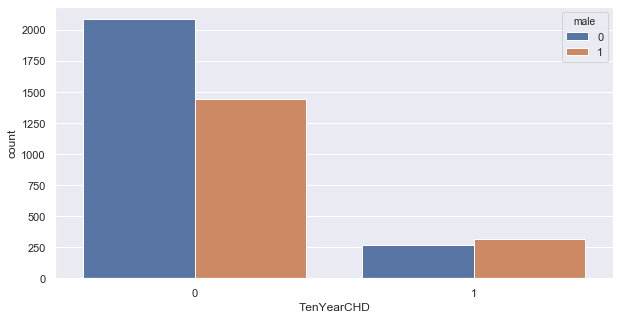

In [79]:
ax = sns.countplot(x="TenYearCHD", hue="male", data=df)
#convert to %

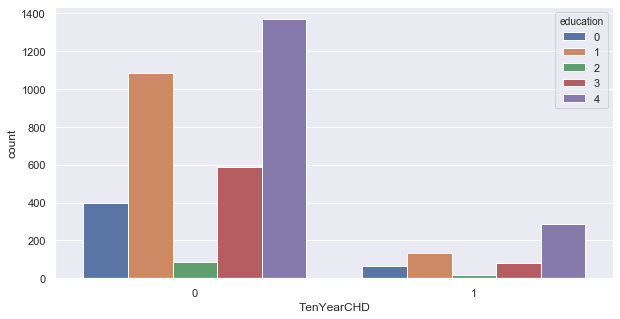

In [80]:
ax = sns.countplot(x="TenYearCHD", hue="education", data=df)
#convert to %

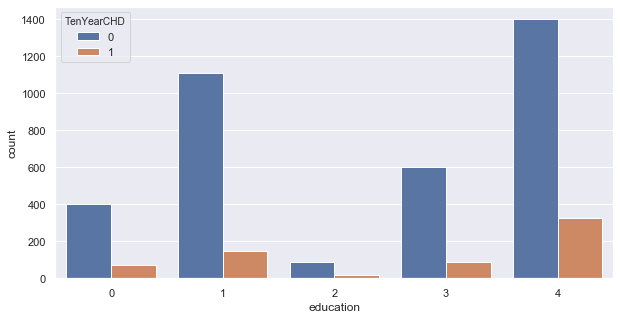

In [190]:
sns.countplot(x='education',data=df,hue='TenYearCHD')

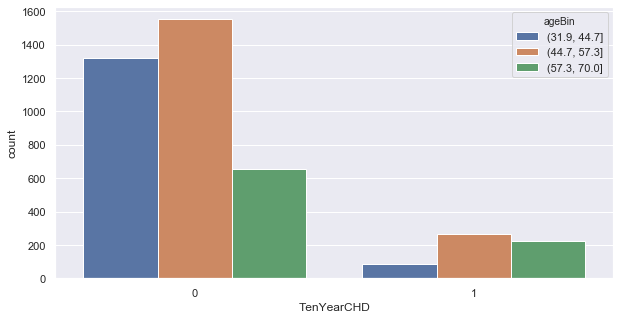

In [82]:
ax = sns.countplot(x="TenYearCHD", hue="ageBin", data=df_bin)
#consistently use Hue for ten year CHD

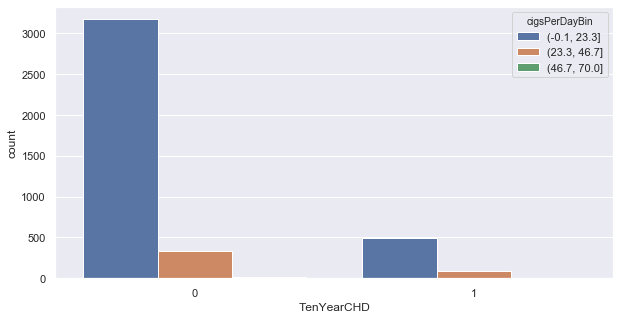

In [83]:
ax = sns.countplot(x="TenYearCHD", hue="cigsPerDayBin", data=df_bin)

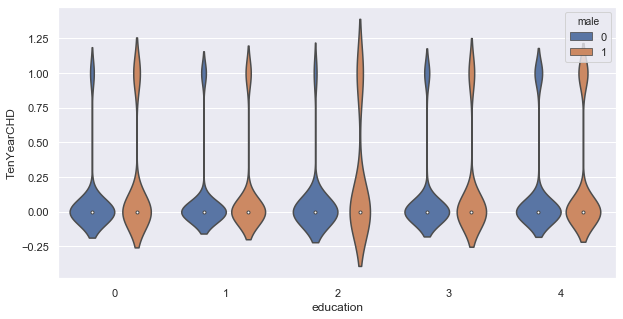

In [84]:
ax=sns.violinplot(x="education" , y="TenYearCHD" , hue="male" , data=df)

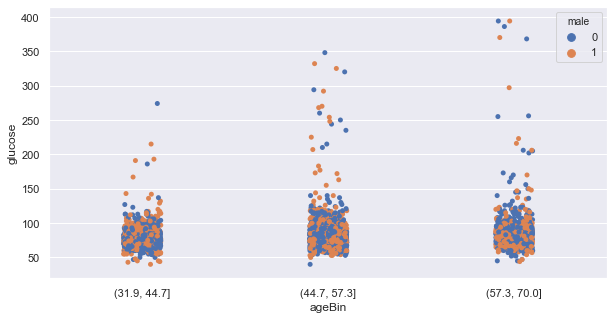

In [48]:
ax=sns.stripplot(x="ageBin" , y="glucose" , hue="male" , data=df_bin)

[Text(0, 0.5, '')]

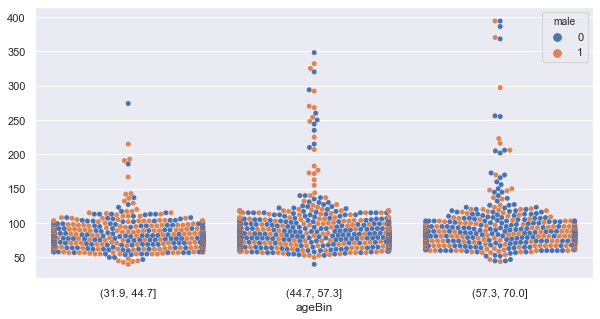

In [49]:
# Draw a categorical scatterplot to show each observation
ax = sns.swarmplot(x="ageBin" , y="glucose" , hue="male" , data=df_bin)
ax.set(ylabel="")

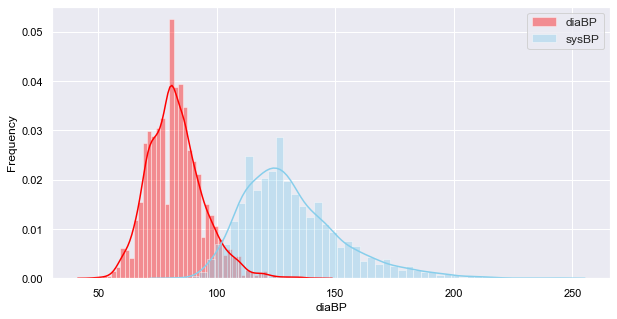

In [85]:
sns.distplot(df['diaBP'], color = 'Red', label = 'diaBP')
sns.distplot(df['sysBP'], color = 'skyblue', label = 'sysBP')
plt.legend(fontsize = 12)
plt.xlabel('diaBP', color = 'black')
plt.ylabel('Frequency', color = 'black')
plt.xticks(color = 'black')
plt.yticks(color = 'black')
plt.savefig('histogram.png')

plt.show()
#do this wrt target variable .. add hue .. use kde plots

# MODELLING

###### Preparation
Scale the dataset
Apply SMOTE (Synthetic Minority Over-sampling Technique) to balance data

Principal Component Analysis
Perform PCA
Draw screen plot to find how many components should be selected for
Find contribution of columns on each dimension
Find Correlation between columns and dimensions
Find contribution of rows on each dimension
Find Correlation between rows and dimensions
Perform Clustering
Apply Models
Take first n dimension that contributes 90% variance
Apply following model
GLM
Decision Tree
Random Forest
SVM
Gradient Boosting Classifier
Artificial Neural Networks 


In [103]:
#Splitting data
df=df.drop('education_num',axis=1) #removing this field used for visualization purposes
from sklearn.model_selection import train_test_split
response='TenYearCHD'
def splitData(data, response, overSampleType='O', rfe=False):
    # RSEED = 30
    predictor = data.drop(response, axis=1)
    target = data[response]

    predictorTrain, predictorTest, targetTrain, targetTest = train_test_split(predictor, target, test_size=0.2,
                                                                                      random_state=0, stratify=target)
    """
    if rfe:
        predictorTrain, predictorTest = self.featureElimination(predictorTrain, predictorTest, targetTrain)

    if (overSampleType != ''):
        overSamplePredictorTrain, overSampleTargetTrain = self.getOverSampledData(
        overSampleType, response, predictorTrain, targetTrain)
            
        predictorTrain = overSamplePredictorTrain
        targetTrain = overSampleTargetTrain[response]
    """
                
    return predictorTrain, predictorTest, targetTrain, targetTest
predictorTrain, predictorTest, targetTrain, targetTest=splitData(df, response, overSampleType='O', rfe=False)
#predictorTraino, predictorTesto, targetTraino, targetTesto=splitData(df_o, response, overSampleType='O', rfe=False)

Scatter Plot for original data


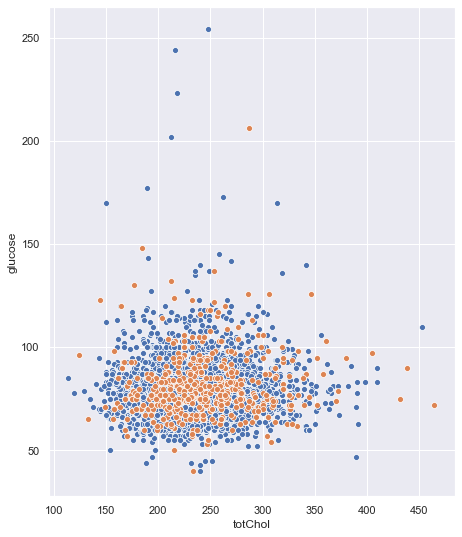

In [104]:
columns = predictorTrain.columns
            #print(len(targetTest))
            #print(len(targetTest[targetTest == 1]))
if all(elem in list(columns) for elem in ['totChol', 'glucose']):
        counter = Counter(targetTrain)
        print('Scatter Plot for original data')
        plt.figure(figsize=(16, 9))
        plt.subplot(121)
        for label, _ in counter.items():
            rowId = np.where(targetTrain == label)[0]
            sns.scatterplot('totChol', 'glucose', data=predictorTrain.iloc[list(rowId)])
            
#Checking any two numerical features with the target value distribution

Scatter Plot for original data
Scatter Plot for oversampled data


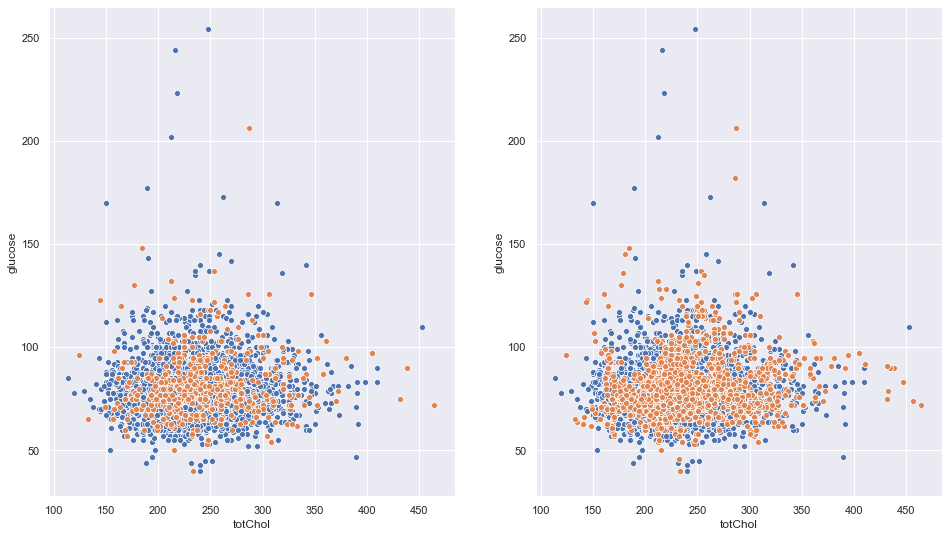

length of oversampled data is  4508
Proportion of 0 in oversampled data is  0.6251109139307897
Proportion of 1 in oversampled data is  0.3748890860692103


(      totChol  glucose  sysBP  diaBP  heartRate  age  cigsPerDay  BMI  male  \
 4364      339       85    136     81         79   51          14   24     0   
 1126      236       74    160    100         85   42           0   27     0   
 1252      205       74    137     95        100   49           0   25     0   
 1200      225      100    156     98         80   52          20   30     1   
 1367      285      116    165    115         72   56           9   24     0   
 ...       ...      ...    ...    ...        ...  ...         ...  ...   ...   
 1736      239       75    118     78         85   40           9   23     0   
 3358      307       73    133     89         66   52           2   28     0   
 3122      248       55    110     61         85   38          15   22     1   
 1991      215       93    119     73         67   58          20   29     0   
 3978      217       72    181    109         80   52           1   25     0   
 
       education  currentSmoker    BPM

In [105]:
#Since we have a class imbalance problem, and the positive class is less or in minority, we need to oversample the positive class
from imblearn.over_sampling import SMOTE
def getOverSampledData(overSampleType, response, predictorTrain, targetTrain):
            columns = predictorTrain.columns
            #print(len(targetTest))
            #print(len(targetTest[targetTest == 1]))
            if all(elem in list(columns) for elem in ['totChol', 'glucose']):
                counter = Counter(targetTrain)
                print('Scatter Plot for original data')
                plt.figure(figsize=(16, 9))
                plt.subplot(121)
                for label, _ in counter.items():
                    rowId = np.where(targetTrain == label)[0]
                    sns.scatterplot('totChol', 'glucose', data=predictorTrain.iloc[list(rowId)])

            # https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/
            # from imblearn.over_sampling import SMOTE
            # A popular extension to SMOTE involves selecting those instances of the minority class that are misclassified, such as with a k-nearest neighbor classification model.
            if overSampleType == 'O': #Lalitha: Is O oversampling minority class here? Yes
                overSample = SMOTE(random_state=0, sampling_strategy=0.6) #currently 0.5, can change to 0.6 for a 60:40 ratio distribution
            elif overSampleType == 'OU':   # combining SMOTE with random undersampling of the majority class
                over = SMOTE(sampling_strategy=0.2)
                under = RandomUnderSampler(sampling_strategy=0.4)
                steps = [('o', over), ('u', under)]
                overSample = Pipeline(steps=steps)
            elif overSampleType == 'B': # Borderline-SMOTE - A popular extension to SMOTE involves selecting those instances of the minority class that are misclassified, such as with a k-nearest neighbor classification model.
                overSample = BorderlineSMOTE()
            elif overSampleType == 'BS':  # Borderline-SMOTE SVM - Hien Nguyen, et al. suggest using an alternative of Borderline-SMOTE where an SVM algorithm is used instead of a KNN to identify misclassified examples on the decision boundary.
                overSample = SVMSMOTE()
            elif overSampleType == 'A':  # Adaptive Synthetic Sampling (ADASYN) -  Another approach involves generating synthetic samples inversely proportional to the density of the examples in the minority class. That is, generate more synthetic examples in regions of the feature space where the density of minority examples is low, and fewer or none where the density is high.
                overSample = ADASYN()
            elif overSampleType == 'N':
                overSample = NearMiss()

            overSamplePredictorTrain, overSampleTargetTrain = overSample.fit_resample(predictorTrain, targetTrain)
            #self.featureElimination(overSamplePredictorTrain, overSampleTargetTrain)

            # Shuffle the data
            shuffle = np.random.permutation(overSamplePredictorTrain.shape[0])
            overSamplePredictorTrain = overSamplePredictorTrain.iloc[shuffle]
            overSampleTargetTrain = overSampleTargetTrain.iloc[shuffle]

            if all(elem in list(columns) for elem in ['totChol', 'glucose']):
                print('Scatter Plot for oversampled data')
                plt.subplot(122)
                for label, _ in counter.items():
                    rowId = np.where(overSampleTargetTrain == label)[0]
                    sns.scatterplot('totChol', 'glucose', data=overSamplePredictorTrain.iloc[list(rowId)])

                plt.show()

            overSamplePredictorTrain = pd.DataFrame(data=overSamplePredictorTrain, columns=columns)
            overSampleTargetTrain = pd.DataFrame(data=overSampleTargetTrain, columns=[response])
            # we can Check the numbers of our data
            print("length of oversampled data is ", len(overSamplePredictorTrain))
            #print("Number of no target in oversampled data", len(overSampleTargetTrain[overSampleTargetTrain[response] == 0]))
            #print("Number of subscription", len(overSampleTargetTrain[overSampleTargetTrain[response] == 1]))
            print("Proportion of 0 in oversampled data is ",
              len(overSampleTargetTrain[overSampleTargetTrain[response] == 0]) / len(overSamplePredictorTrain))
            print("Proportion of 1 in oversampled data is ",
              len(overSampleTargetTrain[overSampleTargetTrain[response] == 1]) / len(overSamplePredictorTrain))

            return overSamplePredictorTrain, overSampleTargetTrain
getOverSampledData('O', response, predictorTrain, targetTrain)
#LL: why do we shuffle the smote data?

Scatter Plot for original data
Scatter Plot for oversampled data


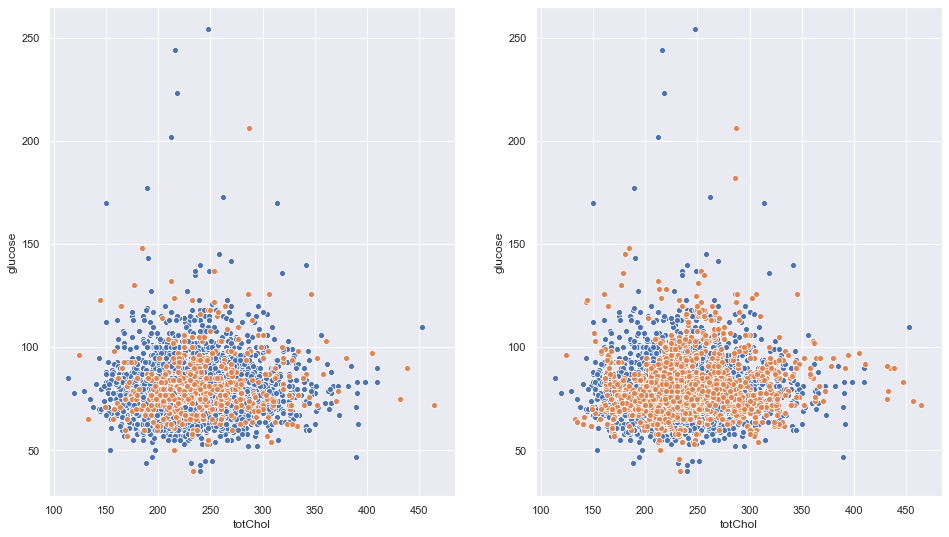

length of oversampled data is  4508
Proportion of 0 in oversampled data is  0.6251109139307897
Proportion of 1 in oversampled data is  0.3748890860692103


In [106]:
overSamplePredictorTrain, overSampleTargetTrain=getOverSampledData('O', response, predictorTrain, targetTrain)

In [107]:
# Create models and hypertuning parameters

#Importing all necessary libraries for modeling
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import BernoulliNB,GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis,QuadraticDiscriminantAnalysis
#import xgboost as xgb #pip
#from xgboost.sklearn import XGBClassifier
#from lightgbm import LGBMClassifier #!pip install lightgbm
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,VotingClassifier
from sklearn.linear_model import RidgeClassifier,SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score,accuracy_score,precision_score,recall_score,classification_report,plot_roc_curve,confusion_matrix,roc_curve
from sklearn.model_selection import learning_curve,cross_val_predict,cross_val_score,StratifiedKFold,RandomizedSearchCV
from sklearn.feature_selection import RFECV
from mlens.visualization import corrmat #!pip install mlens
from sklearn.svm import SVC   
from sklearn.linear_model import ElasticNet,LogisticRegression
import itertools

#Obtain model metrics such as accuracy,precision,recall and auc
def modelMetrics(actual, predictions):
            # https://www.programcreek.com/python/example/91159/sklearn.model_selection.cross_val_predict
            #plt.figure(figsize=(15, 7))
            cm1 = confusion_matrix(actual, predictions)
            plotConfusionMatrix(cm1, classes=['No CHD', 'CHD'], title='Defaulter Confusion Matrix')

            #misClassifiedCount = (actual != predictions).sum()
            misClassifiedCount = (actual.reset_index(drop=True) != predictions.reset_index(drop=True)).sum() # index of actual was different from predictions
            print('Misclassified Counts: {}'.format(misClassifiedCount))

            print("accuracy........%7.4f" % accuracy_score(actual, predictions))
            #print("f1 score macro", metrics.f1_score(actual, predictions, average='macro'))
            #print("f1 score micro", metrics.f1_score(actual, predictions, average='micro'))
            print("precision score........%7.4f" % precision_score(actual, predictions, average='macro'))
            print("recall score........%7.4f" % recall_score(actual, predictions, average='macro'))
            #print("hamming_loss", metrics.hamming_loss(actual, predictions))
            print("classification_report \n", classification_report(actual, predictions))
            #print("jaccard_score", metrics.jaccard_score(actual, predictions))
            # print "log_loss", metrics.log_loss(data_Y, predictions)
            #print("zero_one_loss", metrics.zero_one_loss(actual, predictions))
            print ("AUC&ROC........%7.4f" % roc_auc_score(actual, predictions))
            # print "matthews_corrcoef", metrics.matthews_corrcoef(data_Y, predictions)

def getModelClassifiers():
        SEED = 30
        rf = RandomForestClassifier(
                n_estimators=100, max_depth=5, max_features='auto', max_leaf_nodes=50, random_state=SEED,
                min_samples_split=10, bootstrap='True', criterion='gini', class_weight='balanced')
        bnb = BernoulliNB()
        nb = GaussianNB(var_smoothing = 0.25)
        #svc = SVC(C=100, probability=True)
        knn = KNeighborsClassifier(n_neighbors=3, leaf_size=30, p=2, weights='uniform', 
                                       algorithm='auto', n_jobs=-1, metric='minkowski')
        #lr = LogisticRegression(solver='liblinear', C=100, random_state=SEED)
        nn = MLPClassifier((80, 10), early_stopping=False, random_state=SEED)
        gb = GradientBoostingClassifier(n_estimators=100, random_state=SEED)
        #xgb = XGBClassifier(max_depth = 3, learning_rate=0.1, n_estimators=150, silent=True, objective='binary:logistic',
        #            booster = 'gbtree', n_jobs=1, nthread=None, gamma=0, min_child_weight=1, max_delta_step=0,
        #            subsample=1, colsample_bytree=1, colsample_bylevel=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
        #            base_score=0.5, random_state=SEED, seed=None, missing=None)
        #lgb = LGBMClassifier(n_estimators=100)
        #svm = SVC(kernel='linear',probability=True)
        en  = ElasticNet(random_state=0)
        lr  = LogisticRegression(random_state=0)
        lda = LinearDiscriminantAnalysis(solver='svd', tol=0.0001)
        qda = QuadraticDiscriminantAnalysis(reg_param=0.0, store_covariance=False, tol=0.0001)
        ada = AdaBoostClassifier(n_estimators=50, learning_rate=1.0, algorithm='SAMME.R')
        bagging = BaggingClassifier(base_estimator=None, n_estimators=10, max_samples=1.0, 
                                        max_features=1.0, bootstrap=True, bootstrap_features=False, 
                                        oob_score=False, warm_start=False, n_jobs=None)
        etc = ExtraTreesClassifier(n_estimators=100, criterion='gini', max_depth=None, 
                                       min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
                                       max_features='auto', max_leaf_nodes=None, 
                                       min_impurity_decrease=0.0, min_impurity_split=None, 
                                       bootstrap=False, oob_score=False, n_jobs=-1,)
        ridge = RidgeClassifier(alpha=1.0, fit_intercept=True, normalize=False, copy_X=True, 
                                    max_iter=None, tol=0.001, class_weight=None, solver='auto')
        sgd = SGDClassifier(alpha=1.0, penalty='l2')
            #bnb = BernoulliNB(alpha=1.0, binarize=0.0, fit_prior=True, class_prior=None)
        dtc = DecisionTreeClassifier(criterion='gini', splitter='best')

        models = {'bernoulli nb' : BernoulliNB, 'extra trees' : etc, 'ridge' : ridge, 'sgd' : sgd,   
                      'mlp-nn': nn, 'gbm': gb, 'log reg':lr, 'lda' : lda, 'qda' : qda,
                      'random forest': rf, 'bagging' : bagging,  'ada boost' : ada,
                      'knn': knn, 'naive bayes': nb, 'DTC' : dtc}#'xgb' : xgb,'lgb':lgb  #'svm':svm 'elastic net':en,
        #'mlp-nn': nn, 'gbm': gb, 'xgb' : xgb, 'lda' : lda, 'qda' : qda,

        return models
#LL: can we use lasso for classification? Add: logistic regression, Light GB , categorical gradient boosting, elastic net, svm,cnn,lstm

def getModelParam(predictorTrain, predictorTest, targetTrain, targetTest):

        parameters = {}

        parameters.update({"knn": {"n_neighbors": [3,5,11,19],
                                       "p": [1, 2, 3, 4, 5],
                                       "leaf_size": [5, 10, 15, 20, 25, 30, 35, 40, 45, 50],
                                       "n_jobs": [-1],
                                       "weights" : ['uniform', 'distance'],
                                       "metric" : ['euclidean', 'manhattan']
                                       }})
        parameters.update({"svm": {"kernel": ["linear", "rbf", "poly"],
                                       "gamma": ["auto"], "C": [0.1, 0.5, 1, 5, 10, 50, 100],
                                       "degree": [1, 2, 3, 4, 5, 6]
                                       }})
        parameters.update({"naive bayes": {"var_smoothing": [1e-9, 1e-8,1e-7, 1e-6, 1e-5]
                                       }})
        parameters.update({"mlp-nn": {"hidden_layer_sizes": [(5), (10), (5,5), (10,10), (5,5,5), (10,10,10)],
                                       "activation": ["identity", "logistic", "tanh", "relu"],
                                       "learning_rate": ["constant", "invscaling", "adaptive"],
                                       "max_iter": [100, 200, 300, 500, 1000, 2000],
                                       "alpha": list(10.0 ** -np.arange(1, 10)),
                                       }})
        parameters.update({"random forest": {"class_weight": [None, "balanced"],
                                                 "max_features": ["auto", "sqrt", "log2"],
                                                 "max_depth" : [3, 4, 5, 6, 7, 8],
                                                 "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                                 "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                                 "criterion" :["gini", "entropy"]
                                                 }})            
        parameters.update({"gbm": {"learning_rate":[0.15,0.1,0.05,0.01,0.005,0.001], 
                                       "max_depth": [2,3,4,5,6],
                                       "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                       "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                       "max_features": ["auto", "sqrt", "log2"],
                                       "subsample": [0.8, 0.9, 1]
                                       }})
        parameters.update({"xgb": {"max_depth":range(3,10,2), "min_child_weight":range(1,6,2), 
                                       "gamma":[i/10.0 for i in range(0,5)],
                                       "subsample":[i/10.0 for i in range(6,10)], 
                                       "colsample_bytree":[i/10.0 for i in range(6,10)],
                                       "reg_alpha": [1e-5, 1e-2, 0.1, 1, 100], 
                                       "learning_rate": [0.001, 0.01, 0.1, 0.2, 0.3]
                                       }})            
        parameters.update({"lda": {"solver": ["svd"], 
                                      }})
        parameters.update({"qda": {"reg_param":[0.01*ii for ii in range(0, 101)], 
                                      }})
        parameters.update({"ada boost": {"base_estimator": [DecisionTreeClassifier(max_depth = ii) for ii in range(1,6)],
                                             "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.25, 0.50, 0.75, 1.0]
                                             }})
        parameters.update({"bagging": {"base_estimator": [DecisionTreeClassifier(max_depth = ii) for ii in range(1,6)],
                                           "n_estimators": [200],
                                           "max_features": [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                           "n_jobs": [-1]
                                           }})
        parameters.update({"extra trees": {"class_weight": [None, "balanced"],
                                               "max_features": ["auto", "sqrt", "log2"],
                                               "max_depth" : [3, 4, 5, 6, 7, 8],
                                               "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                               "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                               "criterion" :["gini", "entropy"]     ,
                                               "n_jobs": [-1]
                                               }})
        parameters.update({"ridge": {"alpha": [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.25, 0.50, 0.75, 1.0]
                                         }})
        parameters.update({"sgd": {"alpha": [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.25, 0.50, 0.75, 1.0],
                                       "penalty": ["l1", "l2"],
                                       "n_jobs": [-1]
                                       }})
        parameters.update({"bernoulli nb": {"alpha": [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.25, 0.50, 0.75, 1.0]
                                                }})

        parameters.update({"DTC": {"criterion" :["gini", "entropy"],
                                       "splitter": ["best", "random"],
                                       "class_weight": [None, "balanced"],
                                       "max_features": ["auto", "sqrt", "log2"],
                                       "max_depth" : [1,2,3, 4, 5, 6, 7, 8],
                                       "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                       "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                       }})
        #parameters.update({"elastic net": {"alpha": [1e-3, 1e-2, 1e-1, 0.25, 0.50, 0.75, 1.0]
        #                                 }})
        parameters.update({"log reg": {"random_state": [0]
                                       }})
        """            
        parameters.update({"LSVC": { 
                                        "classifier__penalty": ["l2"],
                                        "classifier__C": [0.0001, 0.001, 0.01, 0.1, 1.0, 10, 100]
                                         }})
            
        parameters.update({"NuSVC": { 
                                        "classifier__nu": [0.25, 0.50, 0.75],
                                        "classifier__kernel": ["linear", "rbf", "poly"],
                                        "classifier__degree": [1,2,3,4,5,6],
                                         }})
            

        parameters.update({"extra trees": {"classifier__criterion" :["gini", "entropy"],
                                               "classifier__splitter": ["best", "random"],
                                               "classifier__class_weight": [None, "balanced"],
                                               "classifier__max_features": ["auto", "sqrt", "log2"],
                                               "classifier__max_depth" : [1,2,3, 4, 5, 6, 7, 8],
                                               "classifier__min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                               "classifier__min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                               }})  
            
        # Update dict with Decision Tree Classifier

        """            
        return parameters

[MLENS] backend: threading


In [108]:
getModelParam(predictorTrain, predictorTest, targetTrain, targetTest)

{'knn': {'n_neighbors': [3, 5, 11, 19],
  'p': [1, 2, 3, 4, 5],
  'leaf_size': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50],
  'n_jobs': [-1],
  'weights': ['uniform', 'distance'],
  'metric': ['euclidean', 'manhattan']},
 'svm': {'kernel': ['linear', 'rbf', 'poly'],
  'gamma': ['auto'],
  'C': [0.1, 0.5, 1, 5, 10, 50, 100],
  'degree': [1, 2, 3, 4, 5, 6]},
 'naive bayes': {'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]},
 'mlp-nn': {'hidden_layer_sizes': [5,
   10,
   (5, 5),
   (10, 10),
   (5, 5, 5),
   (10, 10, 10)],
  'activation': ['identity', 'logistic', 'tanh', 'relu'],
  'learning_rate': ['constant', 'invscaling', 'adaptive'],
  'max_iter': [100, 200, 300, 500, 1000, 2000],
  'alpha': [0.1, 0.01, 0.001, 0.0001, 1e-05, 1e-06, 1e-07, 1e-08, 1e-09]},
 'random forest': {'class_weight': [None, 'balanced'],
  'max_features': ['auto', 'sqrt', 'log2'],
  'max_depth': [3, 4, 5, 6, 7, 8],
  'min_samples_split': [0.005, 0.01, 0.05, 0.1],
  'min_samples_leaf': [0.005, 0.01, 0.05, 0.1],
 

Fitting models.
bernoulli nb... 

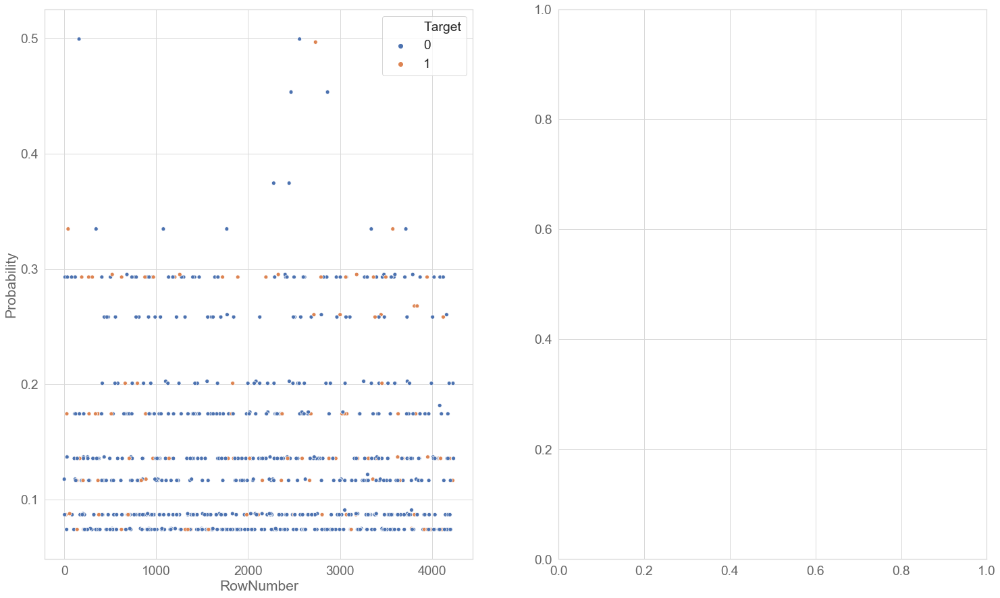

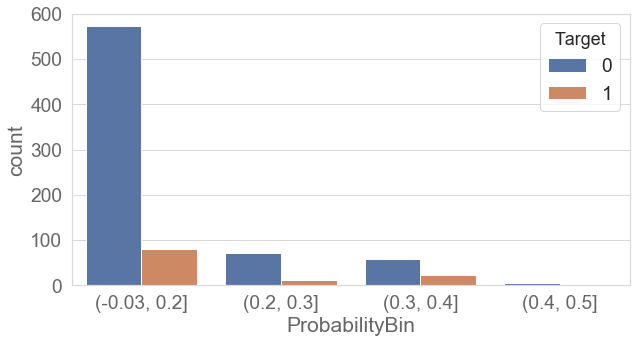

done
Now tuning BernoulliNB().
Fitting 5 folds for each of 11 candidates, totalling 55 fits


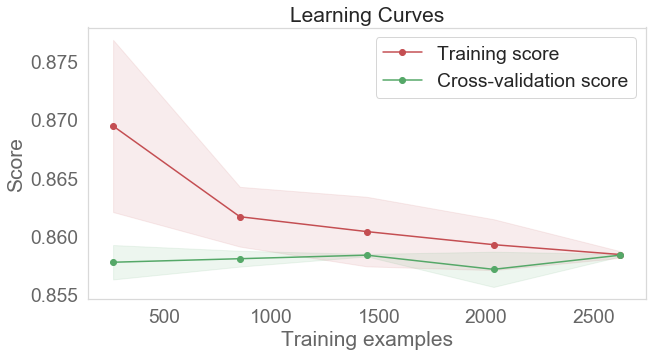

Confusion matrix, without normalization
[[703   2]
 [116   0]]


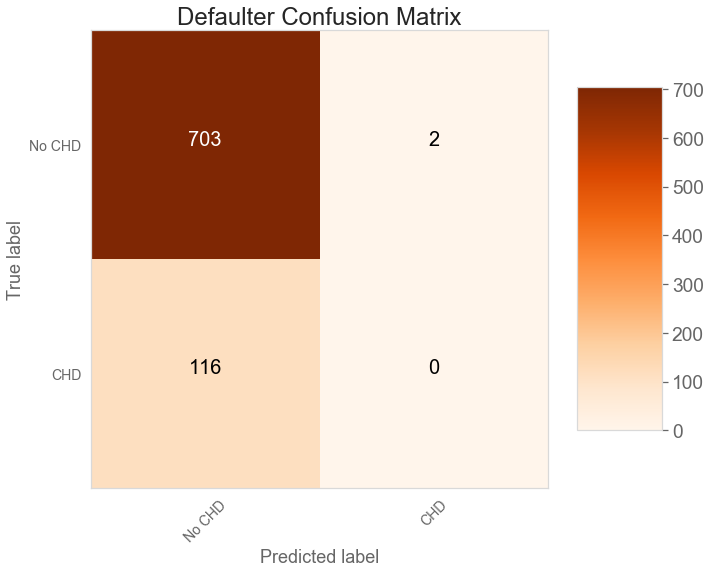

Misclassified Counts: 118
accuracy........ 0.8563
precision score........ 0.4292
recall score........ 0.4986
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.4986


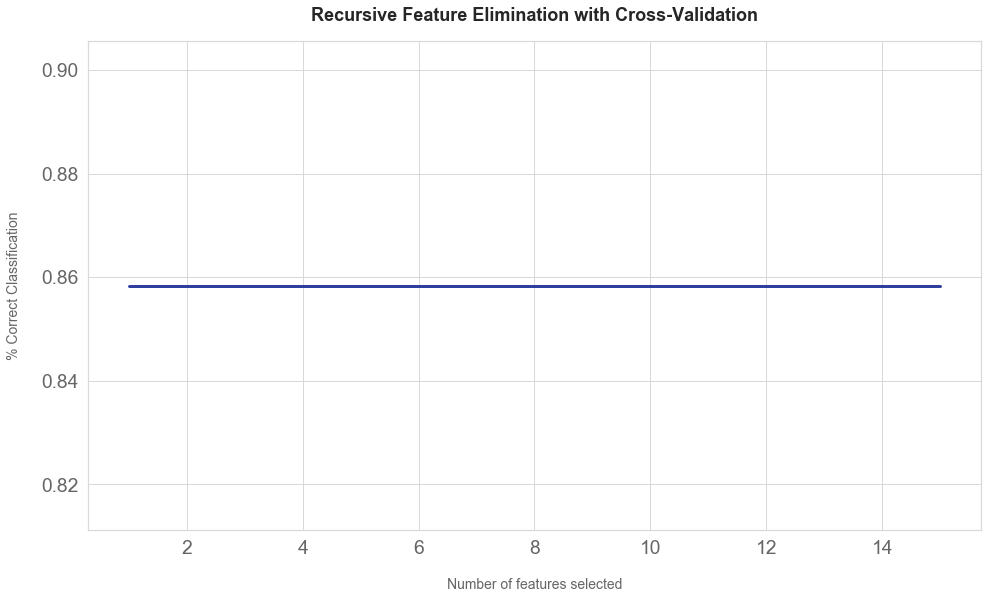

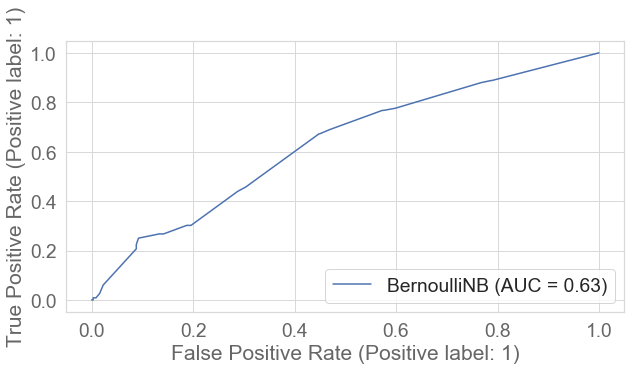

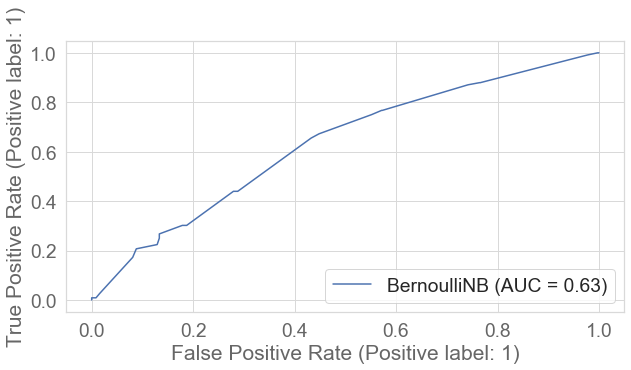

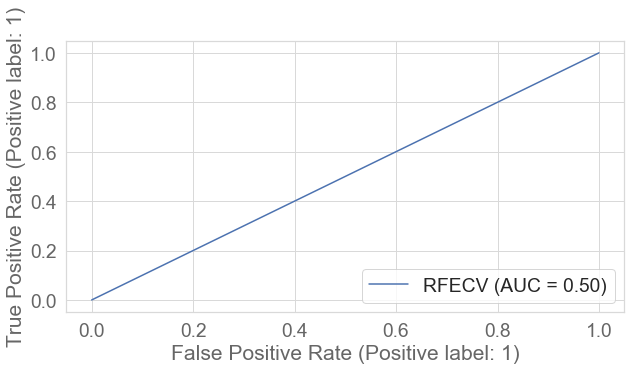

extra trees... 

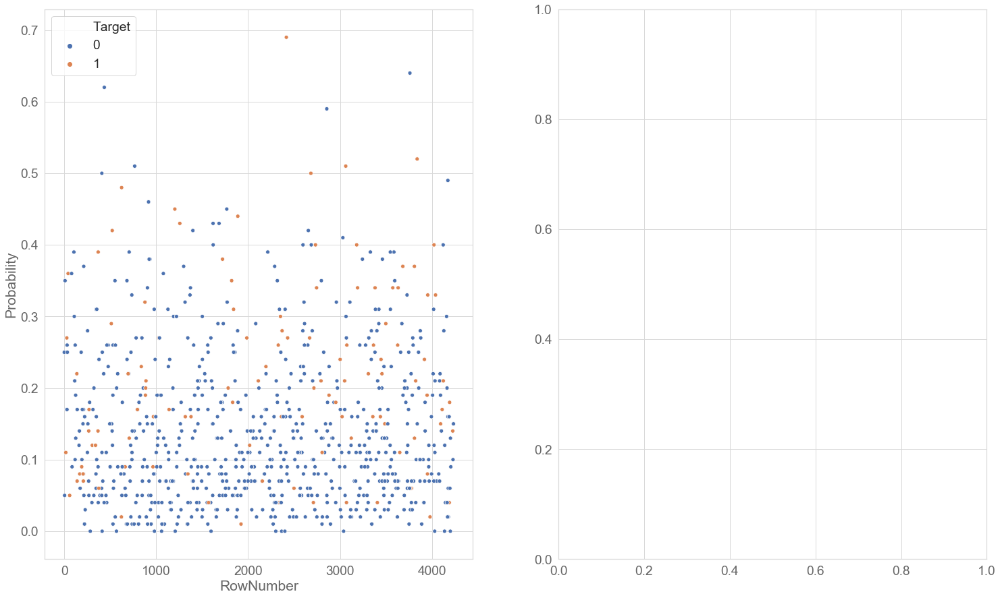

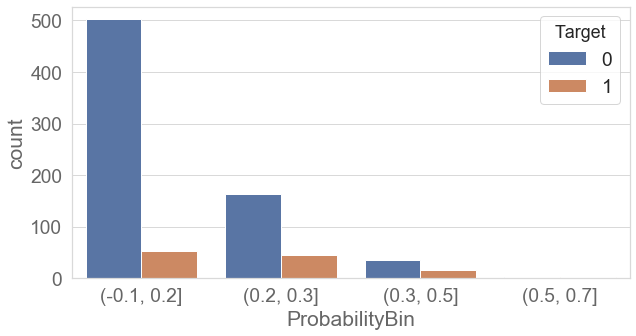

done
Now tuning ExtraTreesClassifier(n_jobs=-1).
Fitting 5 folds for each of 100 candidates, totalling 500 fits


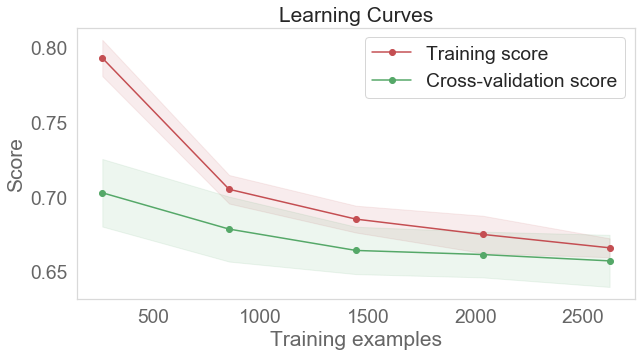

Confusion matrix, without normalization
[[472 233]
 [ 47  69]]


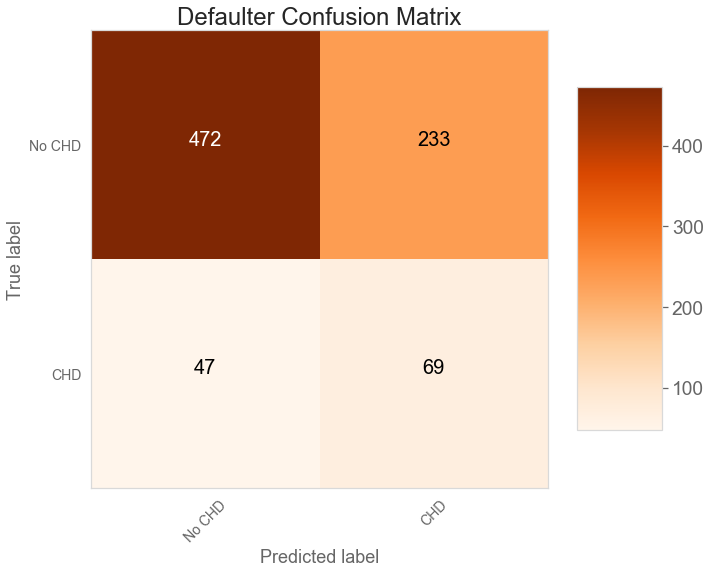

Misclassified Counts: 280
accuracy........ 0.6590
precision score........ 0.5690
recall score........ 0.6322
classification_report 
               precision    recall  f1-score   support

           0       0.91      0.67      0.77       705
           1       0.23      0.59      0.33       116

    accuracy                           0.66       821
   macro avg       0.57      0.63      0.55       821
weighted avg       0.81      0.66      0.71       821

AUC&ROC........ 0.6322


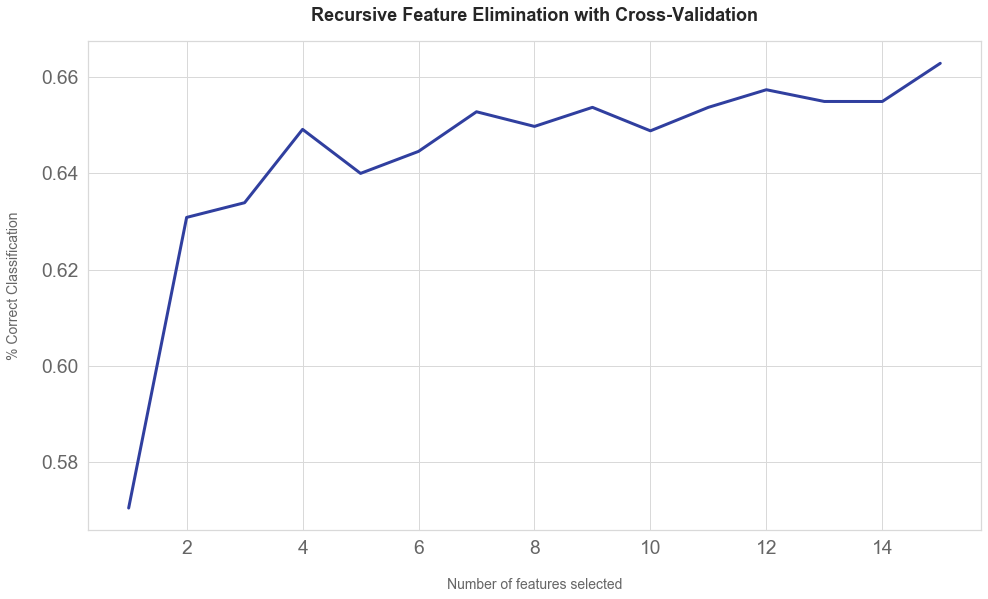

Optimal number of features: 15


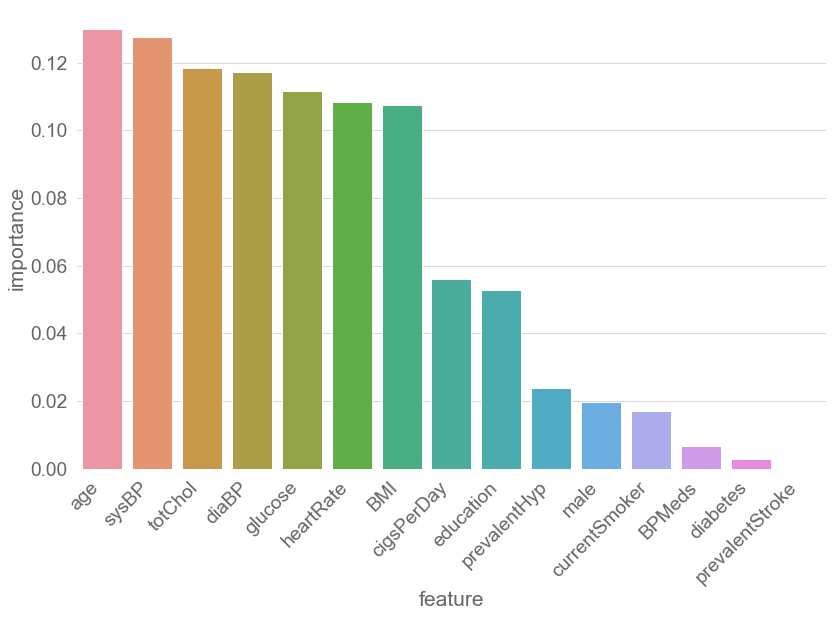

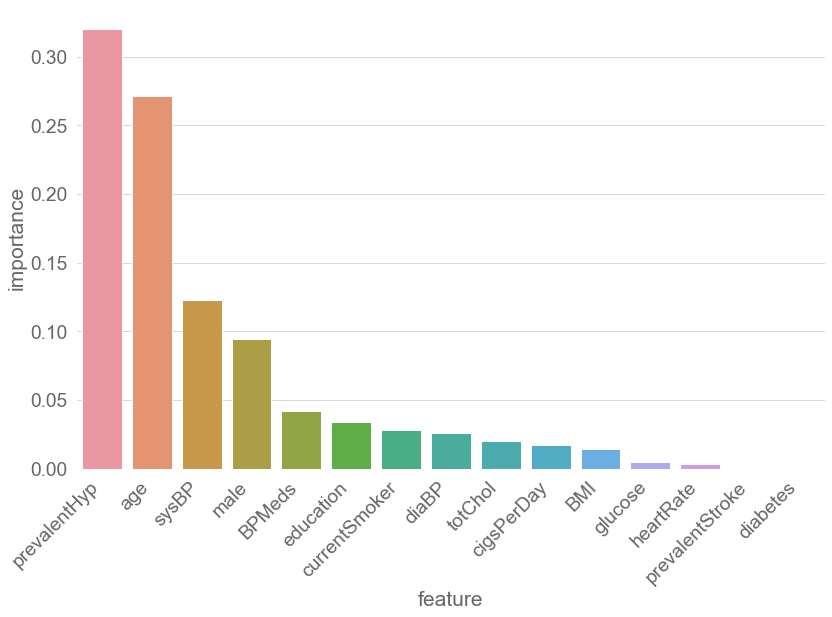

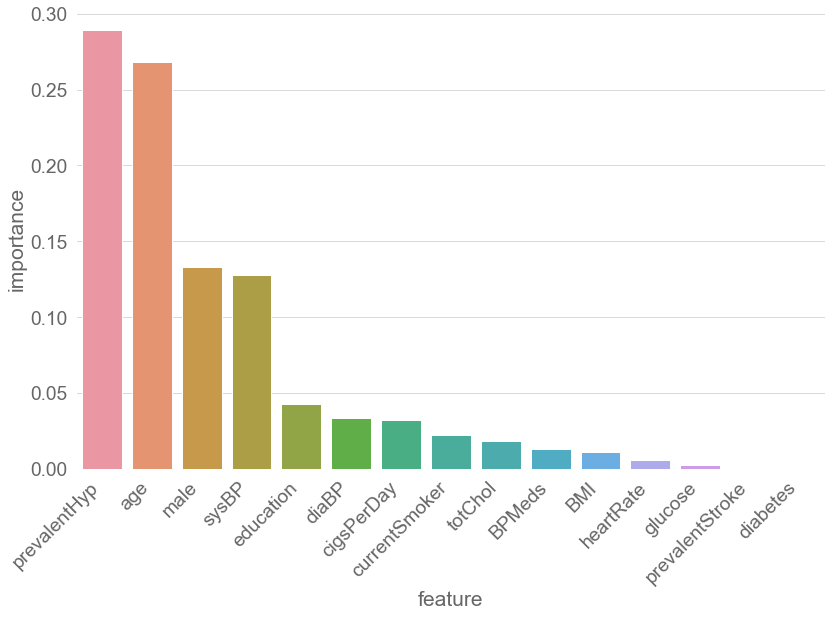

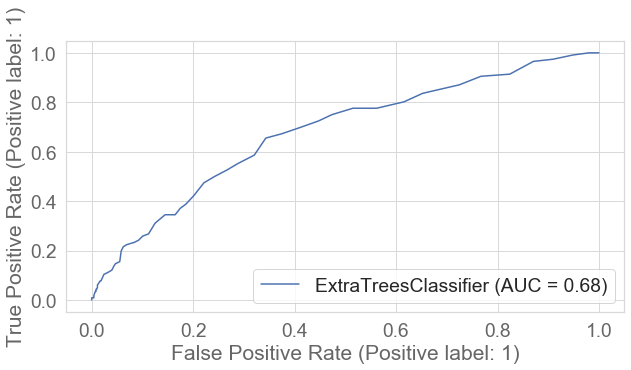

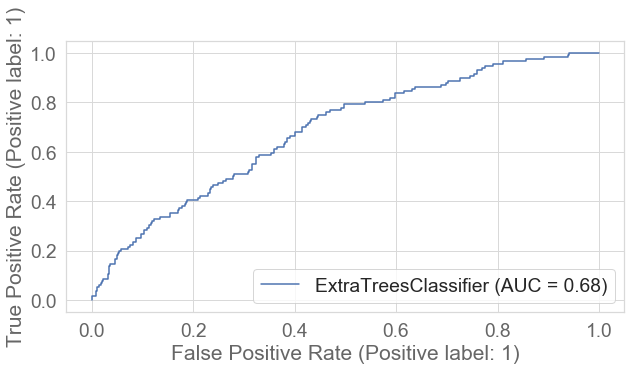

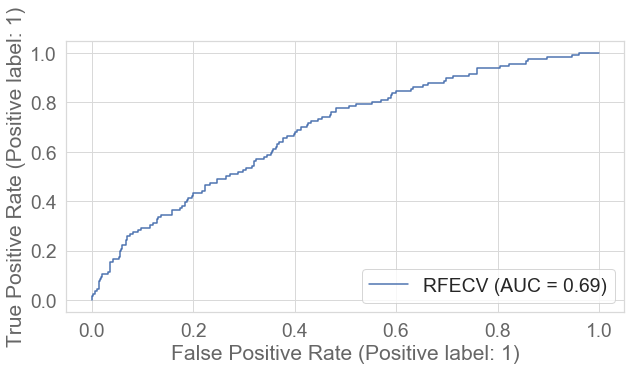

ridge... done
Now tuning RidgeClassifier().
Fitting 5 folds for each of 11 candidates, totalling 55 fits


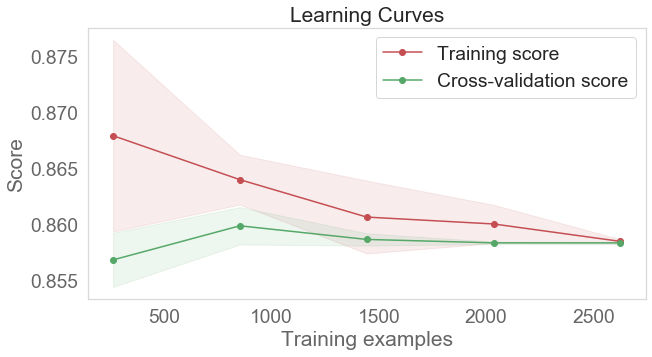

Confusion matrix, without normalization
[[705   0]
 [116   0]]


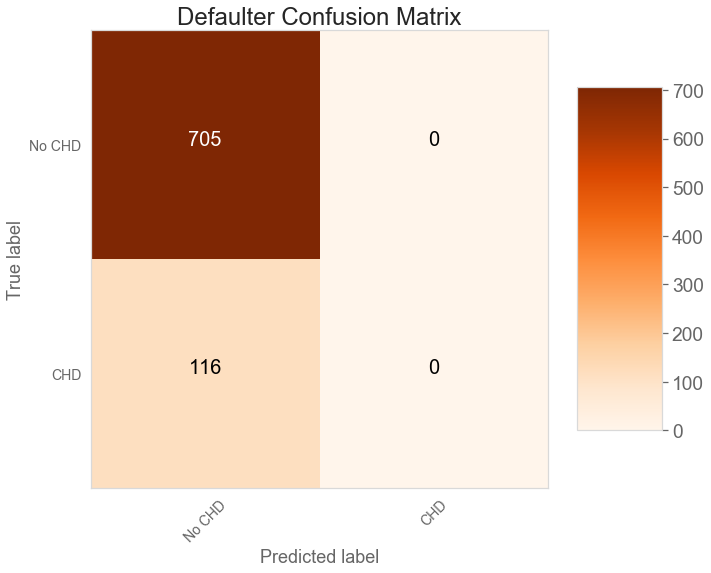

Misclassified Counts: 116
accuracy........ 0.8587
precision score........ 0.4294
recall score........ 0.5000
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.5000


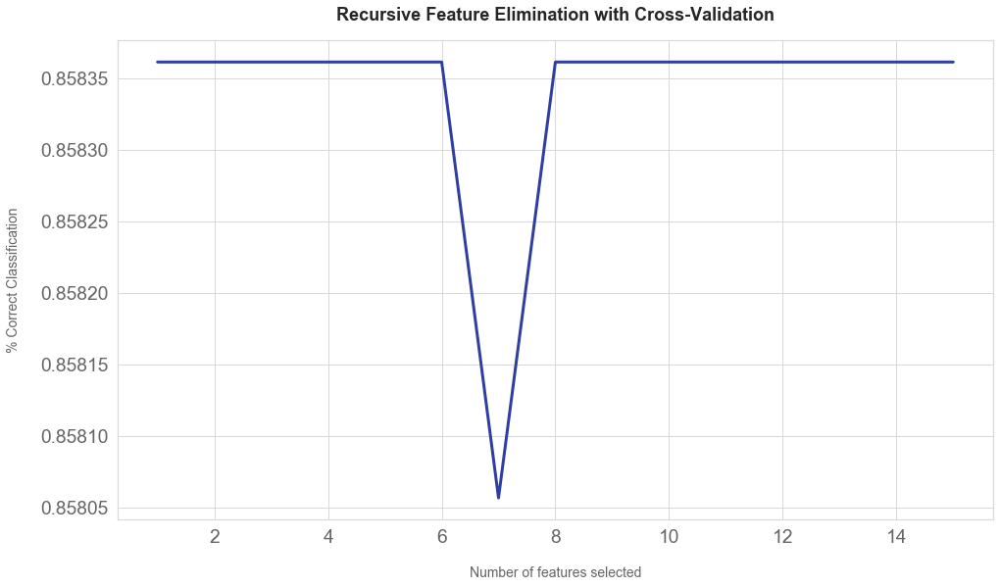

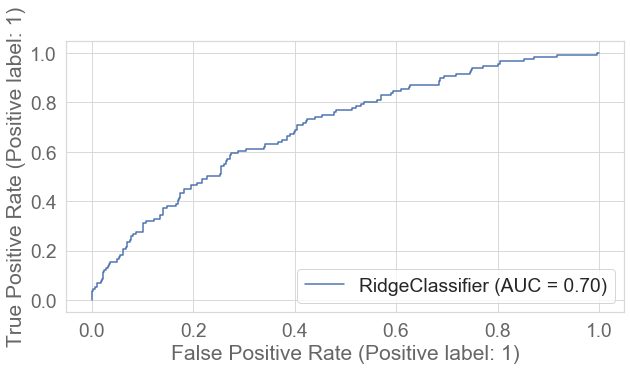

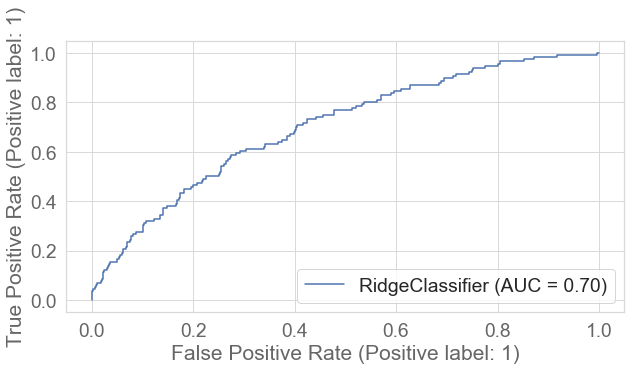

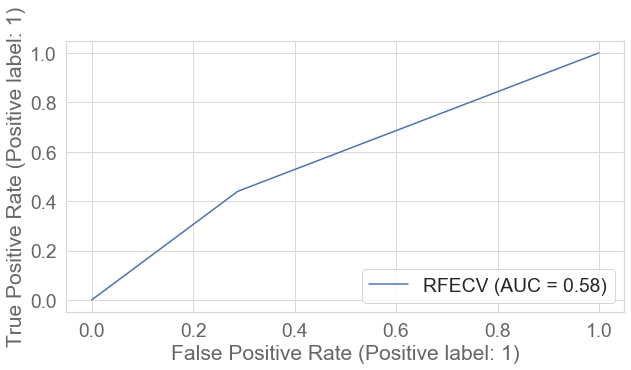

sgd... done
Now tuning SGDClassifier(alpha=1.0).
Fitting 5 folds for each of 22 candidates, totalling 110 fits


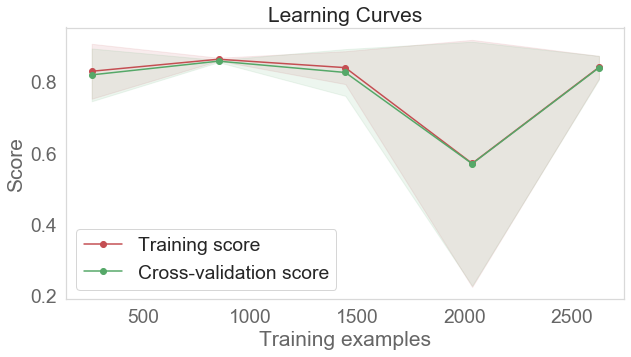

Confusion matrix, without normalization
[[644  61]
 [101  15]]


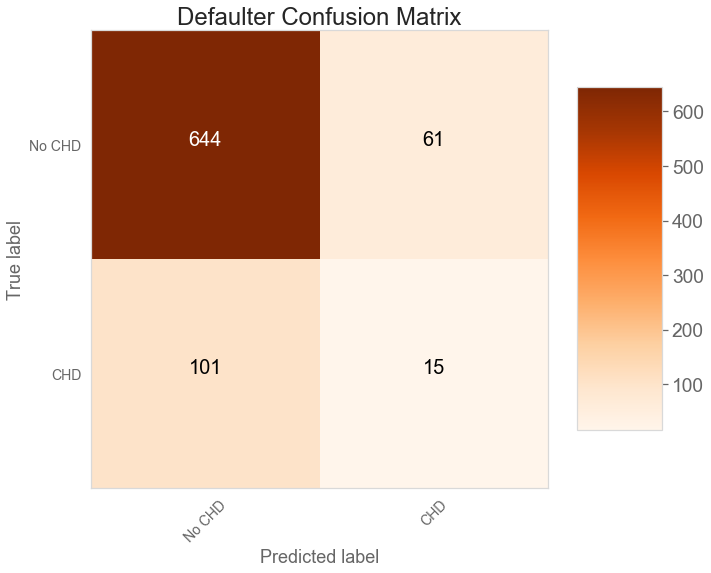

Misclassified Counts: 162
accuracy........ 0.8027
precision score........ 0.5309
recall score........ 0.5214
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.91      0.89       705
           1       0.20      0.13      0.16       116

    accuracy                           0.80       821
   macro avg       0.53      0.52      0.52       821
weighted avg       0.77      0.80      0.78       821

AUC&ROC........ 0.5214


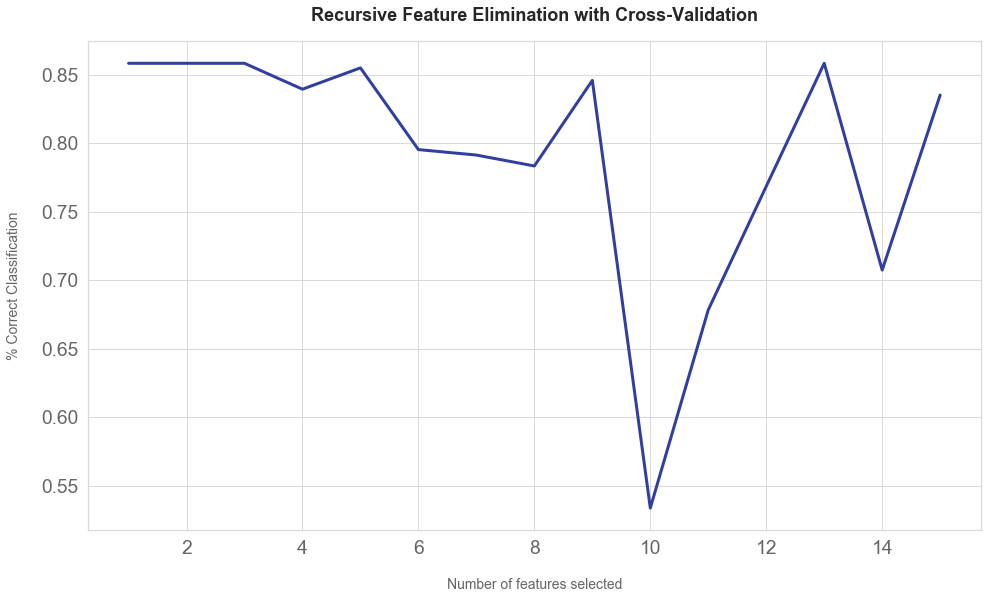

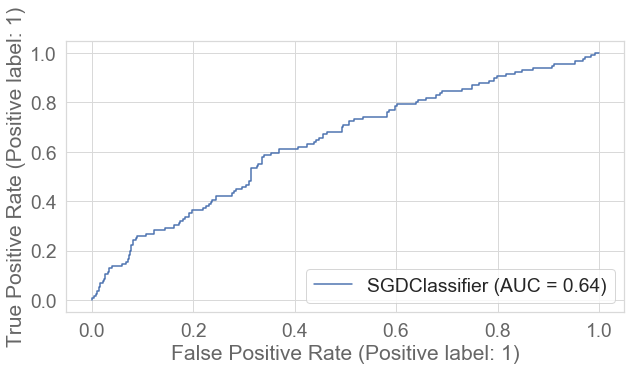

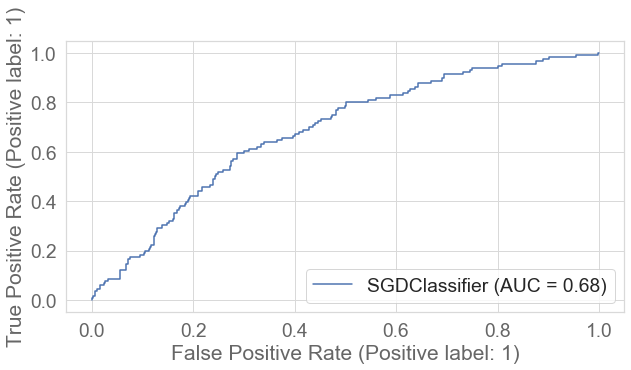

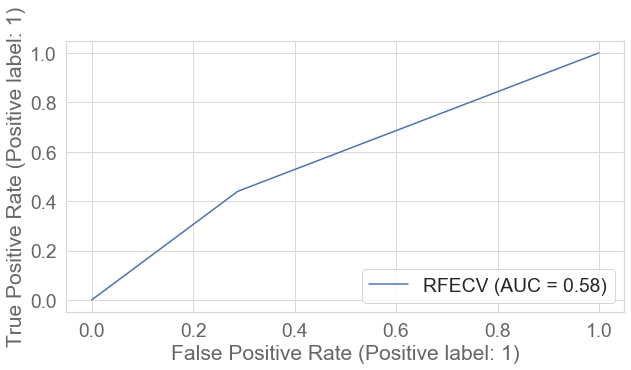

mlp-nn... 

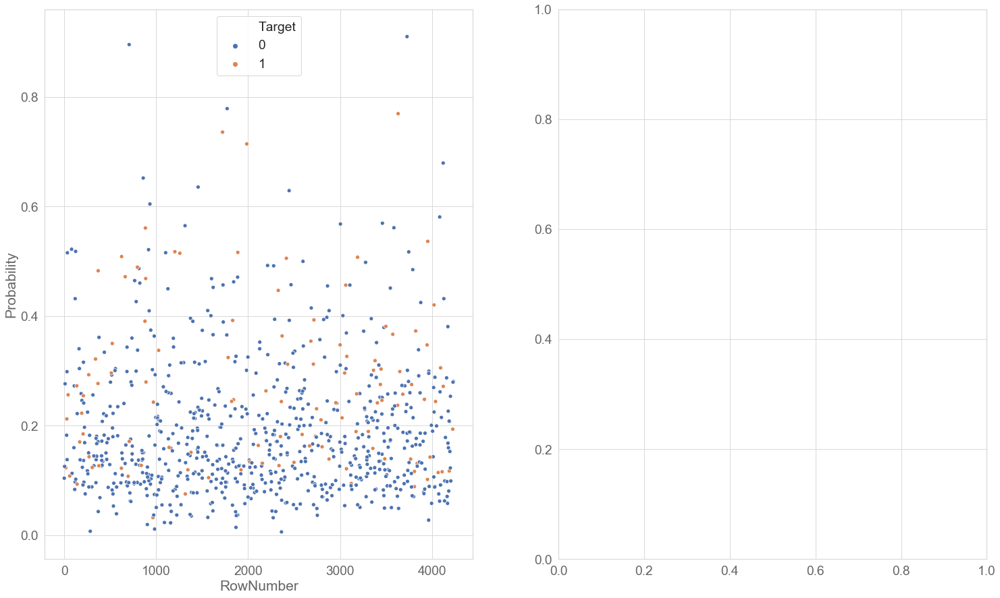

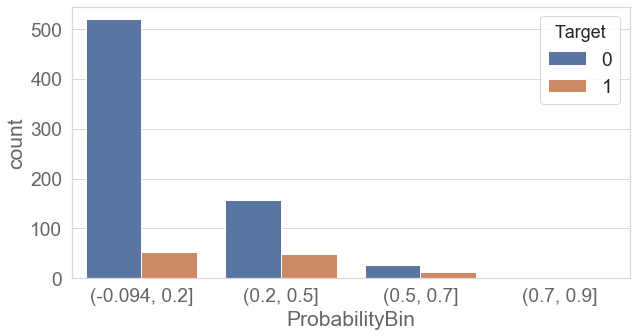

done
Now tuning MLPClassifier(hidden_layer_sizes=(80, 10), random_state=30).
Fitting 5 folds for each of 100 candidates, totalling 500 fits


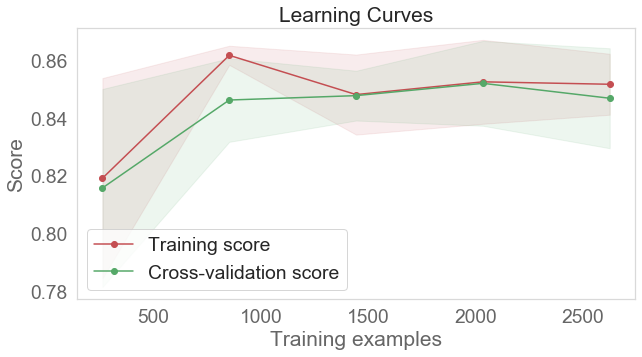

Confusion matrix, without normalization
[[693  12]
 [113   3]]


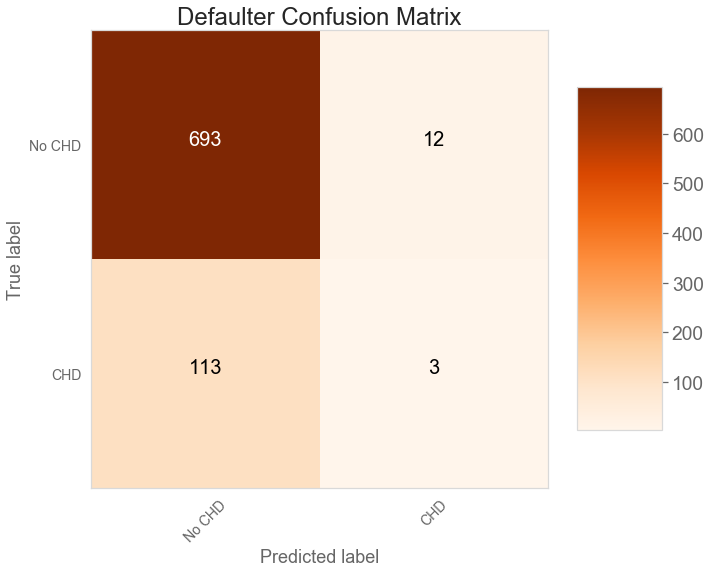

Misclassified Counts: 125
accuracy........ 0.8477
precision score........ 0.5299
recall score........ 0.5044
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92       705
           1       0.20      0.03      0.05       116

    accuracy                           0.85       821
   macro avg       0.53      0.50      0.48       821
weighted avg       0.77      0.85      0.79       821

AUC&ROC........ 0.5044


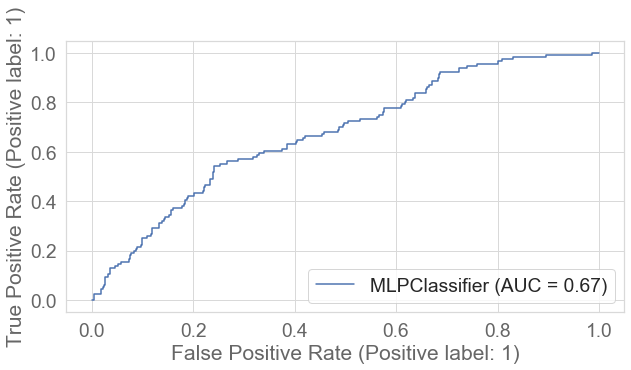

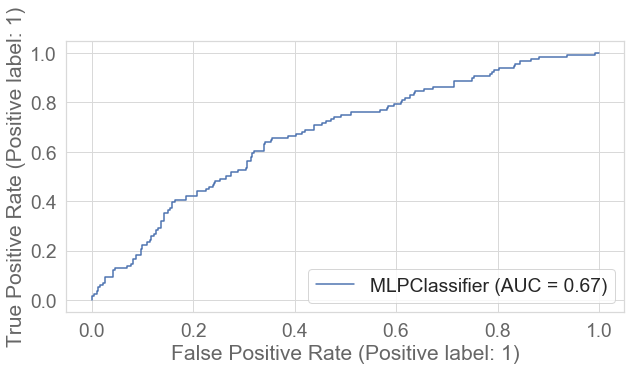

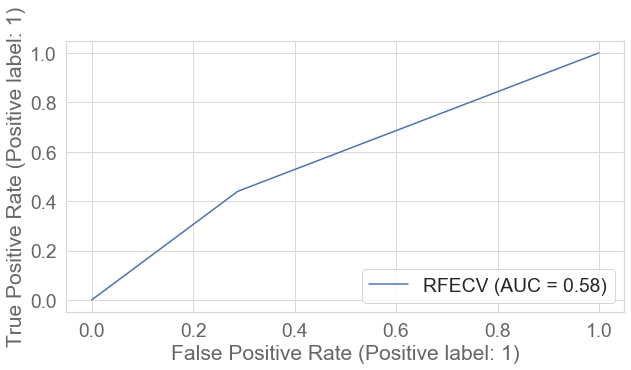

gbm... 

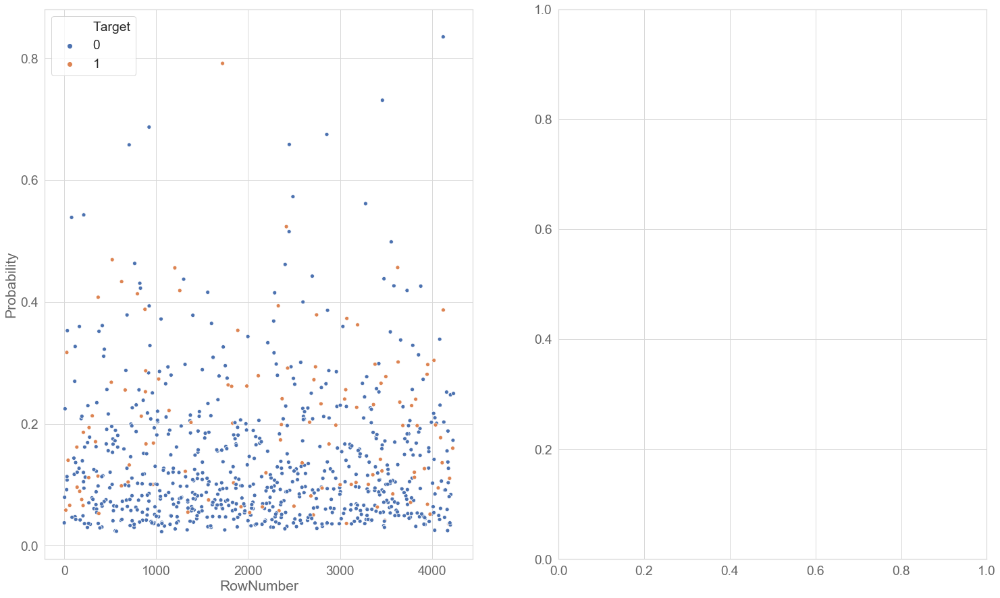

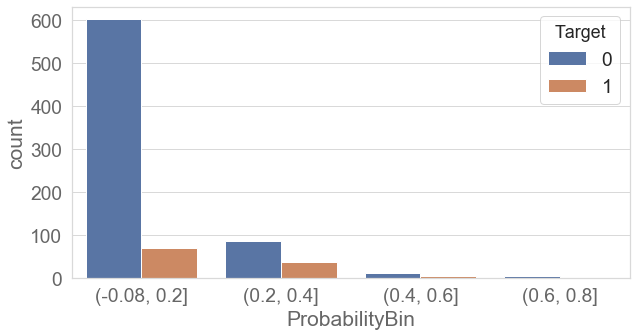

done
Now tuning GradientBoostingClassifier(random_state=30).
Fitting 5 folds for each of 100 candidates, totalling 500 fits


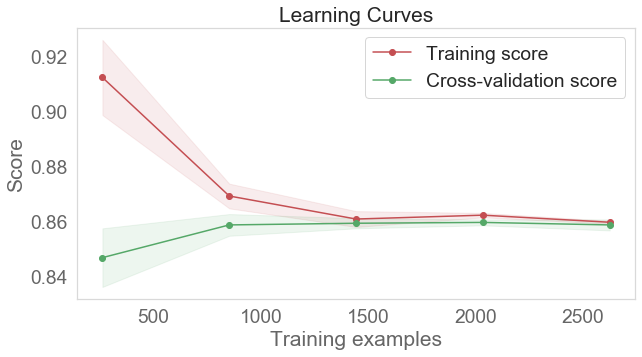

Confusion matrix, without normalization
[[699   6]
 [110   6]]


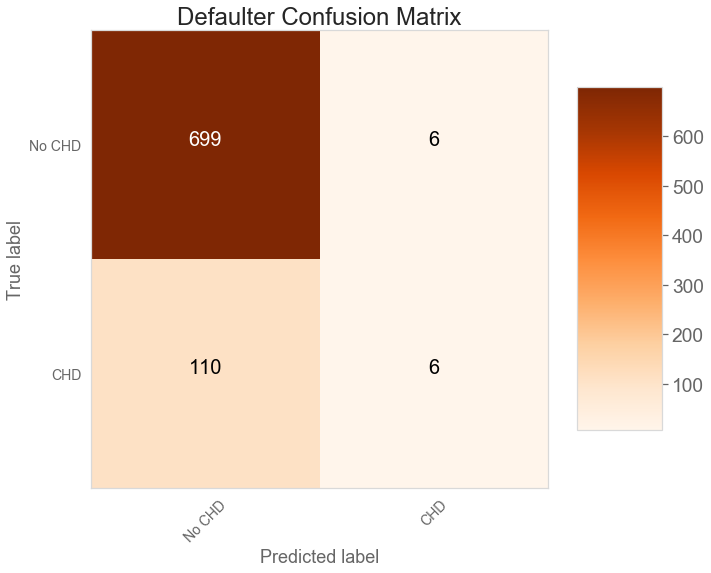

Misclassified Counts: 116
accuracy........ 0.8587
precision score........ 0.6820
recall score........ 0.5216
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       705
           1       0.50      0.05      0.09       116

    accuracy                           0.86       821
   macro avg       0.68      0.52      0.51       821
weighted avg       0.81      0.86      0.81       821

AUC&ROC........ 0.5216


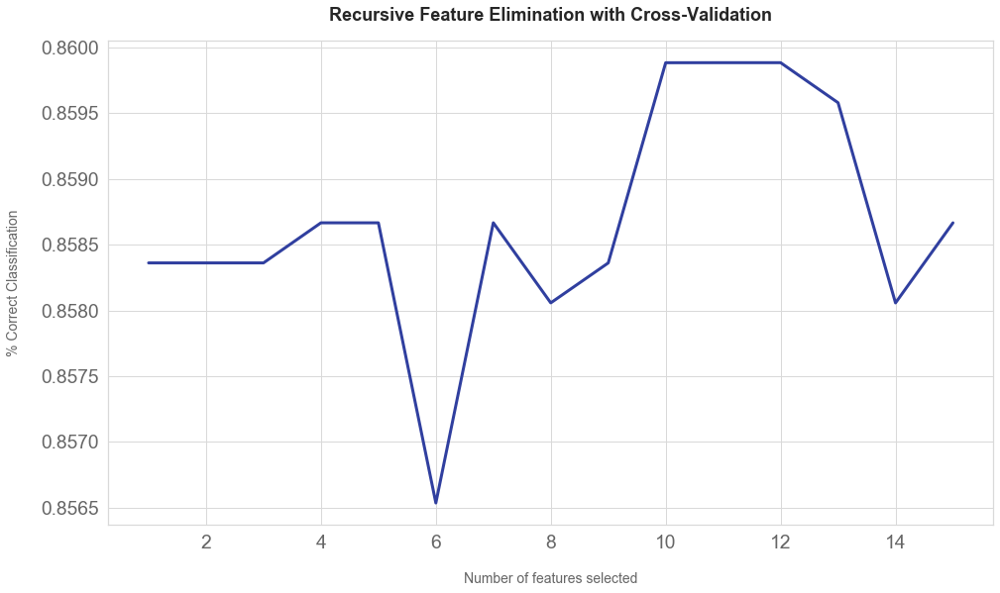

Optimal number of features: 11


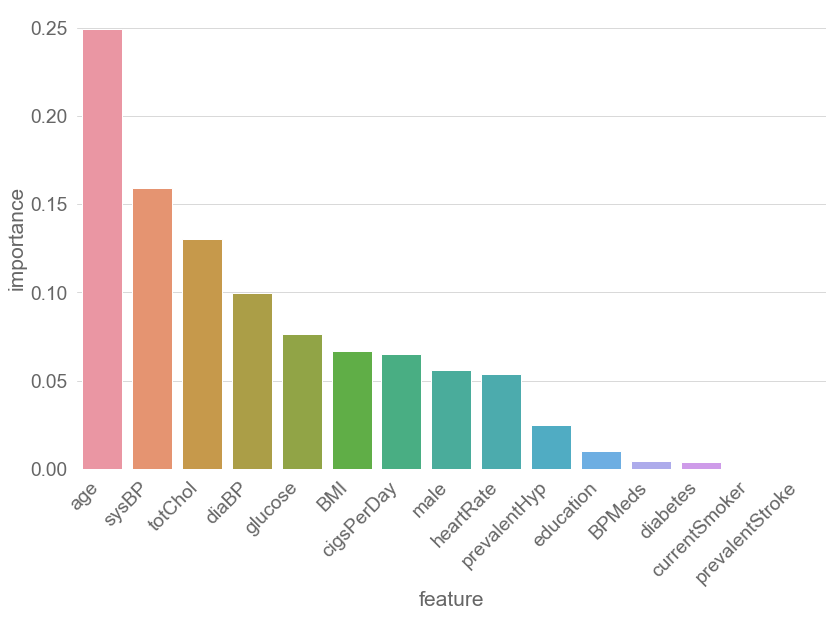

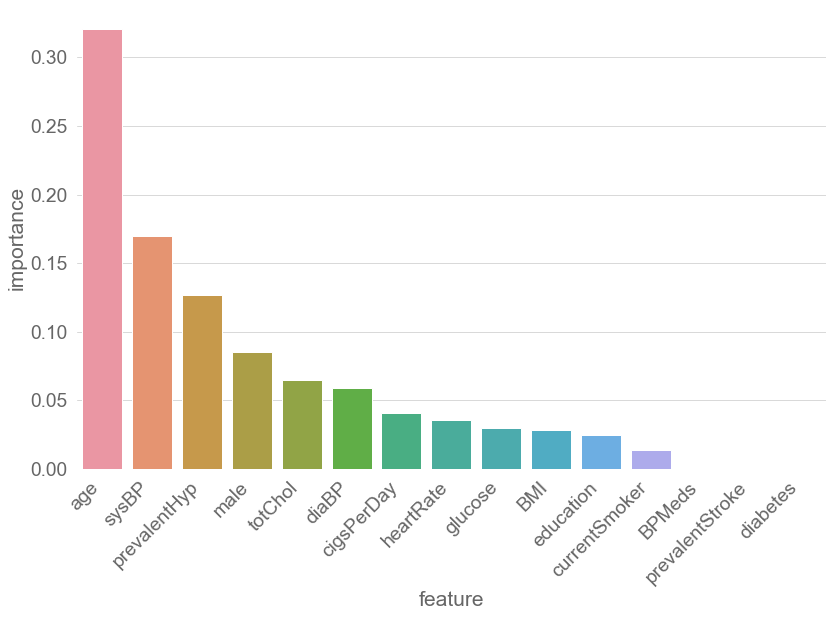

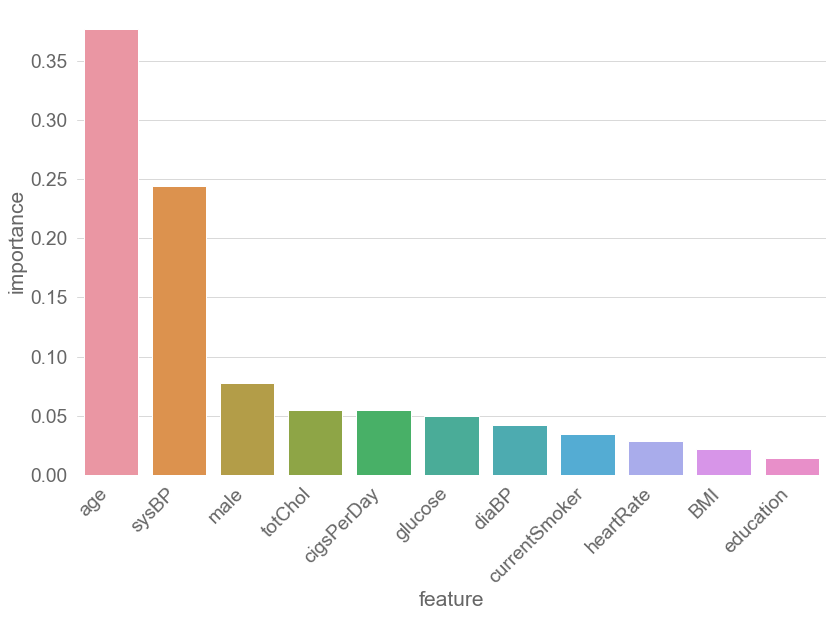

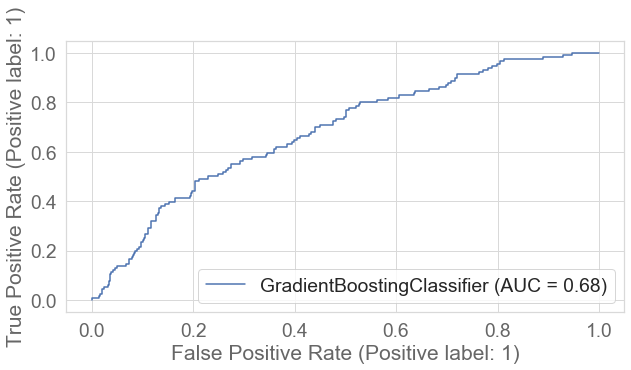

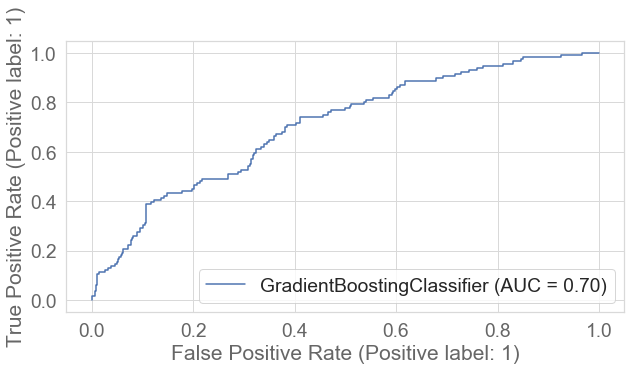

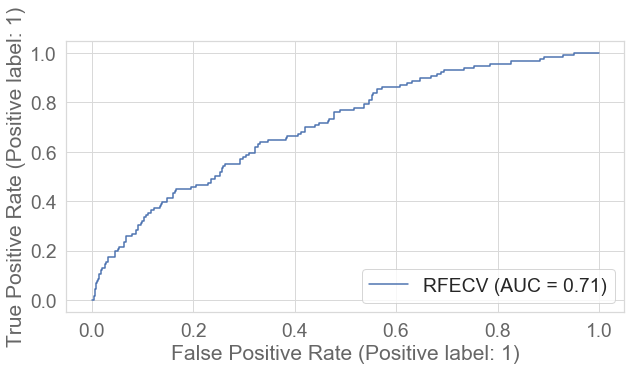

log reg... 

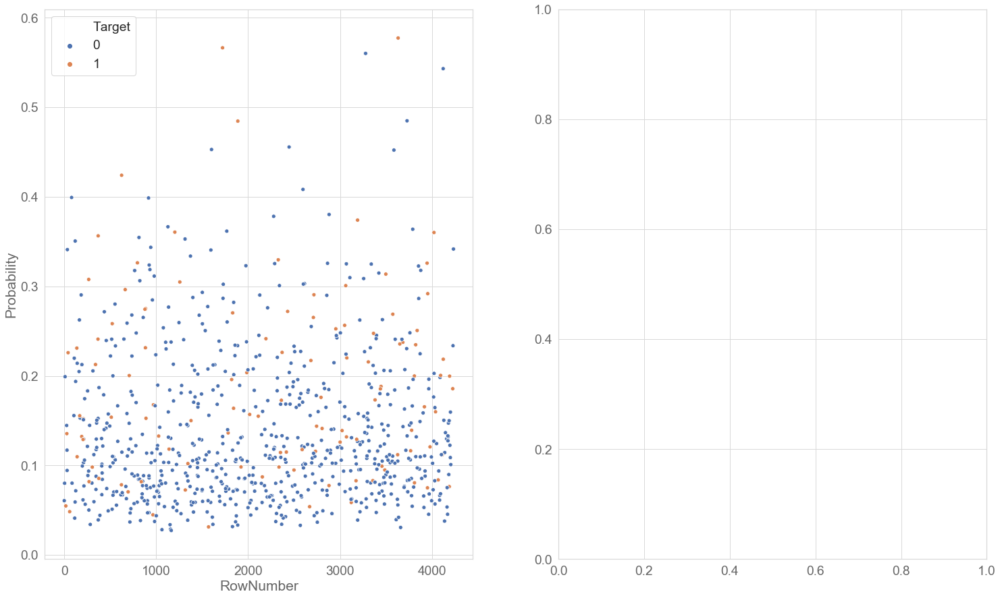

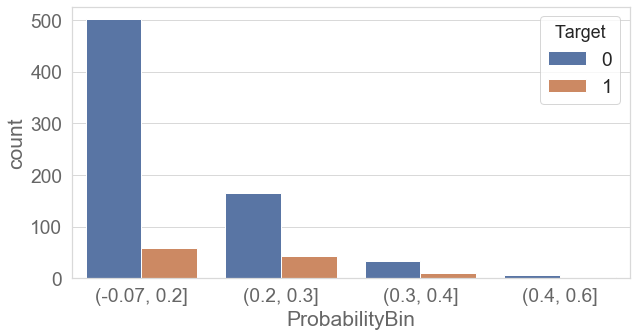

done
Now tuning LogisticRegression(random_state=0).
Fitting 5 folds for each of 1 candidates, totalling 5 fits


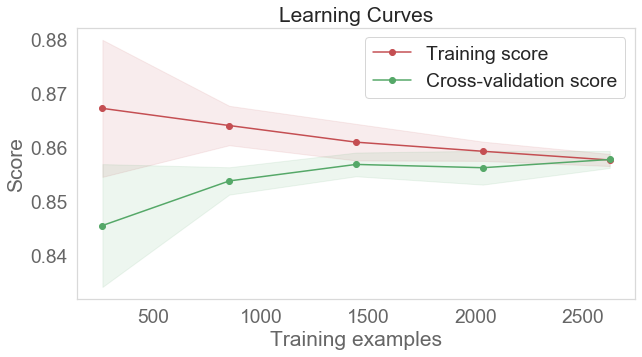

Confusion matrix, without normalization
[[699   6]
 [115   1]]


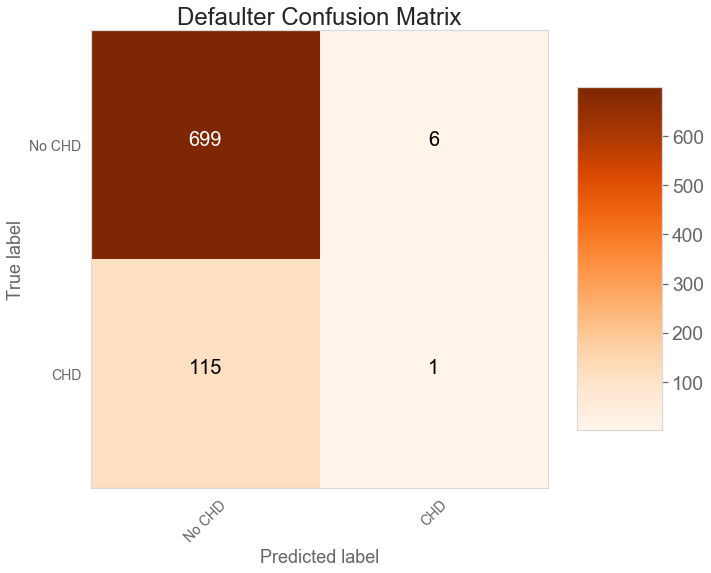

Misclassified Counts: 121
accuracy........ 0.8526
precision score........ 0.5008
recall score........ 0.5001
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       705
           1       0.14      0.01      0.02       116

    accuracy                           0.85       821
   macro avg       0.50      0.50      0.47       821
weighted avg       0.76      0.85      0.79       821

AUC&ROC........ 0.5001


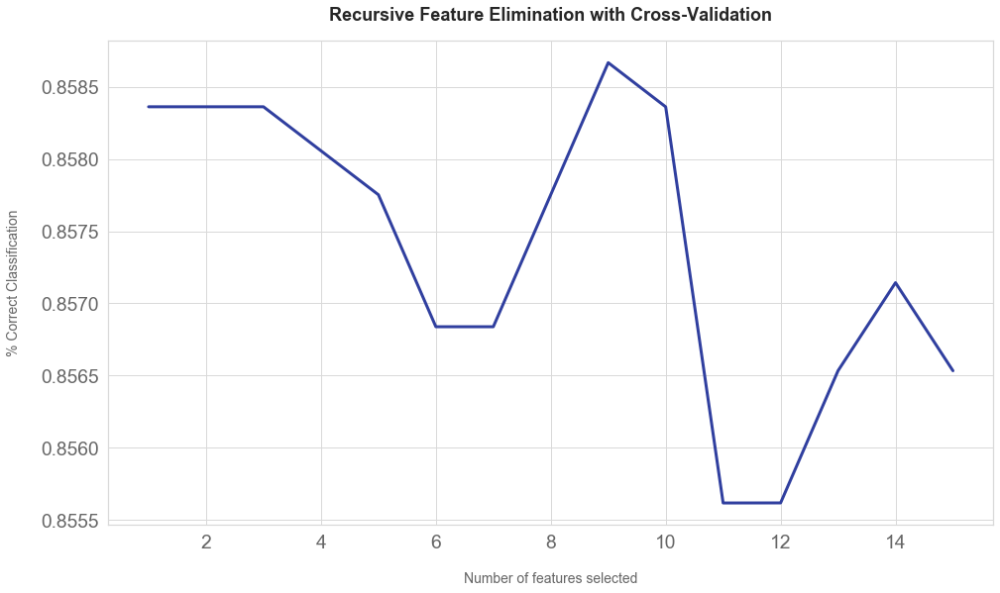

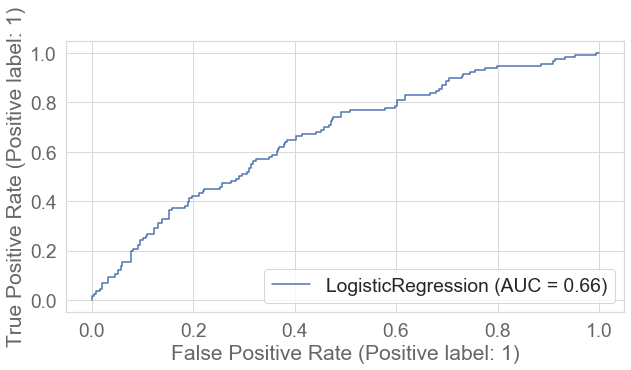

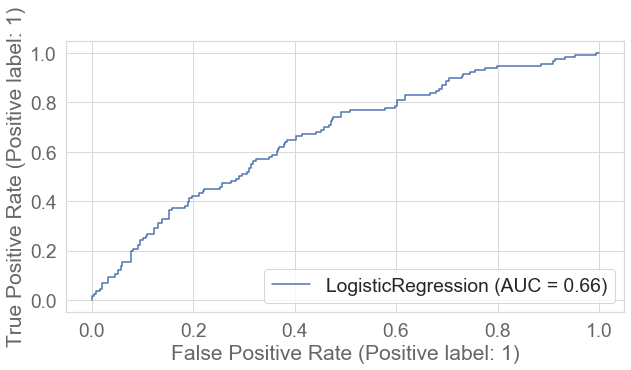

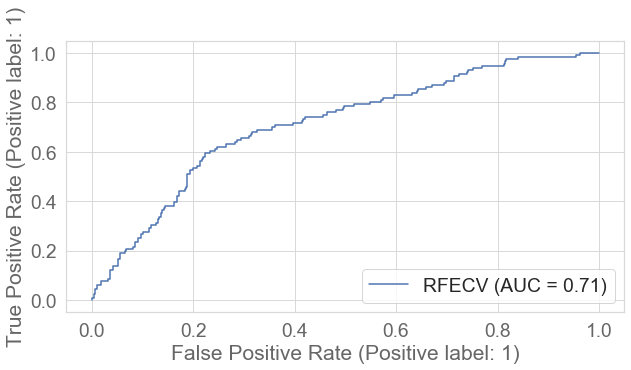

lda... 

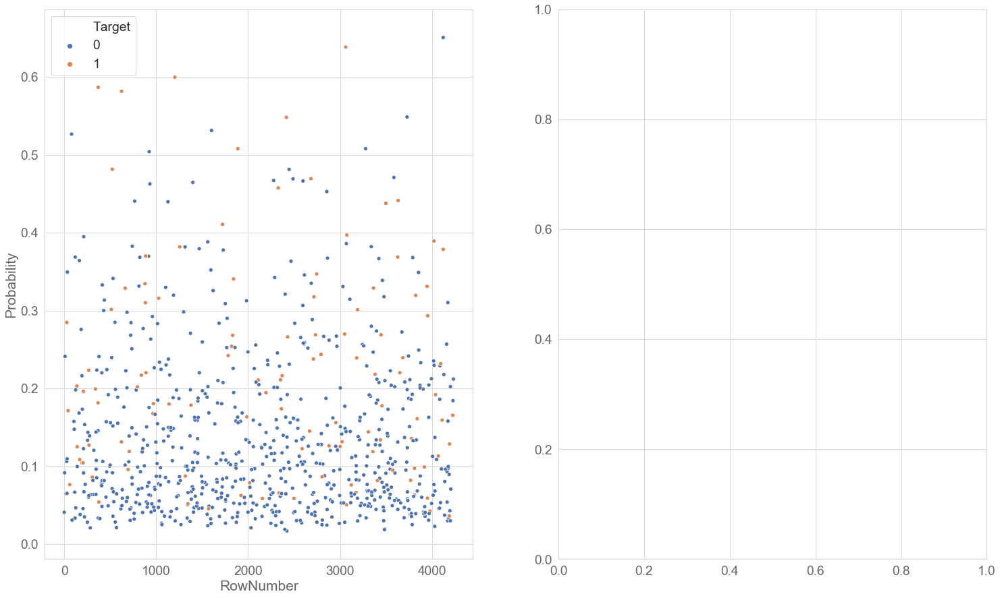

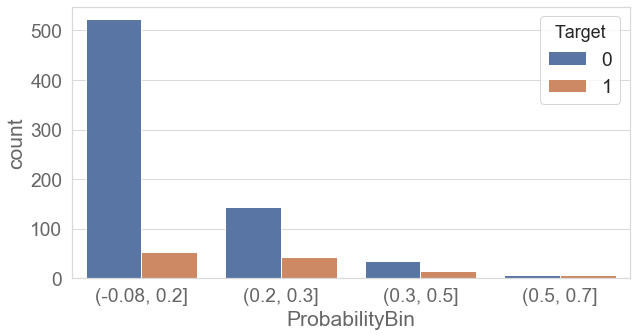

done
Now tuning LinearDiscriminantAnalysis().
Fitting 5 folds for each of 1 candidates, totalling 5 fits


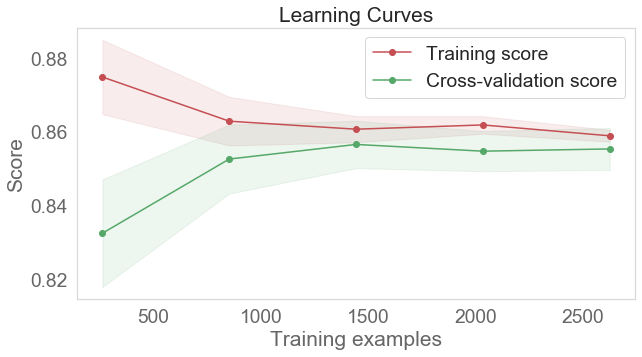

Confusion matrix, without normalization
[[696   9]
 [110   6]]


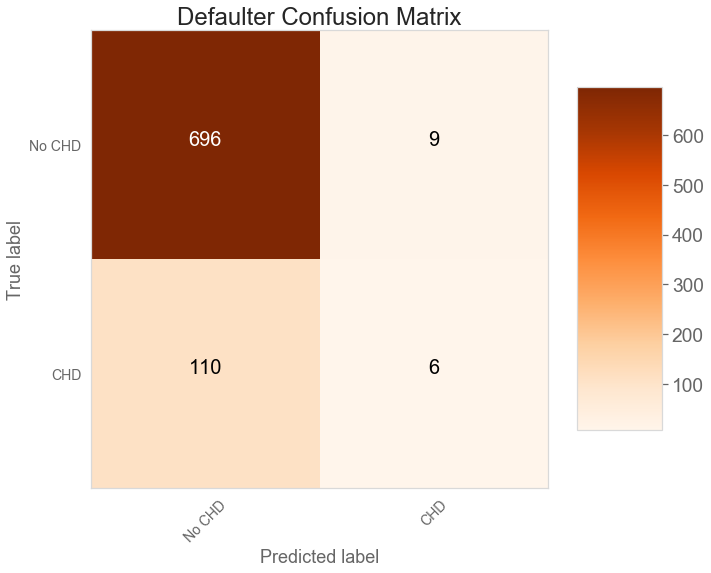

Misclassified Counts: 119
accuracy........ 0.8551
precision score........ 0.6318
recall score........ 0.5195
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       705
           1       0.40      0.05      0.09       116

    accuracy                           0.86       821
   macro avg       0.63      0.52      0.51       821
weighted avg       0.80      0.86      0.80       821

AUC&ROC........ 0.5195


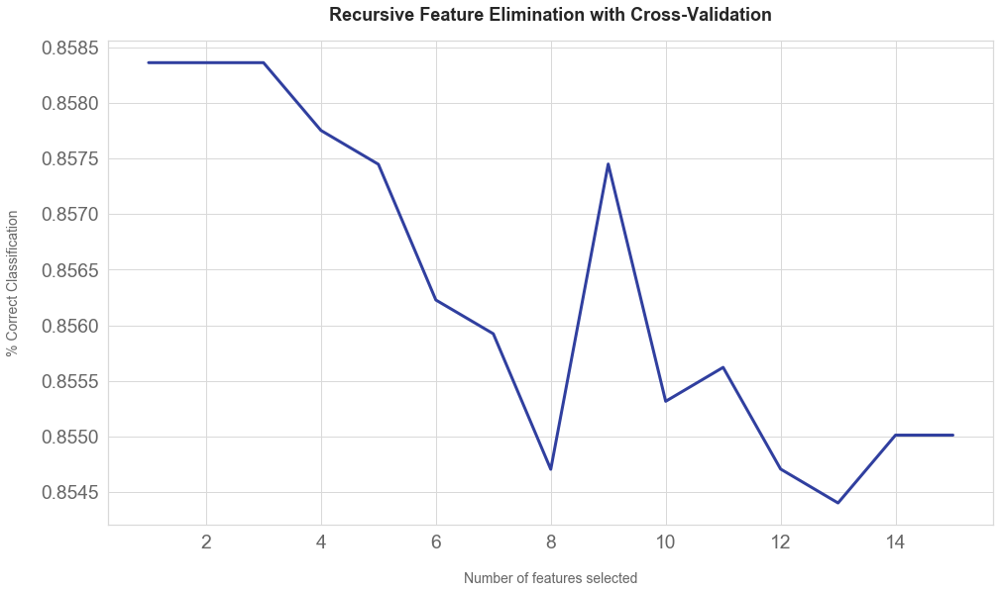

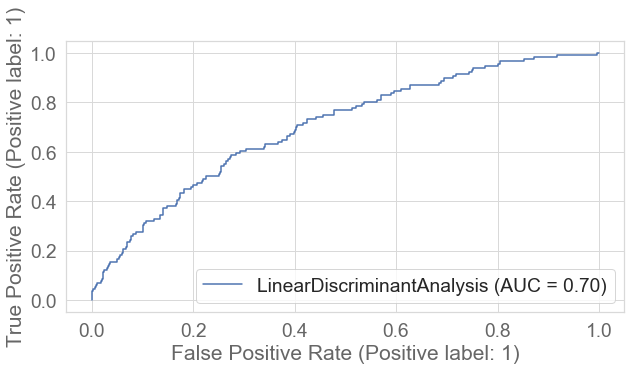

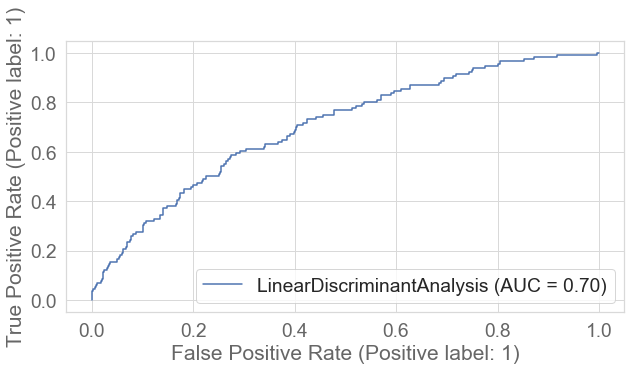

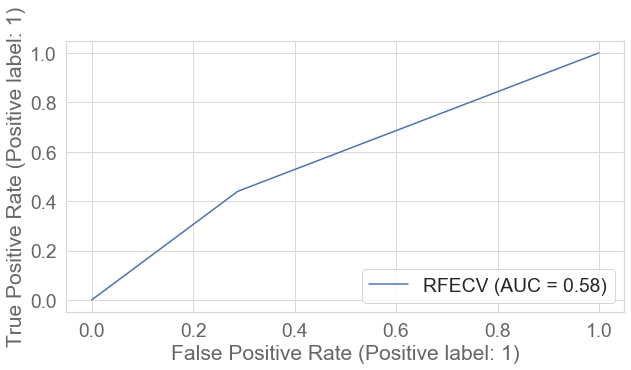

qda... 

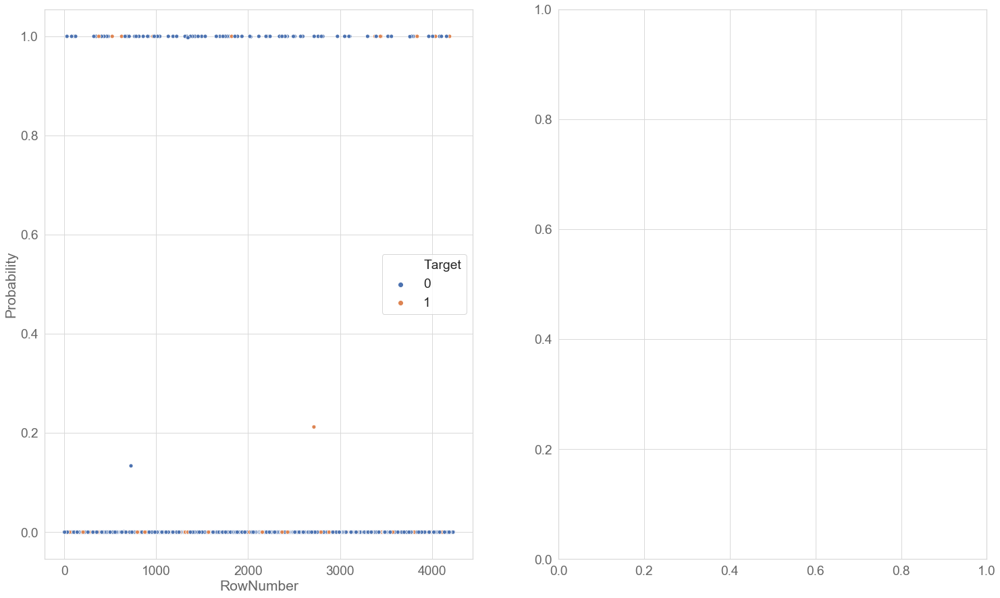

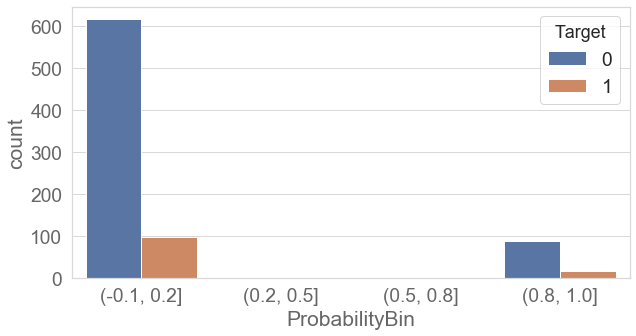

done
Now tuning QuadraticDiscriminantAnalysis().
Fitting 5 folds for each of 100 candidates, totalling 500 fits


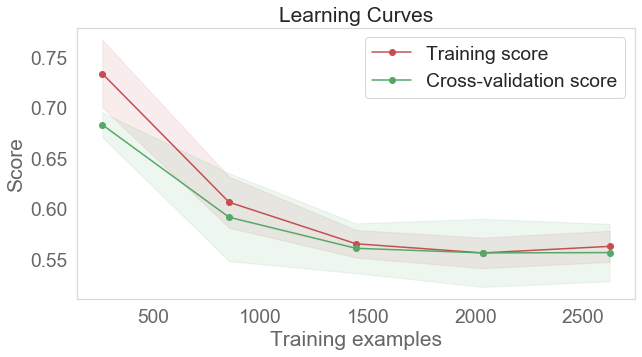

Confusion matrix, without normalization
[[400 305]
 [ 42  74]]


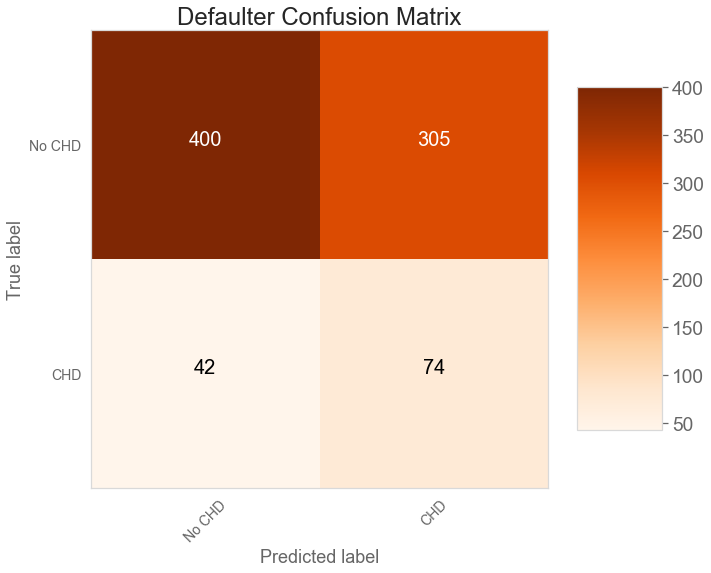

Misclassified Counts: 347
accuracy........ 0.5773
precision score........ 0.5501
recall score........ 0.6027
classification_report 
               precision    recall  f1-score   support

           0       0.90      0.57      0.70       705
           1       0.20      0.64      0.30       116

    accuracy                           0.58       821
   macro avg       0.55      0.60      0.50       821
weighted avg       0.80      0.58      0.64       821

AUC&ROC........ 0.6027


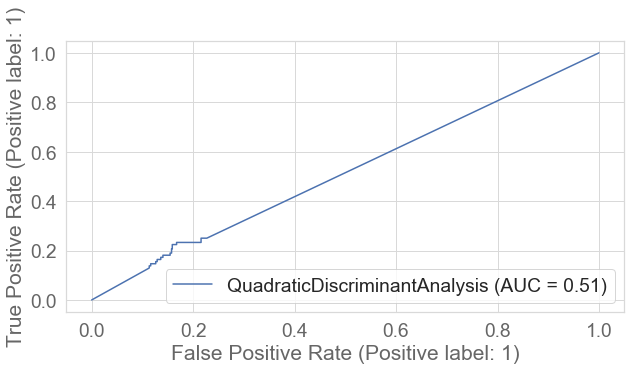

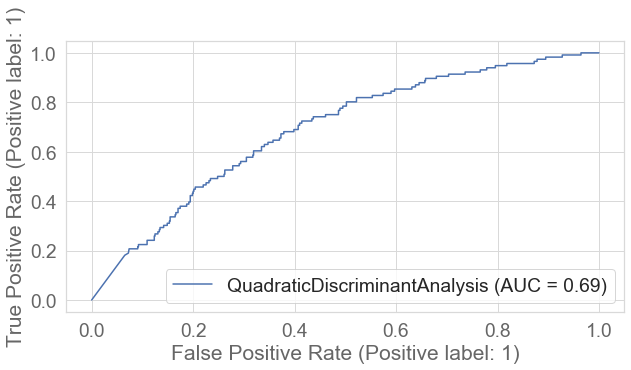

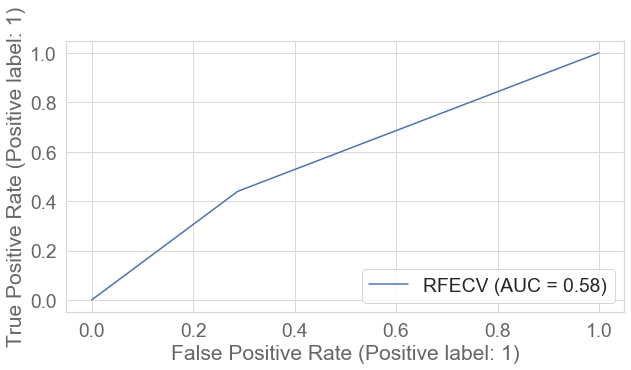

random forest... 

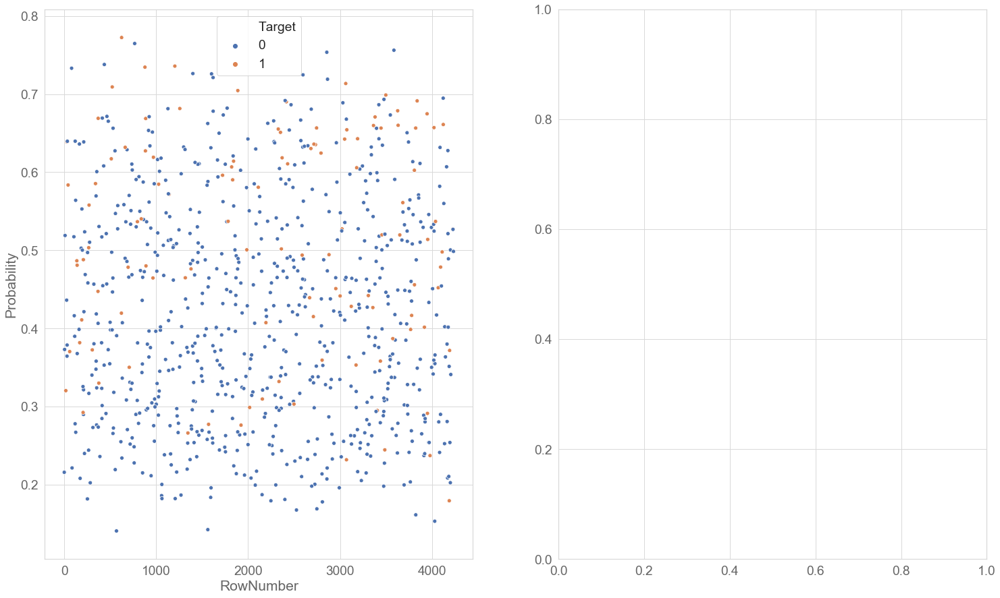

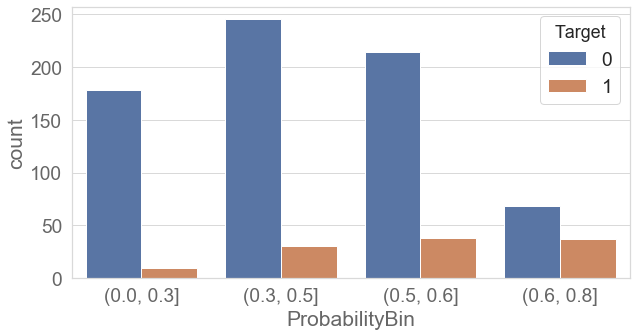

done
Now tuning RandomForestClassifier(bootstrap='True', class_weight='balanced', max_depth=5,
                       max_leaf_nodes=50, min_samples_split=10,
                       random_state=30).
Fitting 5 folds for each of 100 candidates, totalling 500 fits


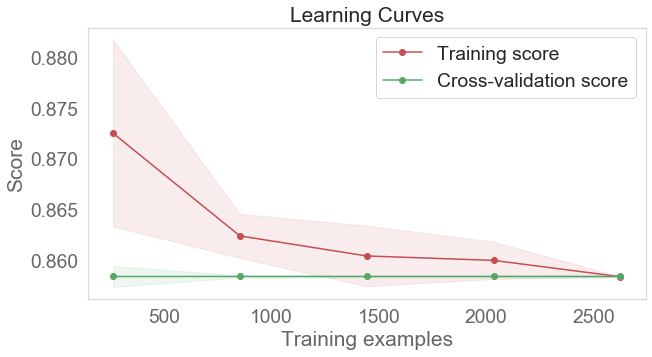

Confusion matrix, without normalization
[[705   0]
 [116   0]]


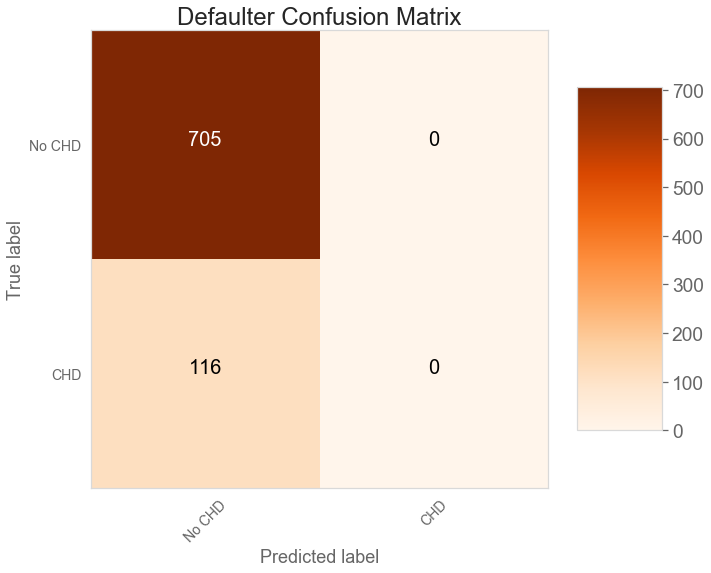

Misclassified Counts: 116
accuracy........ 0.8587
precision score........ 0.4294
recall score........ 0.5000
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.5000


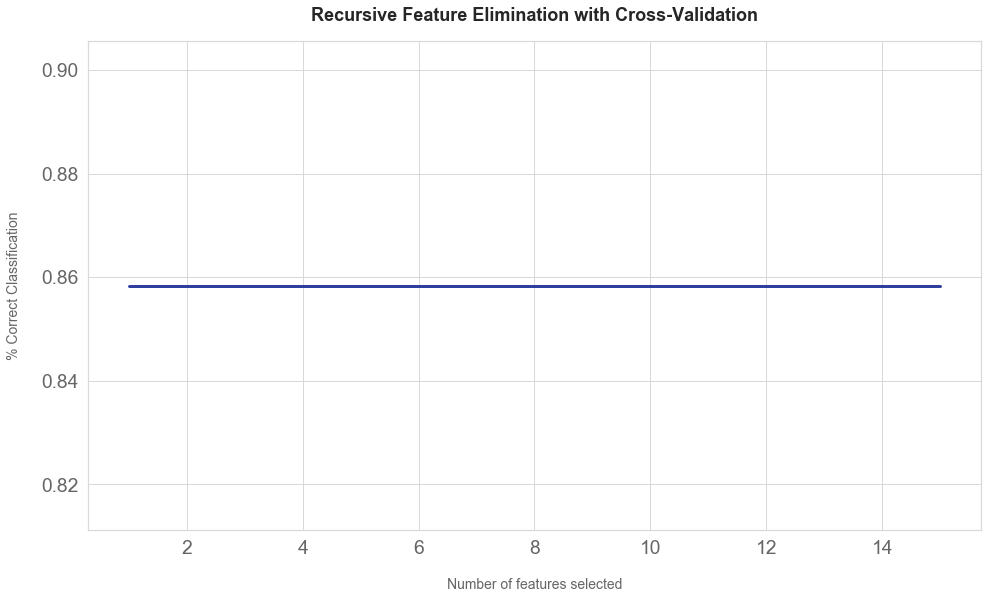

Optimal number of features: 1


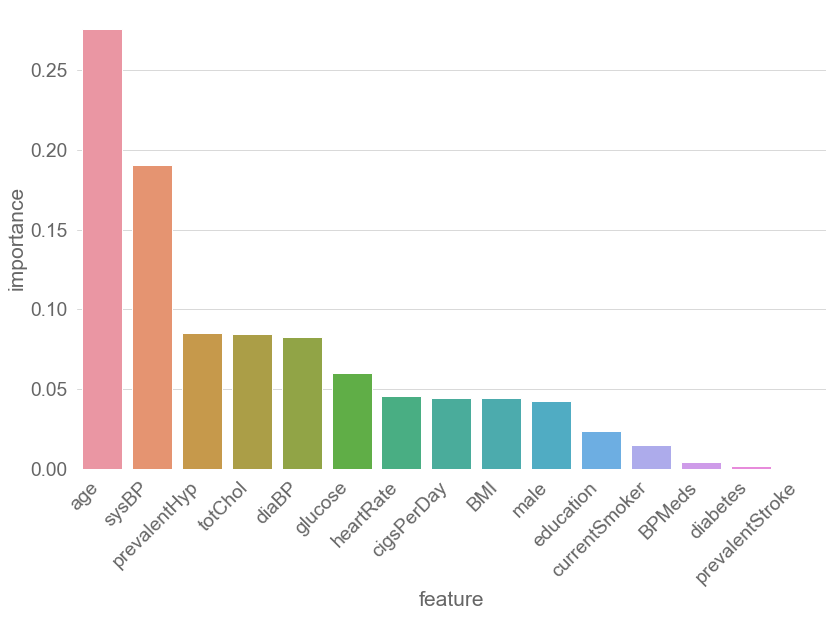

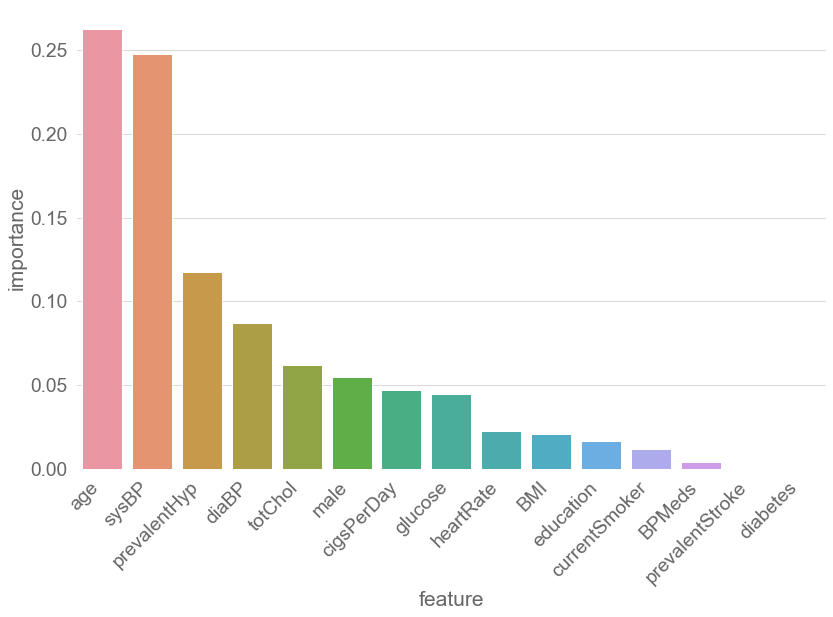

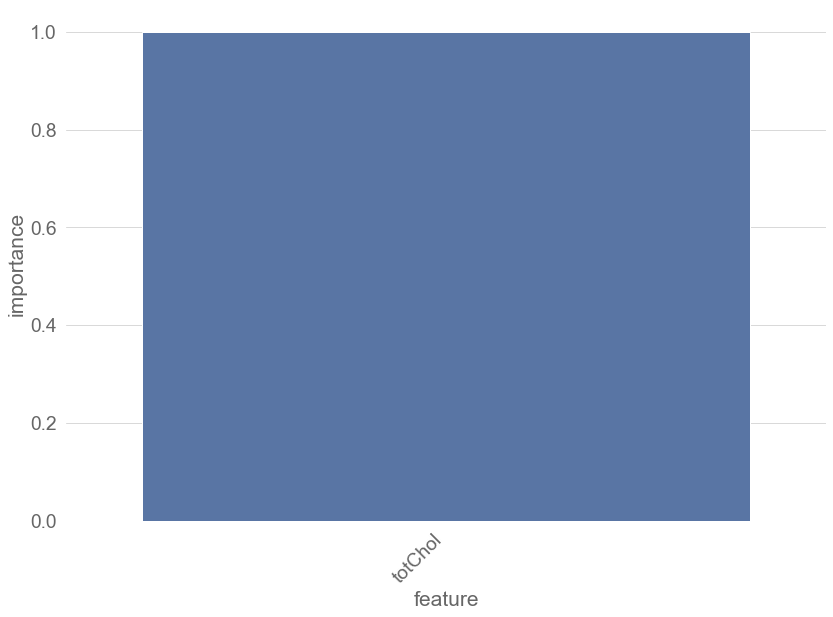

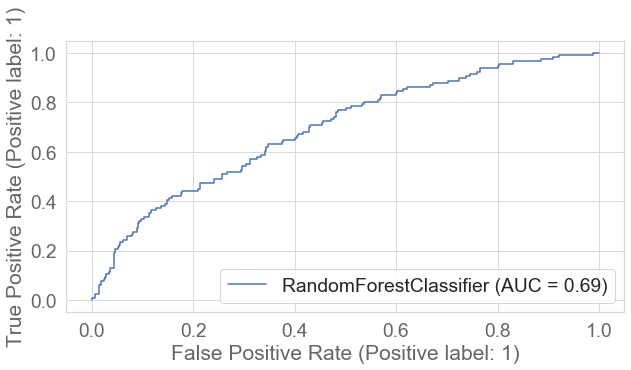

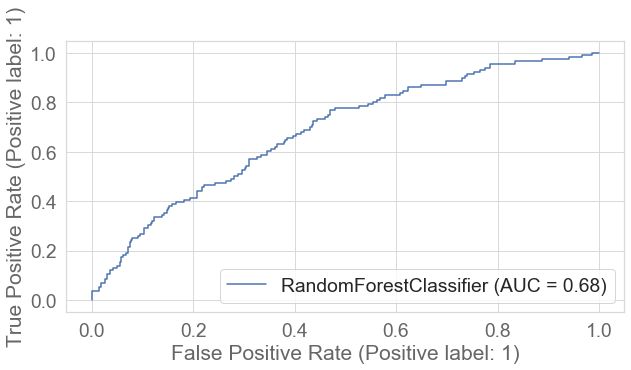

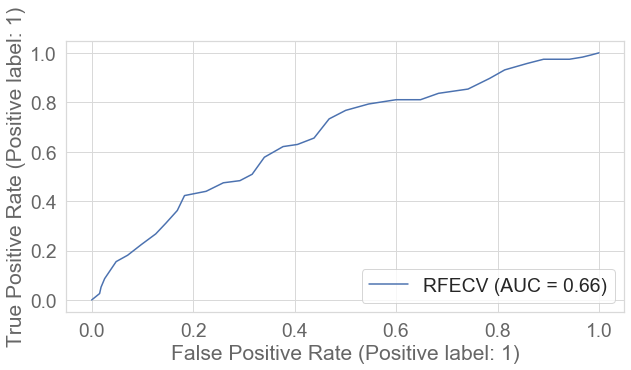

bagging... 

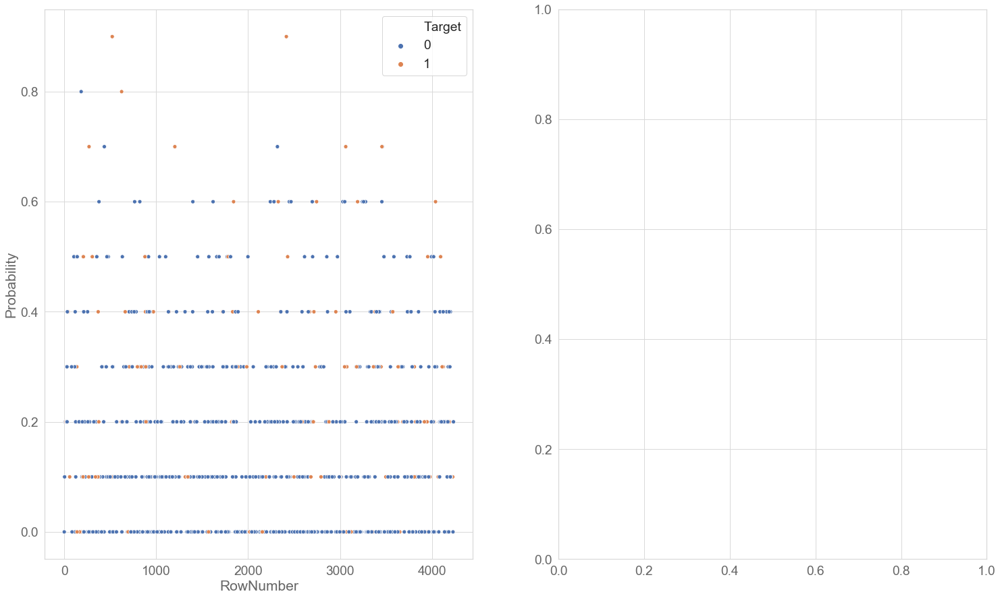

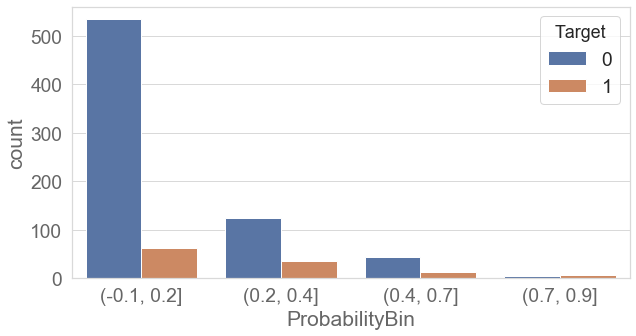

done
Now tuning BaggingClassifier().
Fitting 5 folds for each of 45 candidates, totalling 225 fits


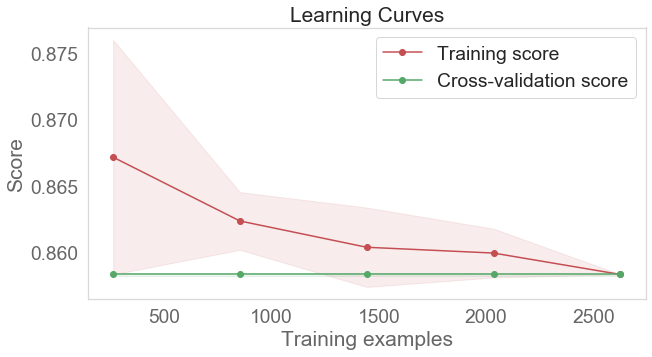

Confusion matrix, without normalization
[[705   0]
 [116   0]]


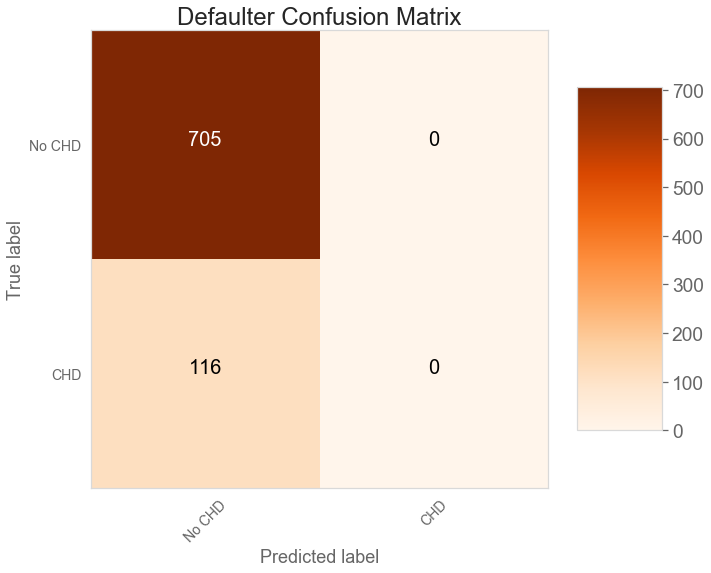

Misclassified Counts: 116
accuracy........ 0.8587
precision score........ 0.4294
recall score........ 0.5000
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.5000


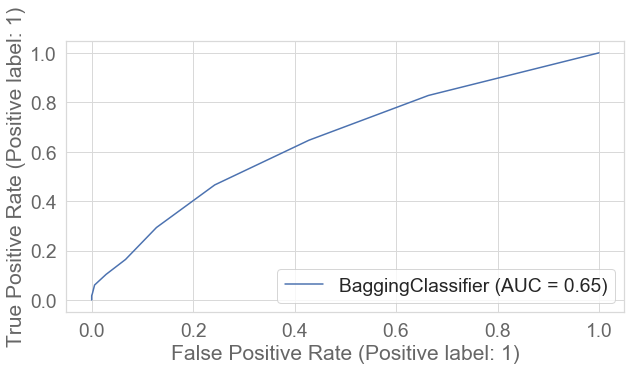

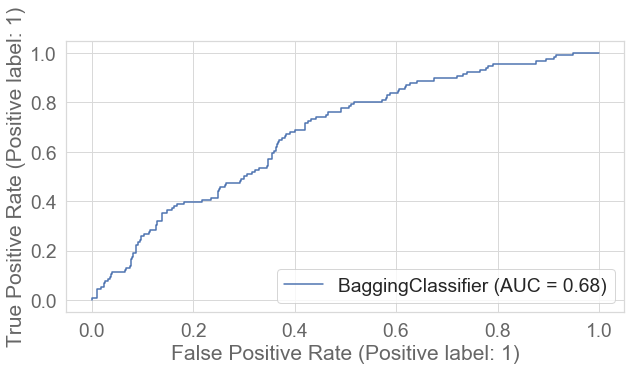

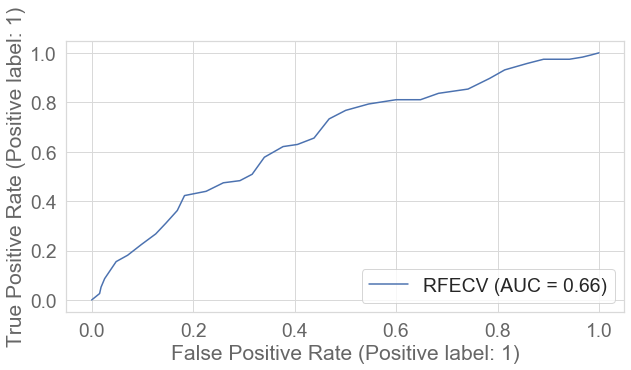

ada boost... 

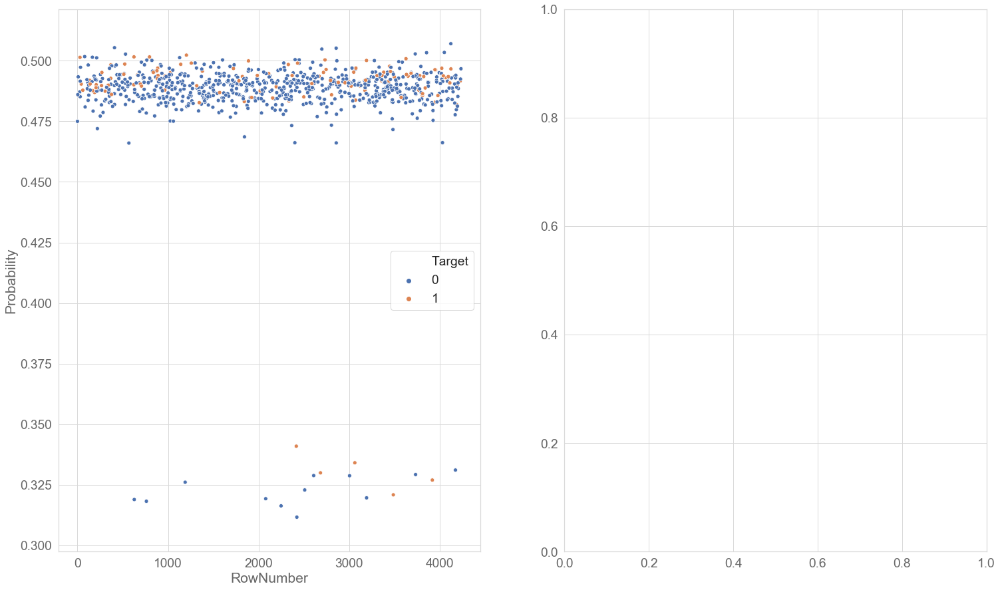

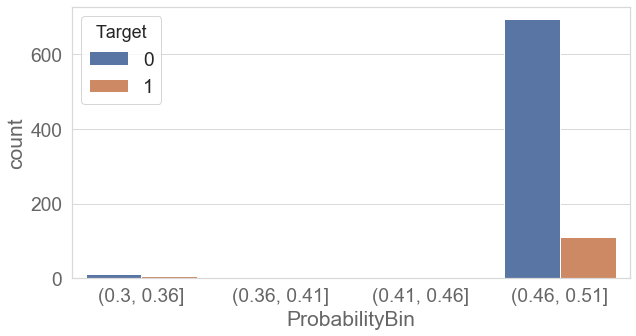

done
Now tuning AdaBoostClassifier().
Fitting 5 folds for each of 40 candidates, totalling 200 fits


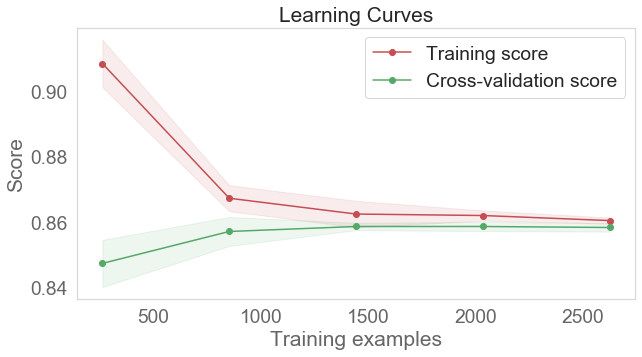

Confusion matrix, without normalization
[[699   6]
 [113   3]]


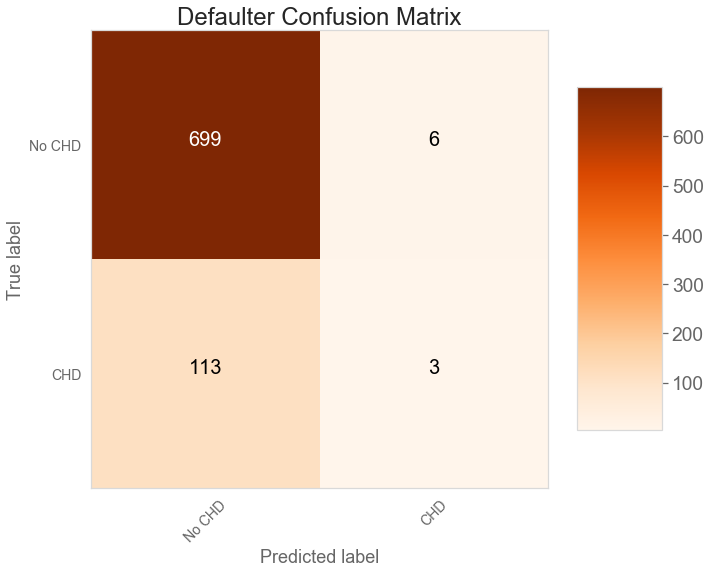

Misclassified Counts: 119
accuracy........ 0.8551
precision score........ 0.5971
recall score........ 0.5087
classification_report 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       705
           1       0.33      0.03      0.05       116

    accuracy                           0.86       821
   macro avg       0.60      0.51      0.48       821
weighted avg       0.79      0.86      0.80       821

AUC&ROC........ 0.5087


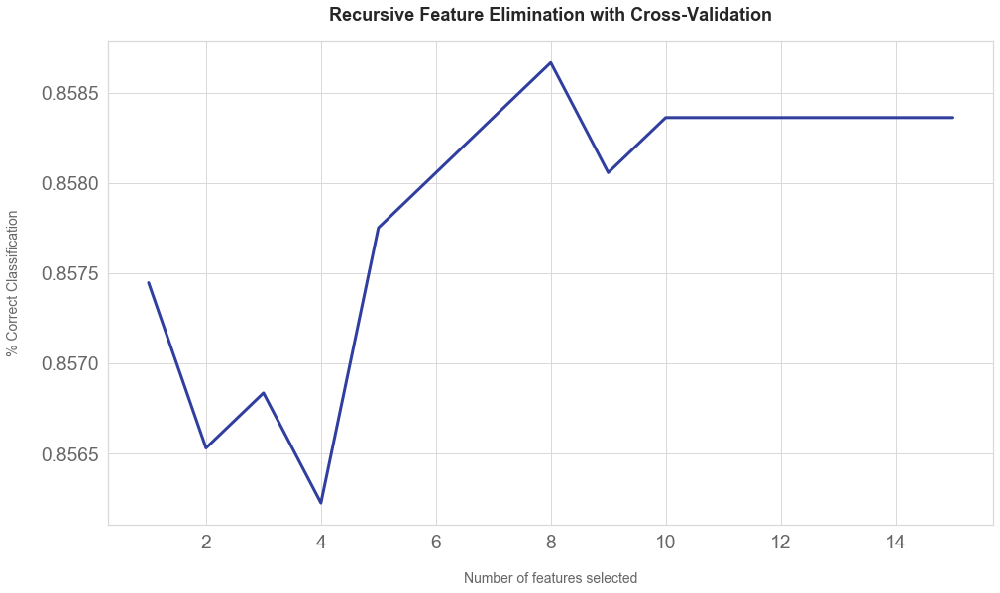

Optimal number of features: 8


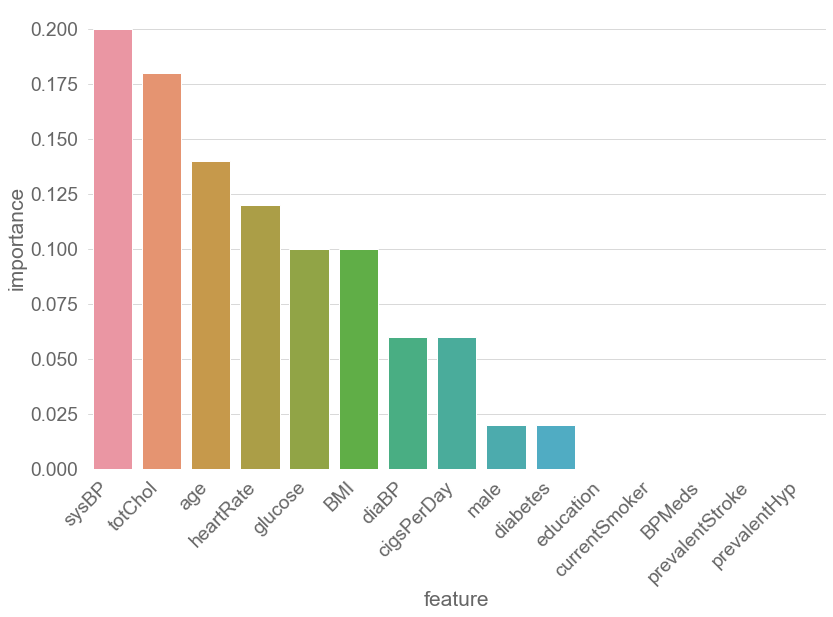

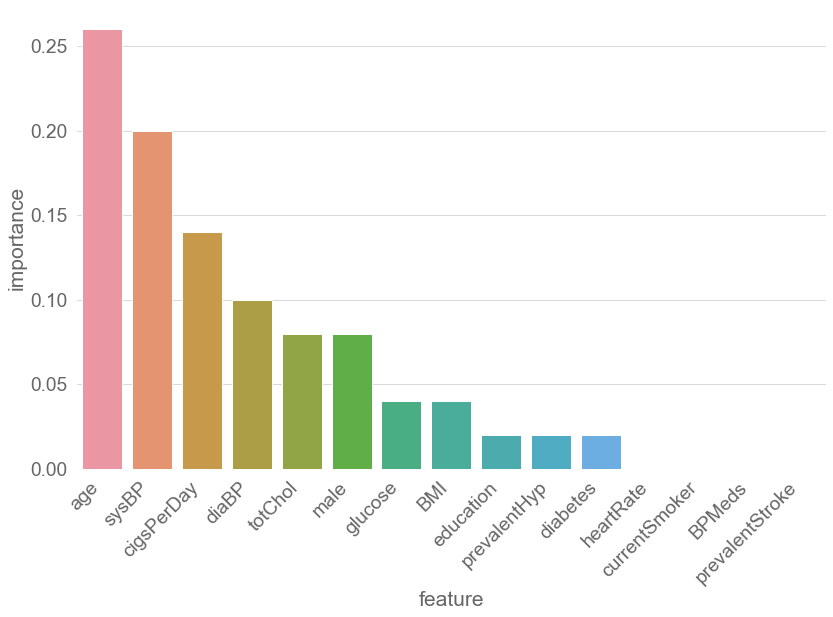

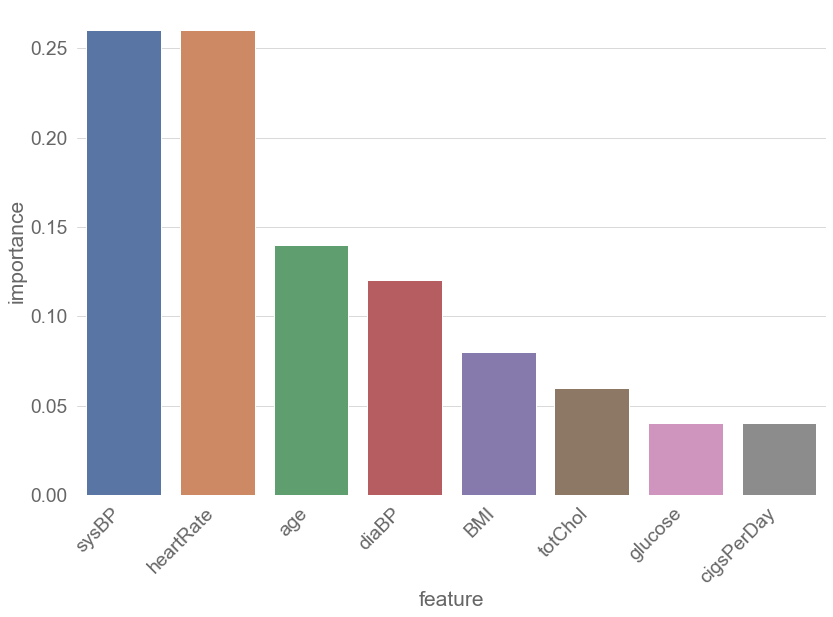

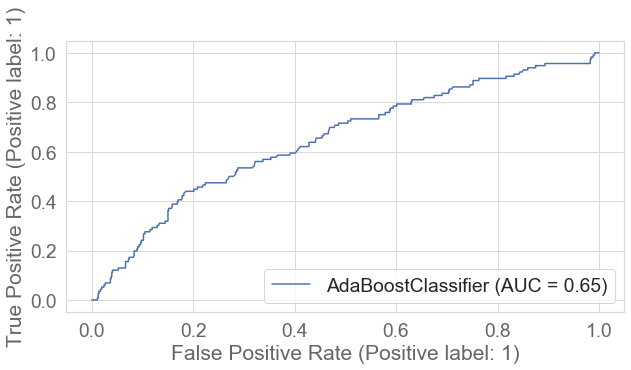

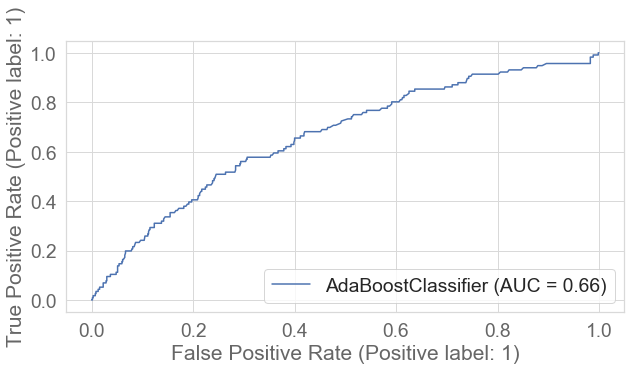

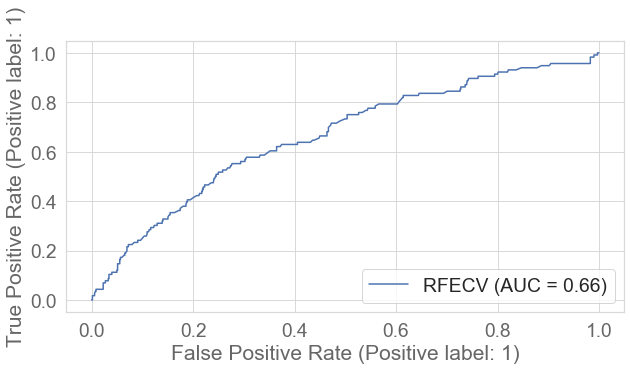

knn... 

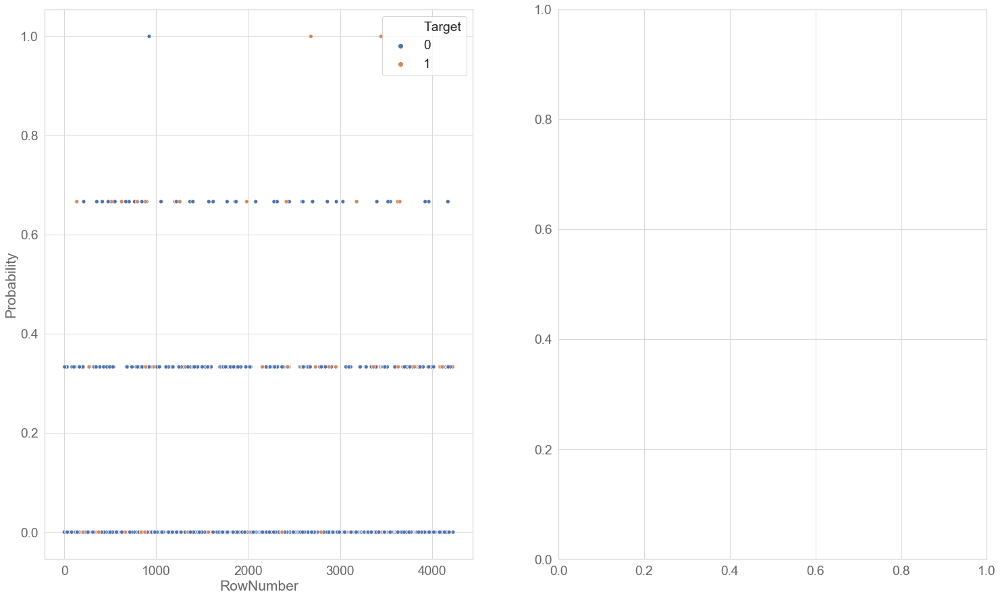

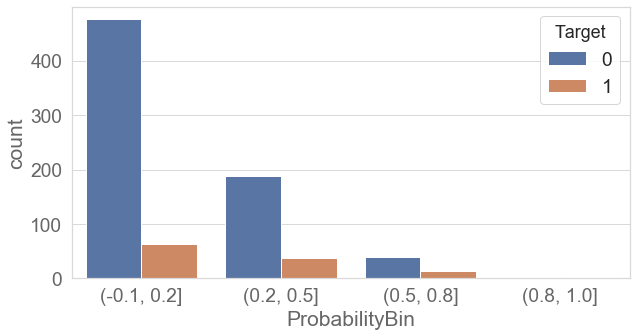

done
Now tuning KNeighborsClassifier(n_jobs=-1, n_neighbors=3).
Fitting 5 folds for each of 100 candidates, totalling 500 fits


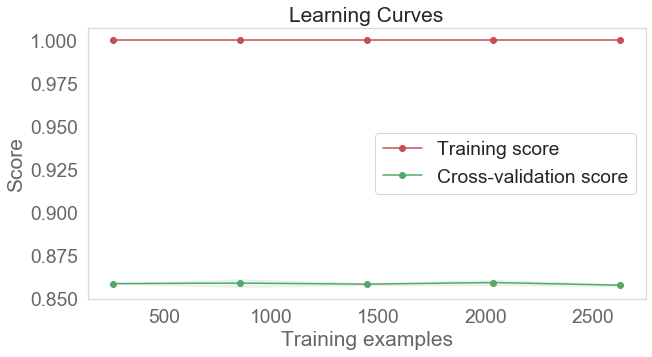

Confusion matrix, without normalization
[[704   1]
 [116   0]]


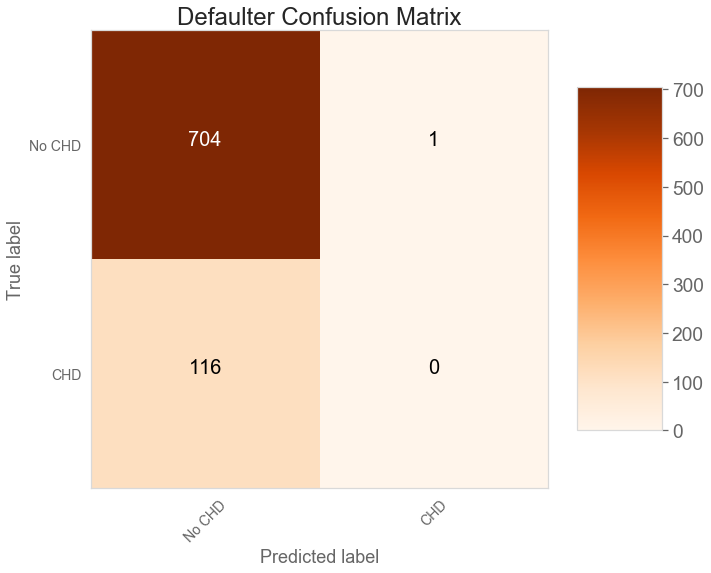

Misclassified Counts: 117
accuracy........ 0.8575
precision score........ 0.4293
recall score........ 0.4993
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.4993


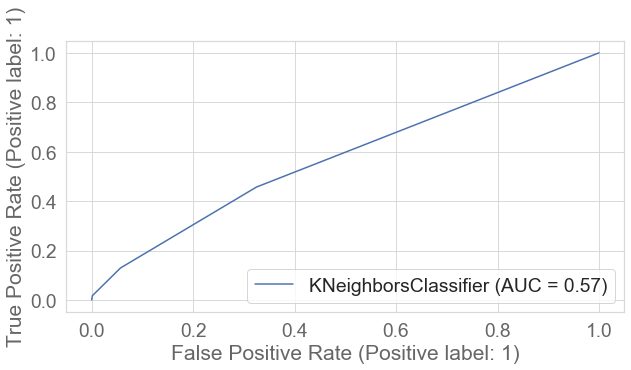

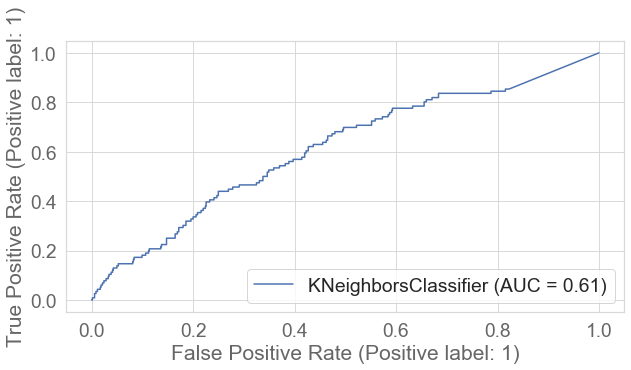

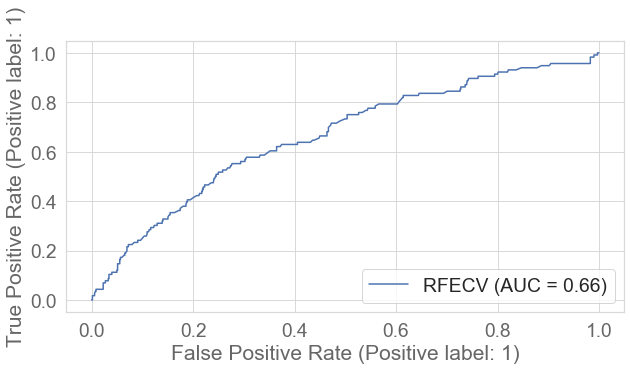

naive bayes... 

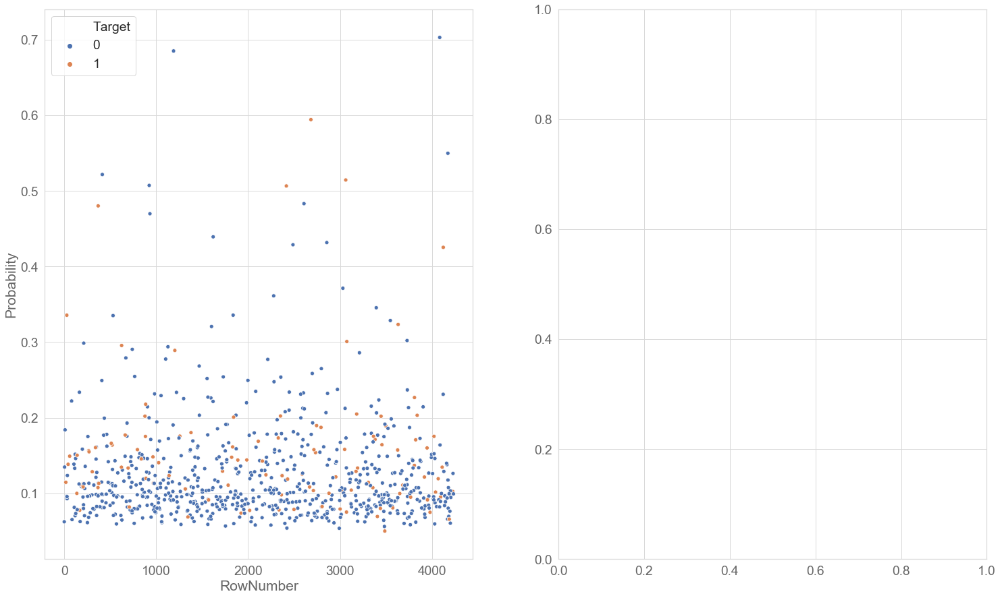

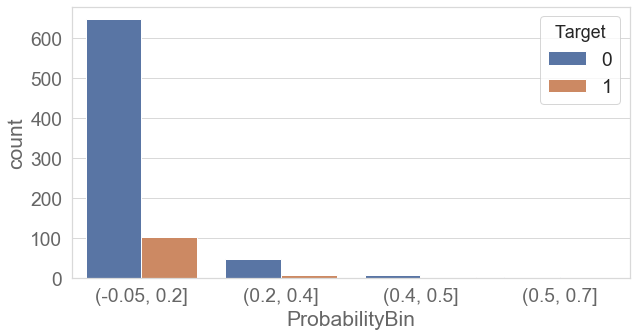

done
Now tuning GaussianNB(var_smoothing=0.25).
Fitting 5 folds for each of 5 candidates, totalling 25 fits


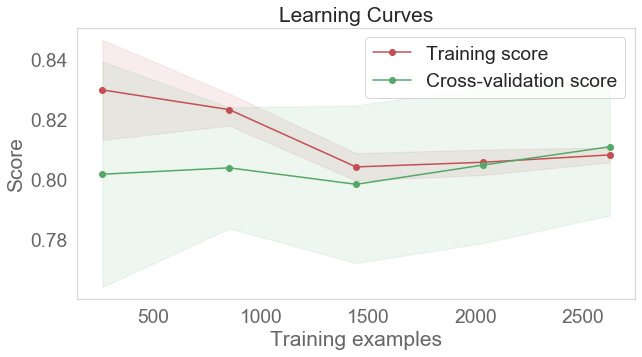

Confusion matrix, without normalization
[[644  61]
 [100  16]]


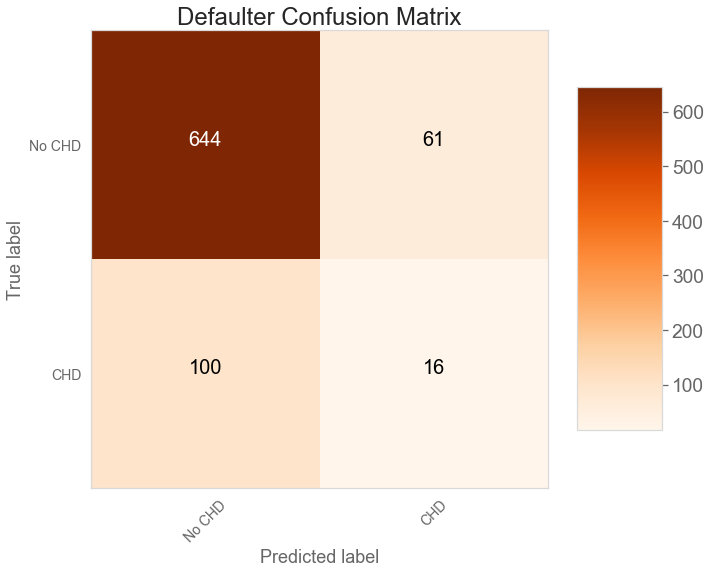

Misclassified Counts: 161
accuracy........ 0.8039
precision score........ 0.5367
recall score........ 0.5257
classification_report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89       705
           1       0.21      0.14      0.17       116

    accuracy                           0.80       821
   macro avg       0.54      0.53      0.53       821
weighted avg       0.77      0.80      0.79       821

AUC&ROC........ 0.5257


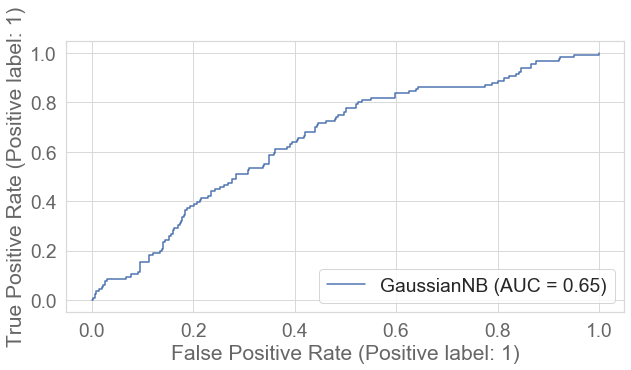

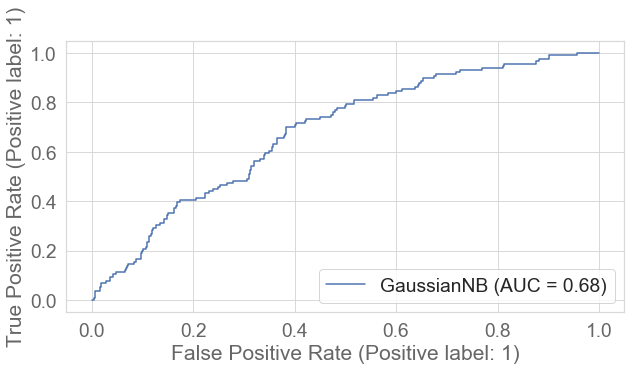

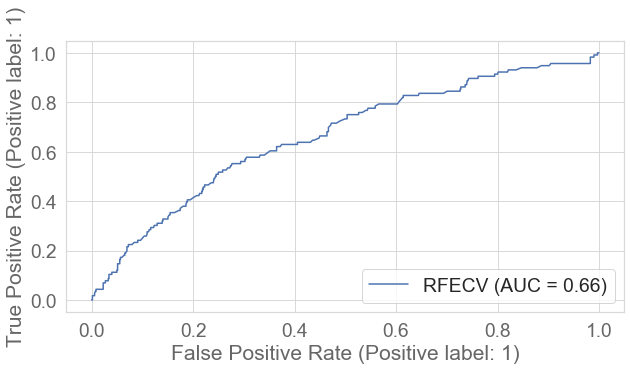

DTC... 

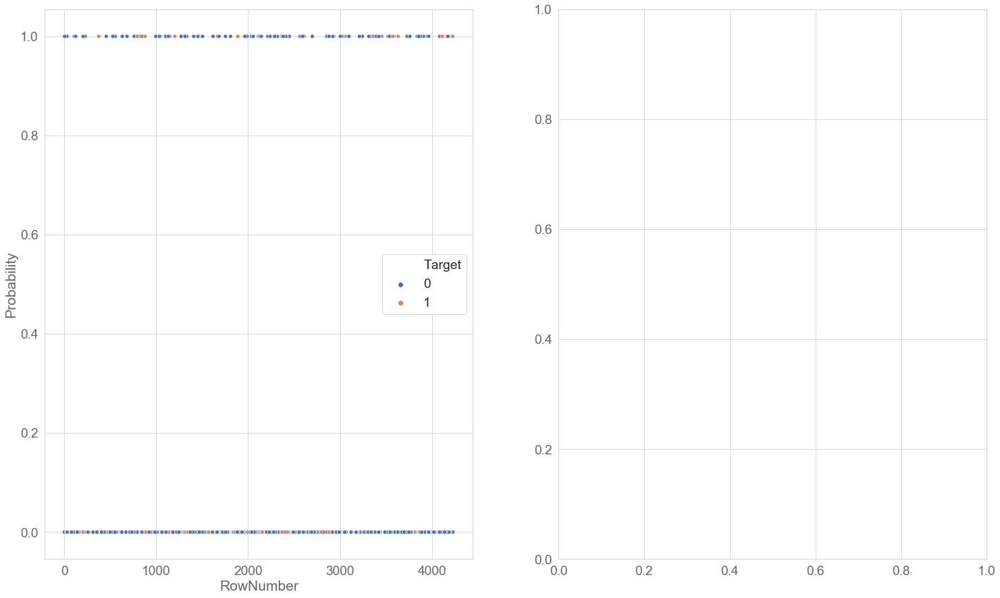

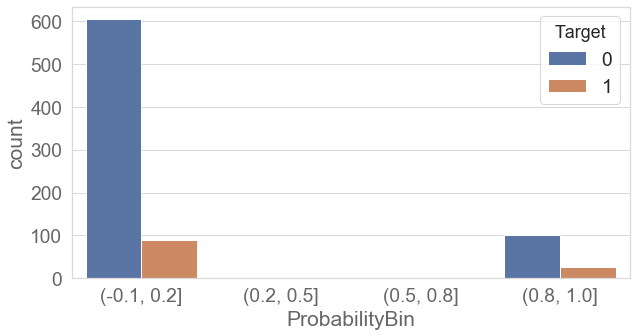

done
Now tuning DecisionTreeClassifier().
Fitting 5 folds for each of 100 candidates, totalling 500 fits


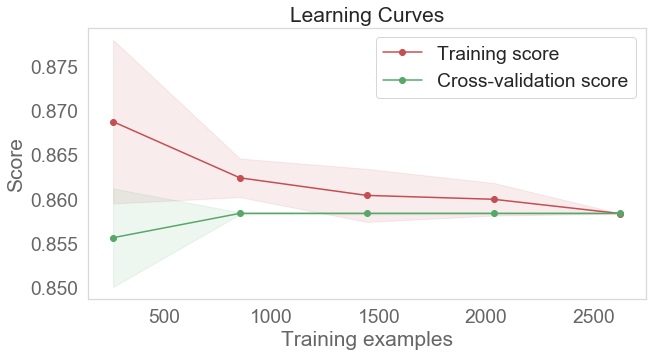

Confusion matrix, without normalization
[[705   0]
 [116   0]]


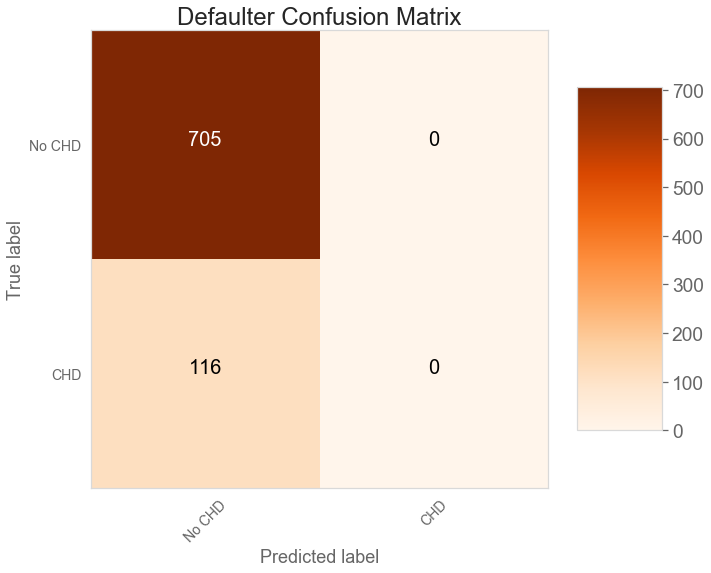

Misclassified Counts: 116
accuracy........ 0.8587
precision score........ 0.4294
recall score........ 0.5000
classification_report 
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       705
           1       0.00      0.00      0.00       116

    accuracy                           0.86       821
   macro avg       0.43      0.50      0.46       821
weighted avg       0.74      0.86      0.79       821

AUC&ROC........ 0.5000


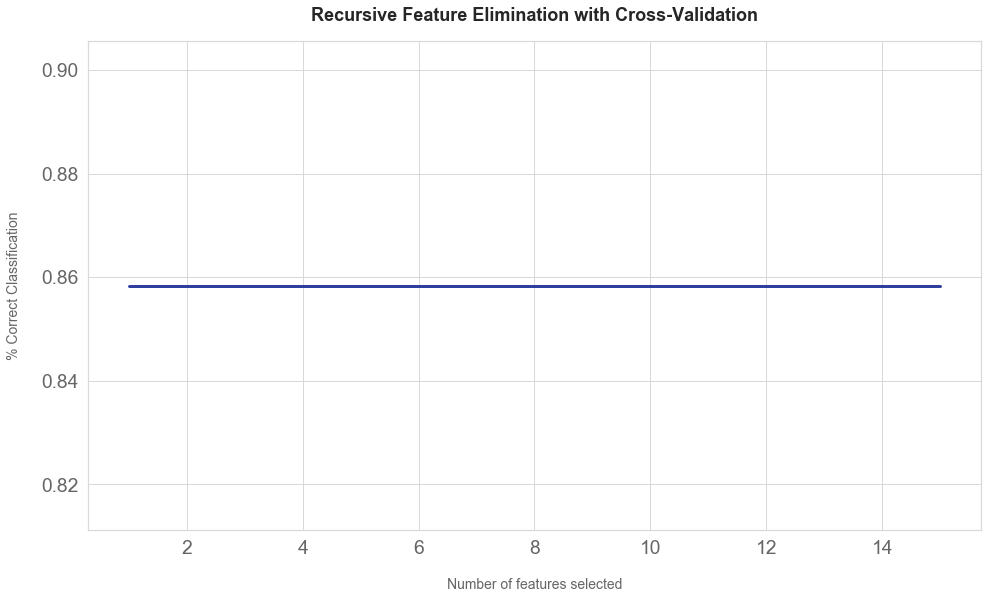

Optimal number of features: 1


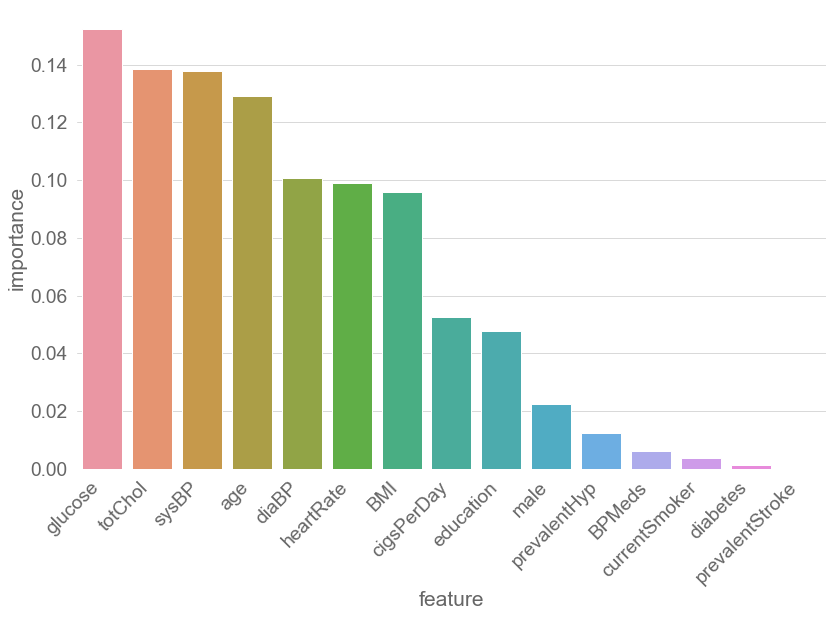

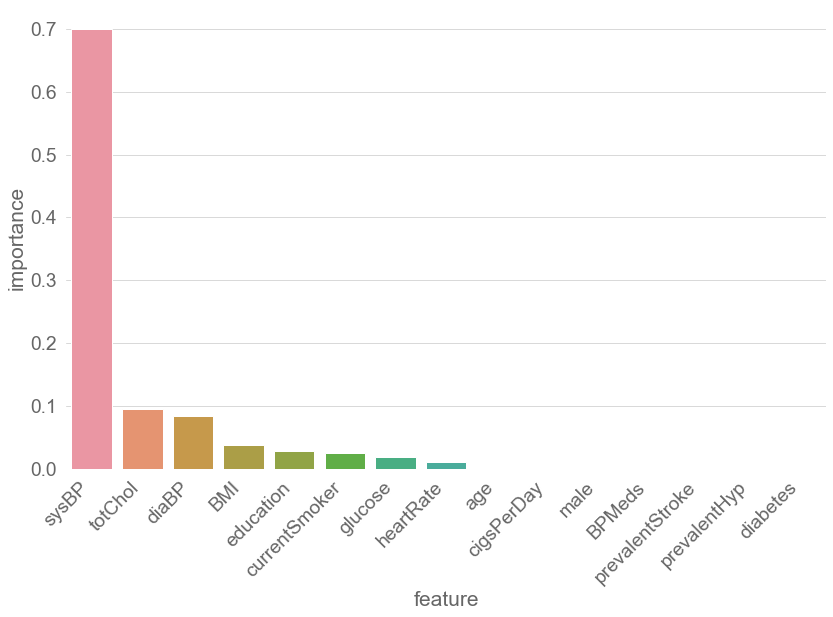

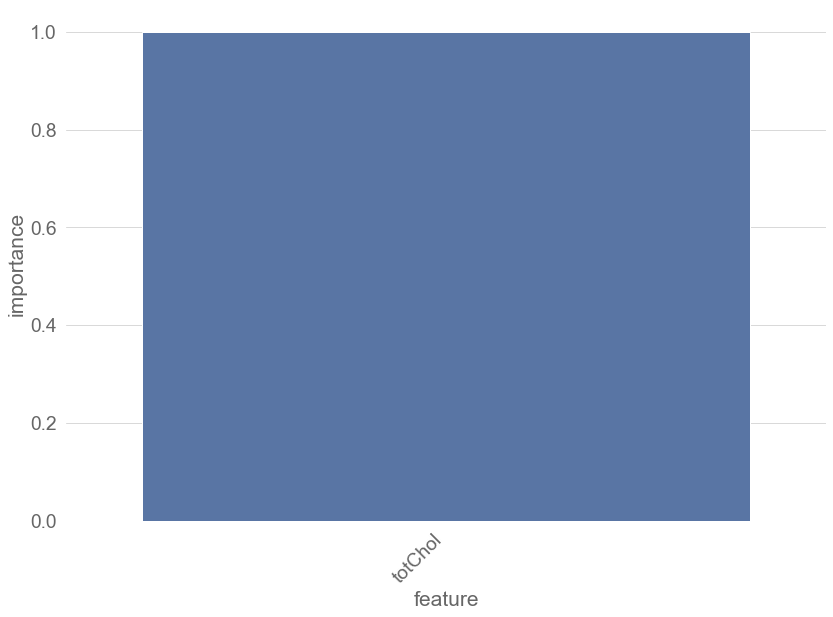

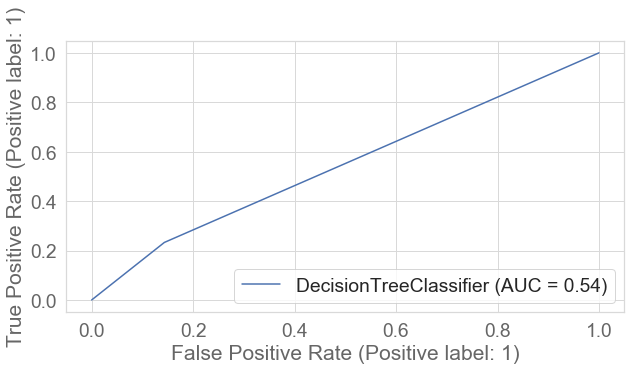

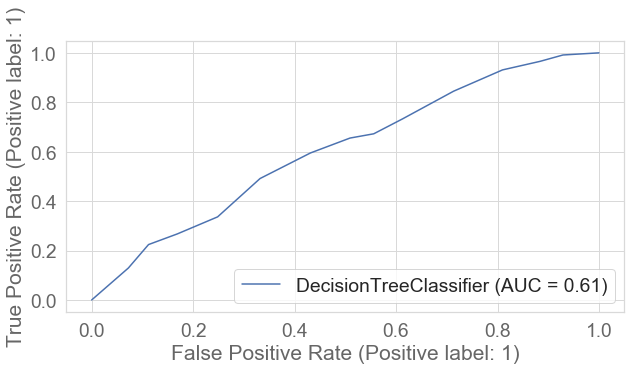

...

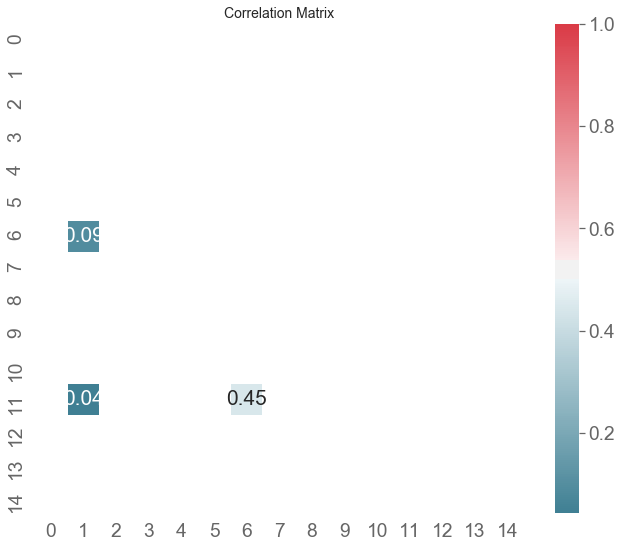

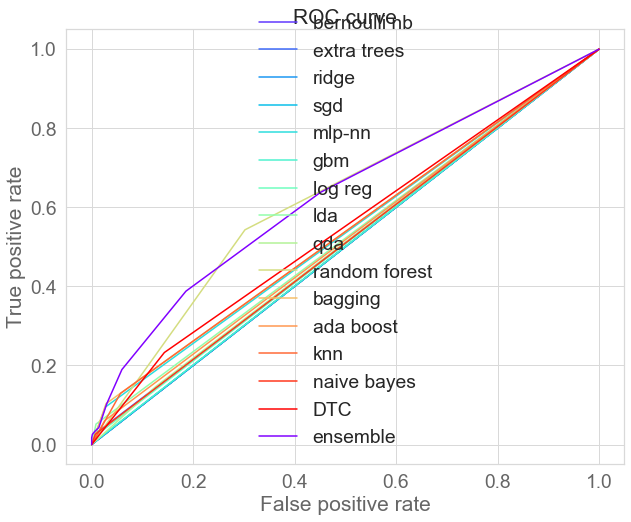

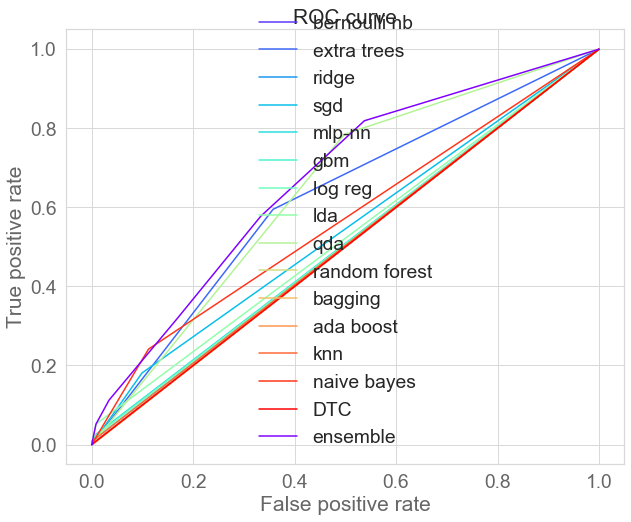

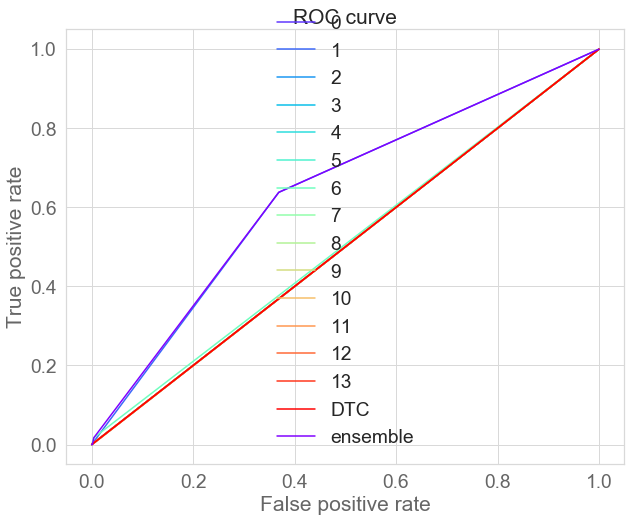

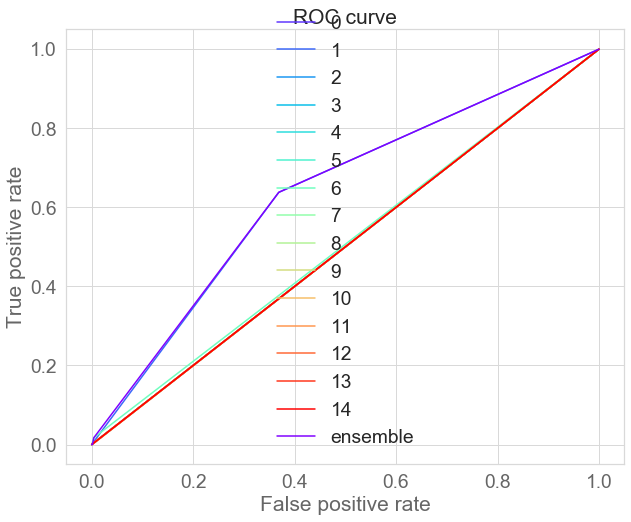

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
Done.



In [125]:
#Run the models:
def viewImportantFeatures(predictorTrain, model, modelName):
            # Extract feature importances - https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76
            # https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b
            sns.set(font_scale = 1.75)
            sns.set_style({"axes.facecolor": "1.0", "axes.edgecolor": "0.85", "grid.color": "0.85",
                           "grid.linestyle": "-", 'axes.labelcolor': '0.4', "xtick.color": "0.4",
                           'ytick.color': '0.4'})
            
            # Set figure size and create barplot
            f, ax = plt.subplots(figsize=(12, 9))

            featureImportance = pd.DataFrame({'feature': list(predictorTrain.columns),
                               'importance': model.feature_importances_}).sort_values('importance', ascending=False)

            # Display
            #plt.figure(figsize=(10, 10))
            chart = sns.barplot(x='feature', y='importance', data=featureImportance)
            chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
            
            # Generate a bolded horizontal line at y = 0
            #ax.axvline(x = 0, color = 'black', linewidth = 4, alpha = .7)
            
            # Turn frame off
            ax.set_frame_on(False)
            
            # Tight layout
            plt.tight_layout()
            
            # Save Figure
            #plt.savefig("feature_importance.png", dpi = 1080)
            
            #plt.show()

def plotConfusionMatrix(confusionM, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Oranges):
            """
            This function prints and plots the confusion matrix.
            Normalization can be applied by setting `normalize=True`.
            Source: http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
            """
            if normalize:
                confusionM = confusionM.astype('float') / confusionM.sum(axis=1)[:, np.newaxis]
                print("Normalized confusion matrix")
            else:
                print('Confusion matrix, without normalization')
    
            print(confusionM)
    
            # Plot the confusion matrix
            plt.figure(figsize=(10, 10))
            plt.imshow(confusionM, interpolation='nearest', cmap=cmap)
            plt.title(title, size=24)
            plt.colorbar(aspect=4)
            tick_marks = np.arange(len(classes))
            plt.xticks(tick_marks, classes, rotation=45, size=14)
            plt.yticks(tick_marks, classes, size=14)
    
            fmt = '.2f' if normalize else 'd'
            thresh = confusionM.max() / 2.
    
            # Labeling the plot
            for i, j in itertools.product(range(confusionM.shape[0]), range(confusionM.shape[1])):
                plt.text(j, i, format(confusionM[i, j], fmt), fontsize=20,
                         horizontalalignment="center",
                         color="white" if confusionM[i, j] > thresh else "black")
    
            plt.grid(None)
            plt.tight_layout()
            plt.ylabel('True label', size=18)
            plt.xlabel('Predicted label', size=18)
            plt.show()
            
def regressEnsemble(estimators, predictorTrain, targetTrain, predictorTest, targetTest):
            # https://www.datacamp.com/community/tutorials/ensemble-learning-python
            votingCLF = VotingClassifier(estimators=estimators, voting='hard', n_jobs=-1, verbose=True)
            votingCLF.fit(predictorTrain, targetTrain)
            predictions = votingCLF.predict(predictorTest)
            modelMetrics(targetTest, predictions)
            
            # metrics.plot_roc_curve(models[m], predictorTest, targetTest)

def plotRocCurveMultipleModels(modelsPrediction, targetTest, ensembleLabel):
            #Plot the roc curve for base learners and ensemble.
            baseLearner = modelsPrediction.values
            ensemble = modelsPrediction.mean(axis=1)
            labels = list(modelsPrediction.columns)
            plt.figure(figsize=(10, 8))
            plt.plot([0, 1], [0, 1], 'k--')
        
            cm = [plt.cm.rainbow(i)
              for i in np.linspace(0, 1.0, baseLearner.shape[1] + 1)]
        
            for i in range(baseLearner.shape[1]):
                p = baseLearner[:, i]
                fpr, tpr, _ = roc_curve(targetTest, p)
                plt.plot(fpr, tpr, label=labels[i], c=cm[i + 1])
        
            fpr, tpr, _ = roc_curve(targetTest, ensemble)
            plt.plot(fpr, tpr, label=ensembleLabel, c=cm[0])
        
            plt.xlabel('False positive rate')
            plt.ylabel('True positive rate')
            plt.title('ROC curve')
            plt.legend(frameon=False)
            plt.show()
            
#Given probability bin the predicted results are in            
def getPredictionProbability(probability, targetTest, predictorTest):
            #predProbability = result.predict(predictorTest)
            rowNumber = predictorTest.index.values
            bins = np.linspace(probability.min(), probability.max(), 5)
            probabilityBin = pd.cut(probability, bins, precision=1, include_lowest=True, right=True)
            probDF = pd.DataFrame({'Probability': probability, 'Target': targetTest.values, 'RowNumber': rowNumber, 'ProbabilityBin':probabilityBin})

            plt.figure(figsize=(25, 15))
            plt.subplot(121)
            sns.scatterplot('RowNumber', 'Probability', data=probDF, hue='Target')
            plt.subplot(122)
            plt.show()
            sns.countplot(x='ProbabilityBin', data=probDF, hue='Target')
            plt.show()
            
def randomizedSearch(paramGrid, m, predictorTrain, targetTrain, predictorTest, targetTest, aucScores, name):
            # train and predict each model with grid search CV
            kFold = StratifiedKFold(shuffle=True, random_state=50)
            #gscv = GridSearchCV(m, param_grid=paramGrid, cv = kFold,  n_jobs= -1, verbose = 1, scoring = "roc_auc")
            rscv = RandomizedSearchCV(m, param_distributions=paramGrid, n_jobs=-1, scoring='roc_auc', cv=kFold,
                                n_iter=100, verbose=1, random_state=30)  
            # Fit gscv
            print(f"Now tuning {m}.")
            rscv.fit(predictorTrain, np.ravel(targetTrain))  
            prediction = rscv.best_estimator_.predict(predictorTest)
            #rscvPredictions = rscvPredictions.rename(columns={i: name})
            
            #auc = metrics.roc_auc_score(targetTest, prediction)
            auc = roc_auc_score(targetTest, prediction)
            #bestRSParams.append(rscv.best_params_)
            bestParams = rscv.best_params_
            
            # update score for train and test
            aucScores.update({"Model": [name] + aucScores["Model"],
                   "AUC": [auc] + aucScores["AUC"],
                   "AUC Type": ["Test"] + aucScores["AUC Type"]})

            aucScores.update({"Model": [name] + aucScores["Model"],
                   "AUC": [rscv.best_score_] + aucScores["AUC"],
                   "AUC Type": ["Train"] + aucScores["AUC Type"]})
            
            plotLearningCurve(rscv.best_estimator_, 'Learning Curves', predictorTrain, targetTrain, 
                        cv = kFold, n_jobs = -1)
            #bestRSScores.append(rscv.best_score_)
            return rscv.best_estimator_, rscv.best_params_, prediction, aucScores

def plotLearningCurve(estimator, title, train, test, ylim = None, cv = None,
                        n_jobs = 1, trainSizes = np.linspace(0.1, 1.0, 5)):
            plt.figure()
            plt.title(title)
            if ylim is not None:
                plt.ylim(*ylim)
            plt.xlabel("Training examples")
            plt.ylabel("Score")
            trainSizes, trainScores, testScores = learning_curve(estimator, train, test, cv = cv,
                                                                 n_jobs = n_jobs, train_sizes = trainSizes)
            trainScoresMean = np.mean(trainScores, axis=1)
            trainScoresSTD = np.std(trainScores, axis=1)
            testScoresMean = np.mean(testScores, axis=1)
            testScoresSTD = np.std(testScores, axis=1)
            plt.grid()
        
            plt.fill_between(trainSizes, trainScoresMean - trainScoresSTD,
                             trainScoresMean + trainScoresSTD, alpha=0.1, color="r")
            plt.fill_between(trainSizes, testScoresMean - testScoresSTD,
                             testScoresMean + testScoresSTD, alpha=0.1, color="g")
            plt.plot(trainSizes, trainScoresMean, 'o-', color="r", label="Training score")
            plt.plot(trainSizes, testScoresMean, 'o-', color="g", label="Cross-validation score")
        
            plt.legend(loc="best")
            plt.show()

def visualizeScoreComparison(aucScores):
            # Set graph style
            sns.set(font_scale = 1.75)
            sns.set_style({"axes.facecolor": "1.0", "axes.edgecolor": "0.85", "grid.color": "0.85",
               "grid.linestyle": "-", 'axes.labelcolor': '0.4', "xtick.color": "0.4",
               'ytick.color': '0.4'})
    
            # Colors
            training_color = sns.color_palette("RdYlBu", 10)[1]
            test_color = sns.color_palette("RdYlBu", 10)[-2]
            colors = [training_color, test_color]
            
            # Set figure size and create barplot
            f, ax = plt.subplots(figsize=(12, 9))
            
            sns.barplot(x="AUC", y="Model", hue="AUC Type", palette = colors,
                        data=aucScores)
            
            # Generate a bolded horizontal line at y = 0
            ax.axvline(x = 0, color = 'black', linewidth = 4, alpha = .7)
            
            # Turn frame off
            ax.set_frame_on(False)
            
            # Tight layout
            plt.tight_layout()
            plt.show()
            
#without SMOTE: def regressMultipleModels(predictorTrain, predictorTest, targetTrain, targetTest):
    
def regressMultipleModels(overSamplePredictorTrain, predictorTest, overSampleTargetTrain, targetTest):    
            # https://mlfromscratch.com/gridsearch-keras-sklearn/#/
            # https://www.dataquest.io/blog/introduction-to-ensembles/ 
            modelList = getModelClassifiers()
            
            modelPredictions = np.zeros((targetTest.shape[0], len(modelList))) 
            modelPredictions = pd.DataFrame(modelPredictions)

            cvPredictions = np.zeros((targetTest.shape[0], len(modelList))) 
            cvPredictions = pd.DataFrame(cvPredictions)
            
            rscvPredictions = np.zeros((targetTest.shape[0], len(modelList))) 
            rscvPredictions = pd.DataFrame(rscvPredictions)
            
            rfecvPredictions = np.zeros((targetTest.shape[0], len(modelList))) # not applicable for 'knn', 'svm', 'naive bayes', 'mlp-nn', 'qda', 'bagging'
            rfecvPredictions = pd.DataFrame(rfecvPredictions)
            
            modelProbabilities = np.zeros((targetTest.shape[0], len(modelList))) # not applicable for ridge and SGD
            modelProbabilities = pd.DataFrame(modelProbabilities)
            
            modelParamGrids = getModelParam(predictorTrain, predictorTest, targetTrain, targetTest)
            print("Fitting models.")
            #probCols = list()
            #predCols = list()
            cols = list()
            estimators = list()
            estimatorToDrop = ['bernoulli nb']
            bestRSEstimators = list()
            ensembleEstimators = list() # estimators which support ensemble are copied from bestRSEstimators
            bestRSParams = list()
            
            aucScores = {  # Initialize the dictionary
                        "Model": [],
                        "AUC": [],
                        "AUC Type": []
                        }
            
            # bestRSScores = list()
            cvScores = list()
            rfeEstimators = list()
            # train and predict each model with all features
            for i, (name, m) in enumerate(modelList.items()):
                #
                # build model with all features and without CV
                #
                print("%s..." % name, end=" ", flush=False)
                if (name == 'bernoulli nb'):
                    m = BernoulliNB()

                m.fit(predictorTrain, targetTrain)
                    
                if (name not in ['ridge', 'sgd']):    #,'elastic net'
                    modelProbabilities.iloc[:, i] = m.predict_proba(predictorTest)[:, 1]
                    modelProbabilities = modelProbabilities.rename(columns={i: name})
                    getPredictionProbability(modelProbabilities.iloc[:, i], targetTest, predictorTest)
                    #probCols.append(name)
                    
                modelPredictions.iloc[:, i] = m.predict(predictorTest)
                #predCols.append(name)
                
                #cols.append(name)
                modelPredictions = modelPredictions.rename(columns={i: name})
                #estimators.append((name,m)) # do not delete extra bracket. It converts each item in the list into tuple
                print("done")
                #
                # build model with hyper parameter tuning and with CV
                #
                paramGrid = modelParamGrids[name]
                bestRSEstimator, bestRSParam, rsPrediction, aucScores  = randomizedSearch(paramGrid, m, predictorTrain, 
                                            targetTrain, predictorTest, targetTest, aucScores, name)
                rscvPredictions.iloc[:, i] = rsPrediction
                rscvPredictions = rscvPredictions.rename(columns={i: name})
                bestRSEstimators.append((name, bestRSEstimator))
                bestRSParams.append(bestRSParam)
                
                #
                # predict with cross_val_predict with CV
                #
                kFold = StratifiedKFold(shuffle=True, random_state=50)
                cvPredictions.iloc[:, i] = cross_val_predict(bestRSEstimator, predictorTest, targetTest, cv=kFold)
                cvPredictions = cvPredictions.rename(columns={i: name})
                cvScores.append((name, cross_val_score(bestRSEstimator, predictorTest, targetTest, cv=kFold)))
                #self.modelMetrics(targetTest, cvPredictions)-- cvPredictions is a dataframe.. use iloc 
                modelMetrics(targetTest, cvPredictions.iloc[:,i])
                plt.show()

                #
                # predict with recursive feature elimination and CV
                #
                if (name not in ['knn', 'svm', 'naive bayes', 'mlp-nn', 'qda', 'bagging']):
                    rfeCV = RFECV(estimator=bestRSEstimator, step=1, cv=kFold, scoring='accuracy')
                    rfeCV.fit(predictorTrain, targetTrain)
    
                    rfecvPredictions.iloc[:, i] = rfeCV.predict(predictorTest)
                    cvPredictions = rfecvPredictions.rename(columns={i: name})
                    
                    plt.figure(figsize=(16, 9))
                    plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
                    plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
                    plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)
                    plt.plot(range(1, len(rfeCV.grid_scores_) + 1), rfeCV.grid_scores_, color='#303F9F', linewidth=3)
                    
                    plt.show()

                #
                # Visualize
                #
                #,'elastic net' -- can use model.summary for lr and this
                if (name not in ['bernoulli nb', 'knn', 'svm', 'naive bayes', 'mlp-nn', 'lda', 'qda', 'bagging', 'ridge', 'sgd','log reg']):
                    print('Optimal number of features: {}'.format(rfeCV.n_features_))
                    rfeCV.estimator_.feature_importances_
                    viewImportantFeatures(predictorTrain, m, name)
                    viewImportantFeatures(predictorTrain, bestRSEstimator, name)
                    viewImportantFeatures(predictorTrain.iloc[:,0:rfeCV.n_features_], rfeCV.estimator_, name)

                plot_roc_curve(m, predictorTest, targetTest)
                plot_roc_curve(bestRSEstimator, predictorTest, targetTest)
                plot_roc_curve(rfeCV, predictorTest, targetTest)
                plt.show()
                # Update classifier parameters
                #tuned_params = {item[12:]: best_params[item] for item in best_params}
                #classifier.set_params(**tuned_params)

            aucScores = pd.DataFrame(aucScores)
            #modelPredictions.columns = cols
            #modelProbabilities.columns = cols
            #rscvPredictions.columns = cols
            #cvPredictions.columns = cols
            
            visualizeScoreComparison(aucScores)
            
            corrmat(modelPredictions.corr(), inflate=False)
            corrmat(rscvPredictions.corr(), inflate=False)
            corrmat(cvPredictions.corr(), inflate=False)
            corrmat(rfecvPredictions.corr(), inflate=False)
            
            plotRocCurveMultipleModels(modelPredictions, targetTest, 'ensemble')
            plotRocCurveMultipleModels(rscvPredictions, targetTest, 'ensemble')
            plotRocCurveMultipleModels(cvPredictions, targetTest, 'ensemble')
            plotRocCurveMultipleModels(rfecvPredictions, targetTest, 'ensemble')
            
            for i in range((len(bestRSEstimators))): # some models are not applicable for ensemble. They need to be dropped from bestRSEstimators
                if bestRSEstimators[i][0] not in estimatorToDrop: #[i][0] returns model name
                    ensembleEstimators.append(bestRSEstimators[i])
                    #del bestRSEstimators[i]
                print (i)     
            #regressEnsemble(ensembleEstimators, predictorTrain, targetTrain, predictorTest, targetTest)
            
            print("Done.\n")
            return modelPredictions, modelProbabilities, rscvPredictions, cvPredictions, rfecvPredictions, bestRSEstimators
        
modelPredictions, modelProbabilities, rscvPredictions, cvPredictions, rfecvPredictions, bestRSEstimators=regressMultipleModels(predictorTrain, predictorTest, targetTrain, targetTest)

In [130]:
bestRSEstimators

[('bernoulli nb', BernoulliNB(alpha=0.0001)),
 ('extra trees',
  ExtraTreesClassifier(class_weight='balanced', criterion='entropy', max_depth=6,
                       min_samples_leaf=0.01, min_samples_split=0.1, n_jobs=-1)),
 ('ridge', RidgeClassifier(alpha=1e-07)),
 ('sgd', SGDClassifier(alpha=0.001, n_jobs=-1, penalty='l1')),
 ('mlp-nn',
  MLPClassifier(activation='identity', hidden_layer_sizes=10,
                learning_rate='invscaling', random_state=30)),
 ('gbm',
  GradientBoostingClassifier(max_depth=2, max_features='log2',
                             min_samples_leaf=0.1, min_samples_split=0.1,
                             random_state=30, subsample=0.8)),
 ('log reg', LogisticRegression(random_state=0)),
 ('lda', LinearDiscriminantAnalysis()),
 ('qda', QuadraticDiscriminantAnalysis(reg_param=0.96)),
 ('random forest',
  RandomForestClassifier(bootstrap='True', max_depth=4, max_leaf_nodes=50,
                         min_samples_leaf=0.01, min_samples_split=0.005,
        

In [191]:
#1. df
#2. df+SMOTE -- this is #1
#3. df-outliers
#4. df-outliers+SMOTE-- #2
#5. df-outliers+SMOTE+bins+pct -- #4
#6. df-outliers+PCA -- #3 with and without outliers(can we combine PCA and smote?)
# pick top 5 models with good acc

    
    
#DF
#regressMultipleModels(predictorTrain, predictorTest, targetTrain, targetTest)
#DF+SMOTE
#regressMultipleModels(overSamplePredictorTrain, predictorTest, overSampleTargetTrain, targetTest)
#DF-outliers
#regressMultipleModels(predictorTraino, predictorTesto, targetTraino, targetTesto)
#cvPredictions.iloc[:,1] -- didn't work for elastic net 
#svm takes too long

# EVALUATION

###### Predict
Transform test data into PCA
Run the model against test data

Calculate the Accuracy
Generate confusion matrix
Draw AUC for each model
Display accuracy of each model in a tabular form


In [129]:
from random import random, randint
import os
mlflow.set_tracking_uri('http://3.238.235.44:5000')
mlflow.set_experiment('Logistic Regression Experiment')

with mlflow.start_run():
    
    params = {
        'penalty': 'l1',
        'solver': 'liblinear'
    }
    
    mlflow.log_params(params)
    mlflow.log_metric("Accuracy", random())
    mlflow.log_metric("AUC", random())
    
    '''
    # Log an artifact (output file)
    if not os.path.exists("outputs"):
        os.makedirs("outputs")
        
    with open("outputs/test.txt", "w") as f:
        f.write("my algo details " + str(random))
    mlflow.log_artifacts("outputs")
    '''

<a href='http://3.238.235.44:5000'><b>Click Here to see the tracking Server</b></a>

# THE END